The following code requires these data exported as csv file: timestamps of each event, Tone active, Bar press  active in anymaze. Settup these data to be exported under "Protocol-Reports-Test data report" and export all the test data under "File-Export-Export test data" in Anymaze with filename format as \[Stage\]\_\[AnimalID\]\_\[ExperimentFileName\]. For more information please refer to anymaze's manual. 

In [1]:
%%capture
%load_ext autoreload
%autoreload 2

%matplotlib inline
import numpy as np
import pandas as pd
import os
import glob
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.collections import PolyCollection
from matplotlib.colors import to_rgb
from matplotlib.colors import ListedColormap
from matplotlib.ticker import MaxNLocator
import matplotlib.cm as cm
import matplotlib.lines as mlines
import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.io as pio


import ntpath as nt
import re
import itertools as itt
import sys
import seaborn as sns
from scipy import stats
from scipy.stats import ttest_rel
from scipy.stats import ttest_ind
from scipy.stats import t
from scipy.stats import fisher_exact
from itertools import combinations
from statsmodels.stats.anova import AnovaRM
from statsmodels.sandbox.stats.multicomp import multipletests
from statsmodels.formula.api import mixedlm
from statsmodels.regression.mixed_linear_model import MixedLM
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, SpectralClustering, AffinityPropagation, AgglomerativeClustering, DBSCAN, MeanShift
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.metrics import calinski_harabasz_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pingouin as pg
from math import sqrt, pi
from sklearn.manifold import TSNE


#Put file directory here
base_dir = os.path.abspath('/scratch/09117/xz6783/minian/Behavior_Files/')



In [2]:
import matplotlib as mpl
plt.rcParams['font.family'] = 'Liberation Sans'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['text.color'] = 'k'
plt.rcParams['svg.fonttype'] = 'none'


In [3]:
def load_behavior_csv(base_dir, filename_prefix):
    """
    Reads behavior CSV files from a given directory, extracts animal IDs from filenames,
    and stores the contents in a dictionary keyed by these IDs.

    :param base_dir: The base directory where the files are located.
    :param filename_prefix: The prefix pattern to identify relevant CSV files.
    :return: A dictionary with animal IDs as keys and lists of DataFrames as values.
    """
    
    # Get a list of all files in the base directory and directly construct the full file paths for the relevant CSV files
    file_paths = [os.path.join(base_dir, file) for file in os.listdir(base_dir)
                      if file.startswith(filename_prefix) and file.endswith(".csv")]

    # Dictionary to hold the CSV contents, keyed by animal IDs
    animal_data = {}

    for file_path in file_paths:
        # Extract the filename from the path
        filename = os.path.basename(file_path)
        
        # Extract the animal ID from the filename
        parts = filename.split('_')
        if len(parts) > 2:
            animal_id = parts[1]  # Animal ID is between the first and second underscore

            # Read the CSV file
            df = pd.read_csv(file_path)

            # Add the DataFrame to the animal_data dictionary
            if animal_id not in animal_data:
                animal_data[animal_id] = [df]  # Initialize with a list containing the DataFrame
            else:
                animal_data[animal_id].append(df)  # Append the DataFrame to the existing list
        else:
            print(f"Filename format error: {filename}")

    return animal_data



In [4]:
#experiment parameters
cue_length = 15 
num_safe_cues = 12
num_threat_cues = 12

def process_cues(a):
    cue_changes = np.diff(a['Tone active'].values)
    cue_start_indices = np.where(cue_changes > 0)[0]+1
    cue_end_indices = np.where(cue_changes < 0)[0]
    return cue_start_indices, cue_end_indices


def calculate_latency(a, cue_start_indices, cue_end_indices, cue_length):
    time = a['Time (s)'].values
    bar_press_indices = np.where(np.diff(a['Bar Press active'].values) > 0)[0]+1
    latencies = []
    rewarded = []

    for start_idx, end_idx in zip(cue_start_indices, cue_end_indices):
        # Find bar presses that occurred after the cue start and before cue end
        valid_bar_presses = bar_press_indices[(bar_press_indices >= start_idx) & (bar_press_indices <= end_idx)]

        if valid_bar_presses.size > 0:
            # First bar press time minus cue start time
            latency = time[valid_bar_presses[0]] - time[start_idx]
            reward = True
        else:
            # Default latency if no bar press during the cue
            latency = cue_length
            reward = False

        latencies.append(latency)
        rewarded.append(reward)

    return latencies,rewarded

def calculate_continuous_average(a, column, cue_start_indices, cue_end_indices, cue_length):
    time = a['Time (s)'].values
    continuous_data = a[column].values
    cue_average = []
    cue_average_1s = []
    
    for start_idx, end_idx in zip(cue_start_indices, cue_end_indices):
        average = np.mean(continuous_data[start_idx:end_idx])
        diff = time - time[start_idx] - 1
        onesecondaftercue_index = list(diff).index(min(diff[diff>0]))
        average_1s = np.mean(continuous_data[start_idx:onesecondaftercue_index])

        cue_average.append(average)
        cue_average_1s.append(average_1s)

    return cue_average, cue_average_1s

def calculate_duration_cue(a, column, cue_start_indices, cue_length):
    # Extracting the time values from the DataFrame
    time = a['Time (s)'].values

    # Identifying indices where the animal is in the specified area
    area = np.where(a[column].values > 0)[0]

    # Finding indices where the animal enters (area_start) and exits (area_end) the area
    area_start = np.where(np.diff(a[column].values, prepend=0, append=0) > 0)[0]
    area_end = np.where(np.diff(a[column].values, prepend=0, append=0) < 0)[0]

    # Initializing an array to store the duration of time spent in the area for each cue
    area_durations = []

    for start_idx in cue_start_indices:
        # Calculating the end of the cue window based on cue length
        cue_window_end = start_idx + np.where(time[start_idx:] >= time[start_idx] + cue_length)[0][0]
        
        # Difference between all area indices and the current cue start index
        diff = area - start_idx
        duration = 0

        # Process each cue start index
        if len(diff[diff >= 0]) == 0:
            # No entry into the area after the cue start
            duration = 0
        elif area[list(diff).index(min(diff[diff >= 0]))] > cue_window_end:
            # The first entry into the area occurs after the cue window end
            duration = 0
        else:
            # Identifying the first area entry index after the cue start
            area_start_index = area[list(diff).index(min(diff[diff >= 0]))]
            
            # Finding all subsequent area entry indices within the cue window
            area_index_within = area_start[(area_start > area_start_index) & (area_start <= cue_window_end)]
            area_start_index = np.append(area_start_index, area_index_within)

            # Calculating the total duration in the area within the cue window
            for i in range(len(area_start_index)):
                # Finding the nearest area exit index for each entry
                area_end_index = area_end[area_end > area_start_index[i]].min()
                
                # Adjusting the exit index if it exceeds the cue window end
                if area_end_index > cue_window_end:
                    area_end_index = cue_window_end

                # Adding the period of presence in the area to the total duration
                period = time[area_end_index] - time[area_start_index[i]]
                duration += period

        # Convert the total duration to a percentage of the cue length
        percentage_duration = min(100, (duration / cue_length) * 100)
        area_durations.append(percentage_duration)

    return np.array(area_durations)

def calculate_duration(a, column, phase_time):
    time = a['Time (s)'].values
    area = np.where(a[column].values > 0)[0]
    area_start = np.where(np.diff(a[column].values, prepend=0, append=0) > 0)[0]
    area_end = np.where(np.diff(a[column].values, prepend=0, append=0) < 0)[0]

    start_idx = np.searchsorted(time, phase_time[0], side='left')
    end_idx = min(np.searchsorted(time, phase_time[1], side='right'), len(time)-1)

    # Convert to percentage of the total phase time
    phase_duration = time[end_idx] - time[start_idx]
    duration = 0
    diff = area - start_idx

    if len(diff[diff >= 0]) == 0:
        # No entry into the area after the phase start
        duration = 0
    elif area[list(diff).index(min(diff[diff >= 0]))] > end_idx:
        # The first entry into the area occurs after the phase end
        duration = 0
    else:
        # Identifying the first area entry index after the phase start
        area_start_index = area[list(diff).index(min(diff[diff >= 0]))]
        if (a[column].values[start_idx] > 0) & (len(area_end[(area_end >= start_idx) & (area_end <= end_idx)])==0):
            duration = phase_duration
        else:
            # Finding all subsequent area entry indices within the cue window
            area_index_within = area_start[(area_start > area_start_index) & (area_start <= end_idx)]
            area_start_index = np.append(area_start_index, area_index_within)
            
            # Calculating the total duration in the area within the phase
            for i in range(len(area_start_index)):
                    # Use the next area end or the phase end, whichever comes first
                    area_end_candidates = [idx for idx in area_end if idx > area_start_index[i]]
                    if area_end_candidates:
                        area_end_idx = min(area_end_candidates[0], end_idx)
                    else:
                        area_end_idx = end_idx

                    # Calculate the duration for this segment, ensuring indices are within bounds
                    area_end_idx = min(area_end_idx, len(time) - 1)
                    duration += time[area_end_idx] - time[area_start_index[i]]
                        
    percentage_duration = (duration / phase_duration) * 100 if phase_duration > 0 else 0
    
    return percentage_duration  


def analyze_behavior(dataframes, num_safe_cues, num_threat_cues, cue_length, min_time_length=30):
    # Initialize empty DataFrames for each category with 'animal_id' as the first column
    cue_based_categories = [
        'safe_food_area_cue', 'threat_food_area_cue', 'safe_hidden_area_cue', 'threat_hidden_area_cue', 
        'safe_latency', 'threat_latency', 'safe_rewarded', 'threat_rewarded', 
        'safe_freezing_cue', 'threat_freezing_cue', 'safe_speed_cue', 'threat_speed_cue',
       'safe_speed_cue_1s', 'threat_speed_cue_1s'
    ]

    phase_based_categories = [
        'safe_food_area', 'cat_food_area', 'threat_food_area',
        'safe_hidden_area', 'cat_hidden_area', 'threat_hidden_area',
        'safe_freezing', 'cat_freezing', 'threat_freezing'
    ]
    
    # Initialize DataFrames for cue-based categories
    results = {category: pd.DataFrame(columns=['animal_id'] + [f'Cue {i+1}' for i in range(max(num_safe_cues, num_threat_cues))]) for category in cue_based_categories}

    # Initialize DataFrames for phase-based categories
    results.update({category: pd.DataFrame(columns=['animal_id', 'Data']) for category in phase_based_categories})


    for animal_id, dfs in dataframes.items():
        if len(dfs) != 1:
            raise ValueError(f"Expected 1 DataFrame for animal ID {animal_id}, got {len(dfs)}")
        df = dfs[0]  # Extract the single DataFrame from the list

        if df['Time (s)'].iloc[-1] - df['Time (s)'].iloc[0] < min_time_length:
            print(f"Skipping animal ID {animal_id} due to insufficient time length.")
            continue

        cue_start_indices, cue_end_indices = process_cues(df)

        # Splitting the data for safe and threat cues
        safe_indices = slice(0, num_safe_cues)
        threat_indices = slice(num_safe_cues, num_safe_cues + num_threat_cues)
        
        #Splitting the data for safe, cat odor, and threat phases
        safe_phase = [0, 600] #Safe phase
        cat_phase = [600, 1200] #Cat odor phase
        threat_phase = [1200, 1800] #Threat phase
        

        # Latency Processing 
        latency, rewarded = calculate_latency(df, cue_start_indices, cue_end_indices, cue_length)
        
        # Area Duration Processing with Cue Length Cap
        food_area_duration_cue = calculate_duration_cue(df, 'In Food Area', cue_start_indices, cue_length)
        hidden_area_duration_cue = calculate_duration_cue(df, 'In Hidden Area', cue_start_indices, cue_length)
        
        # Freezing calculation during cue
        freezing_cue = calculate_duration_cue(df, 'Freezing', cue_start_indices, cue_length)
        
        #Speed during cue
        speed_cue, speed_cue_1s = calculate_continuous_average(df, 'Speed (m/s)', cue_start_indices, cue_end_indices, cue_length)

        # Calculate durations for different phases
        safe_food_area = calculate_duration(df, 'In Food Area', safe_phase)
        cat_food_area = calculate_duration(df, 'In Food Area', cat_phase)
        threat_food_area = calculate_duration(df, 'In Food Area', threat_phase)

        safe_hidden_area = calculate_duration(df, 'In Hidden Area', safe_phase)
        cat_hidden_area = calculate_duration(df, 'In Hidden Area', cat_phase)
        threat_hidden_area = calculate_duration(df, 'In Hidden Area', threat_phase)

        safe_freezing = calculate_duration(df, 'Freezing', safe_phase)
        cat_freezing = calculate_duration(df, 'Freezing', cat_phase)
        threat_freezing = calculate_duration(df, 'Freezing', threat_phase)


        
        # Append results for each DataFrame to the respective DataFrame in 'results', including animal ID
        for category, data in zip(cue_based_categories, [food_area_duration_cue, food_area_duration_cue, hidden_area_duration_cue, hidden_area_duration_cue, latency, latency, rewarded, rewarded, freezing_cue, freezing_cue, speed_cue, speed_cue, speed_cue_1s, speed_cue_1s]):
            if 'safe' in category:
                data_segment = data[safe_indices]
                
            else:
                data_segment = data[threat_indices]
            row = [animal_id] + list(data_segment) + [np.nan] * (results[category].shape[1] - 1 - len(data_segment))
            results[category].loc[len(results[category])] = row
        
        # Append results for phase-based calculations

        results['safe_food_area'].loc[len(results['safe_food_area'])] = [animal_id, safe_food_area]
        results['cat_food_area'].loc[len(results['cat_food_area'])] = [animal_id, cat_food_area]
        results['threat_food_area'].loc[len(results['threat_food_area'])] = [animal_id, threat_food_area]

        results['safe_hidden_area'].loc[len(results['safe_hidden_area'])] = [animal_id, safe_hidden_area]
        results['cat_hidden_area'].loc[len(results['cat_hidden_area'])] = [animal_id, cat_hidden_area]
        results['threat_hidden_area'].loc[len(results['threat_hidden_area'])] = [animal_id, threat_hidden_area]

        results['safe_freezing'].loc[len(results['safe_freezing'])] = [animal_id, safe_freezing]
        results['cat_freezing'].loc[len(results['cat_freezing'])] = [animal_id, cat_freezing]
        results['threat_freezing'].loc[len(results['threat_freezing'])] = [animal_id, threat_freezing]

    return results


In [5]:
experiment = 'Day 2 - Cat Odor Conflict'
conflict_day = load_behavior_csv(base_dir, experiment)

/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.3, the latest is 0.5.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [6]:
behavior_results = analyze_behavior(conflict_day, num_safe_cues=12, num_threat_cues=12, cue_length=15)


Skipping animal ID 2S5 due to insufficient time length.
Skipping animal ID 8M6 due to insufficient time length.


In [7]:
behavior_results

{'safe_food_area_cue':    animal_id       Cue 1       Cue 2       Cue 3      Cue 4       Cue 5  \
 0        6H6  100.000000   63.200000   65.113333  59.133333   38.740000   
 1        6M6   68.060000   70.373333   42.140000  63.466667   12.033333   
 2        2N6  100.000000   72.033333   69.360000  57.500000   66.493333   
 3        7H6   61.540000  100.000000   67.500000  90.066667   45.566667   
 4        4B6    0.000000   80.653333   39.193333  10.673333   39.286667   
 5        1H6   23.993333   30.593333   80.753333  32.853333   35.933333   
 6        8H6   78.506667    0.000000   98.440000  29.700000   92.240000   
 7        2B6   84.833333   96.786667   75.980000  82.786667   16.820000   
 8        1S5   73.793333   21.746667   47.160000  11.560000   82.273333   
 9        3N6   80.166667  100.000000  100.000000   0.000000   94.406667   
 10       5B6   60.626667   89.206667   96.120000  59.113333  100.000000   
 11       6S5   15.000000  100.000000  100.000000   8.913333  100.

In [8]:
# Extracting 'Data' column for safe and threat areas
safe_food_area = behavior_results['safe_food_area']['Data']
threat_food_area = behavior_results['threat_food_area']['Data']

# Ensure both datasets have the same length
if len(safe_food_area) == len(threat_food_area):
    t_stat, p_value = stats.ttest_rel(safe_food_area, threat_food_area)
    print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
else:
    print("Datasets are not of equal length, cannot perform paired t-test.")
behavior_results['safe_food_area'].merge(behavior_results['threat_food_area'], on ='animal_id')

Paired t-test results: t-statistic = 4.600782482690214, p-value = 0.00017303002679552377


,animal_id,Data_x,Data_y
0,6H6,61.674586,74.716134
1,6M6,20.479263,8.036191
2,2N6,58.601806,44.290155
3,7H6,52.359002,42.899859
4,4B6,43.094917,19.922937
5,1H6,20.258228,11.565975
6,8H6,32.663078,43.092465
7,2B6,40.153023,48.639591
8,1S5,37.858900,43.178780
9,3N6,46.528974,35.147804


In [9]:
def boxplot_with_lines(ax, data1, data2, data1_name, data2_name, title, y_label, ylim, line_width=0.6):
    # Extracting the first part of the variable names for x-tick labels
    data1_label = data1_name
    data2_label = data2_name
    
    value1 = data1['Data']
    value2 = data2['Data']
    # Perform paired t-test
    if len(value1) != len(value2):
        print("Datasets are not of equal length, cannot perform paired t-test.")
        return

    # Normality test
    normality1 = stats.shapiro(value1)
    normality2 = stats.shapiro(value2)
    print(f"Normality test results for value1: Statistics = {normality1[0]}, p-value = {normality1[1]}")
    print(f"Normality test results for value2: Statistics = {normality2[0]}, p-value = {normality2[1]}")

    # Check if both datasets are normally distributed
    if normality1[1] > 0.05 and normality2[1] > 0.05:
        # Perform paired t-test
        t_stat, p_value = stats.ttest_rel(value1, value2)
        print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
    else:
        # Perform Wilcoxon signed-rank test
        w_stat, p_value = stats.wilcoxon(value1, value2)
        print(f"Wilcoxon signed-rank test results: Statistics = {w_stat}, p-value = {p_value}")

    if len(data1) != len(data2):
        print("Datasets are not of equal length, cannot perform paired t-test.")
        return

    # Combining data for the plot
    combined_data = pd.DataFrame({data1_label: value1, data2_label: value2})

    # Plot the box plots for data1 and data2
    ax.boxplot(combined_data[data1_label], positions=[0], widths=0.5, patch_artist=True,
               boxprops=dict(facecolor='#2680ff', lw=line_width),
               medianprops=dict(color="black", linewidth=line_width),
               whiskerprops=dict(linewidth=line_width))
    ax.boxplot(combined_data[data2_label], positions=[1], widths=0.5, patch_artist=True,
               boxprops=dict(facecolor='#ff310d', lw=line_width),
               medianprops=dict(color="black", linewidth=line_width),
               whiskerprops=dict(linewidth=line_width))

    # Draw connecting lines between corresponding data1 and data2 values
    for val1, val2 in zip(combined_data[data1_label], combined_data[data2_label]):
        ax.plot([0, 1], [val1, val2], color='darkgray', linestyle='-', linewidth=0.5, zorder=3)

    # Customize the plot
    ax.set_ylim(*ylim)
    ax.set_xticks([0, 1])
    ax.set_xticklabels([data1_label, data2_label], fontsize=8)
    ax.set_title(title, fontsize=6, pad = 25)
    ax.set_ylabel(y_label, fontsize=10)
    ax.tick_params(labelsize=8)
    sns.despine()

    # Adjust for significance annotation
    if p_value < 0.05:
        y_max = min(max(combined_data.max())*1.05, ylim[1]*1.05)
        ax.plot([-0.1, 0.1, 0.9, 1.1], [y_max, y_max, y_max, y_max], lw=0.8, c='k', clip_on=False)
        ax.text(0.5, y_max, "*", ha='center', va='bottom', color='k', fontsize=16)

    
def scatterplot_with_lines(ax, data1, data2, data1_name, data2_name, title, y_label, ylim=(None, 100), point_size=8, line_width=0.6):
    # Extracting the first part of the variable names for x-tick labels
    data1_label = data1_name
    data2_label = data2_name

    value1 = data1['Data']
    value2 = data2['Data']
    # Perform paired t-test
    if len(value1) != len(value2):
        print("Datasets are not of equal length, cannot perform paired t-test.")
        return

    # Normality test
    normality1 = stats.shapiro(value1)
    normality2 = stats.shapiro(value2)
    print(f"Normality test results for value1: Statistics = {normality1[0]}, p-value = {normality1[1]}")
    print(f"Normality test results for value2: Statistics = {normality2[0]}, p-value = {normality2[1]}")

    # Check if both datasets are normally distributed
    if normality1[1] > 0.05 and normality2[1] > 0.05:
        # Perform paired t-test
        t_stat, p_value = stats.ttest_rel(value1, value2)
        print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
    else:
        # Perform Wilcoxon signed-rank test
        w_stat, p_value = stats.wilcoxon(value1, value2)
        print(f"Wilcoxon signed-rank test results: Statistics = {w_stat}, p-value = {p_value}")

    if len(data1) != len(data2):
        print("Datasets are not of equal length, cannot perform paired t-test.")
        return

    # Combining data for the plot
    combined_data = pd.DataFrame({data1_label: value1, data2_label: value2})

    # Adjust the x-coordinates for plotting
    x_coords = [0, 1]

    # Plotting lines and points for each data point
    for idx, row in combined_data.iterrows():
        ax.plot(x_coords, [row[data1_label], row[data2_label]], color='lightgray', linestyle='-', linewidth=line_width)
        ax.scatter(x_coords, [row[data1_label], row[data2_label]], color='#2680ff', 
                   edgecolors='gray', alpha=1, clip_on=False, s=point_size, lw=line_width, zorder=3)

    # Customizing plot
    ax.set_ylim(*ylim)
    ax.set_xticks(x_coords)
    ax.set_xticklabels([data1_label, data2_label], fontsize=8)
    ax.set_title(title, fontsize=6, pad = 25)
    ax.set_ylabel(y_label, fontsize=10)
    ax.tick_params(labelsize=8)

    # Checking for significance to add asterisk
    if p_value < 0.05:
        y_max = min(max(combined_data.max())*1.05, ylim[1]*1.05)
        ax.plot([0, 0, 1, 1], [y_max, y_max, y_max, y_max], lw=0.8, c='k', clip_on=False)
        ax.text(0.5, y_max, "*", ha='center', va='bottom', color='k', fontsize=16)

    ax.margins(x=0.5)  # Adds padding to the x-axis
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

def violinplot_with_dots_lines(ax, data1, data2, data1_name, data2_name, title, y_label, ylim, point_size=8, line_width=0.6):
    value1 = data1['Data']
    value2 = data2['Data']
    # Perform paired t-test
    if len(value1) != len(value2):
        print("Datasets are not of equal length, cannot perform paired t-test.")
        return

    # Normality test
    normality1 = stats.shapiro(value1)
    normality2 = stats.shapiro(value2)
    print(f"Normality test results for value1: Statistics = {normality1[0]}, p-value = {normality1[1]}")
    print(f"Normality test results for value2: Statistics = {normality2[0]}, p-value = {normality2[1]}")

    # Check if both datasets are normally distributed
    if normality1[1] > 0.05 and normality2[1] > 0.05:
        # Perform paired t-test
        t_stat, p_value = stats.ttest_rel(value1, value2)
        print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
    else:
        # Perform Wilcoxon signed-rank test
        w_stat, p_value = stats.wilcoxon(value1, value2)
        print(f"Wilcoxon signed-rank test results: Statistics = {w_stat}, p-value = {p_value}")

    # First, create a copy to manipulate for plotting
    dt1 = data1.copy()
    dt2 = data2.copy()
    dt1['Condition'] = data1_name
    dt2['Condition'] = data2_name
    plot_data = pd.concat([dt1, dt2])

    # Assign numeric x positions based on 'Sex' and 'Condition'
    plot_data.loc[(plot_data['Condition'] == data1_name), 'PlotSex'] = 0
    plot_data.loc[(plot_data['Condition'] == data2_name), 'PlotSex'] = 1

    # Plot the violin plot with adjusted positions
    sns.violinplot(x='PlotSex', y='Data', hue = 'Condition', data=plot_data, fill=False, split=False, dodge=False,
                   linewidth=1.4, palette=["#2680ff", "#ff310d"], width=0.6, inner='quart', cut=0, ax=ax)

    plt.setp(ax.collections, alpha=.8)

    
    #Adjust linestyle for mean
    for l in ax.lines[1::3]:
        l.set_linestyle('-')    

    # Plot the scatter plot with connecting lines
    combined_data = pd.DataFrame({data1_name: value1, data2_name: value2})

    x_coords = [0, 1]
    for idx, row in combined_data.iterrows():
        ax.plot(x_coords, [row[data1_name], row[data2_name]], color='darkgray', linestyle='-', linewidth=line_width)
        ax.scatter([x_coords[0]], [row[data1_name]], color='#2680ff', edgecolors='gray', alpha=1, clip_on=False, s=point_size, lw=line_width, zorder=3)
        ax.scatter([x_coords[1]], [row[data2_name]], color='#ff310d', edgecolors='gray', alpha=1, clip_on=False, s=point_size, lw=line_width, zorder=3)


    # Customize the plot
    ax.legend().remove()
    ax.set_xticks([x_coords[0], x_coords[1]])
    ax.set_xticklabels([data1_name, data2_name], fontsize=8)
    ax.set_xlabel(None)
    ax.set_title(title, fontsize=6, pad = 25)
    ax.set_ylabel(y_label, fontsize=10)
    ax.set_ylim(*ylim)
    ax.tick_params(labelsize=8)
    sns.despine()
    ax.margins(x=0.1)

    # Adjust for significance annotation
    if p_value < 0.05:
        y_max = min(max(combined_data.max())*1.05, ylim[1]*1.05)
        ax.plot([x_coords[0], x_coords[0], x_coords[1], x_coords[1]], [y_max, y_max, y_max, y_max], lw=0.8, c='k', clip_on=False)
        ax.text(0.5, y_max, "*", ha='center', va='bottom', color='k', fontsize=16)
    
def generate_symmetric_points(center, spread, n_points):
    if n_points == 1:
        return np.array([center])
    else:
        offsets = np.linspace(-spread, spread, n_points)
        return center + offsets

def group_values_with_indices(values, threshold):
    sorted_indices = np.argsort(values)
    sorted_values = values[sorted_indices]
    groups = [([sorted_values[0]], [sorted_indices[0]])]
    for i in range(1, len(values)):
        if abs(sorted_values[i] - groups[-1][0][-1]) <= threshold:
            groups[-1][0].append(sorted_values[i])
            groups[-1][1].append(sorted_indices[i])
        else:
            groups.append(([sorted_values[i]], [sorted_indices[i]]))
    return groups

def split_violin_with_dots_lines(ax, data1, data2, data1_name, data2_name, title, y_label, ylim, point_size=8, line_width=0.6):
    
    value1 = data1['Data']
    value2 = data2['Data']
    # Perform paired t-test
    if len(value1) != len(value2):
        print("Datasets are not of equal length, cannot perform paired t-test.")
        return

    # Normality test
    normality1 = stats.shapiro(value1)
    normality2 = stats.shapiro(value2)
    print(f"Normality test results for value1: Statistics = {normality1[0]}, p-value = {normality1[1]}")
    print(f"Normality test results for value2: Statistics = {normality2[0]}, p-value = {normality2[1]}")

    # Check if both datasets are normally distributed
    if normality1[1] > 0.05 and normality2[1] > 0.05:
        # Perform paired t-test
        t_stat, p_value = stats.ttest_rel(value1, value2)
        print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
    else:
        # Perform Wilcoxon signed-rank test
        w_stat, p_value = stats.wilcoxon(value1, value2)
        print(f"Wilcoxon signed-rank test results: Statistics = {w_stat}, p-value = {p_value}")

    # First, create a copy to manipulate for plotting
    dt1 = data1.copy()
    dt2 = data2.copy()
    dt1['Condition'] = data1_name
    dt2['Condition'] = data2_name
    combined_data = pd.concat([dt1, dt2])
    plot_data = combined_data.copy()

    # Assign numeric x positions based on 'Sex' and 'Condition'
    plot_data.loc[(plot_data['Condition'] == data1_name), 'PlotSex'] = 0
    plot_data.loc[(plot_data['Condition'] == data2_name), 'PlotSex'] = 1

    # Plot the violin plot with adjusted positions
    sns.violinplot(x='PlotSex', y='Data', hue='Condition', data=plot_data, fill=False, split=True, dodge=1,
                   linewidth=1.4, palette=["#2680ff", "#ff310d"], width=1, inner='quart', cut=0, ax=ax)

    plt.setp(ax.collections, alpha=.6)
    
    #Adjust linestyle for mean
    for l in ax.lines[1::3]:
        l.set_linestyle('-')

    # Adjust for offset and coordinates
    spread = 0.1
    x_coords_cond = {data1_name: 0, data2_name: 1}

    # Store coordinates for connecting lines
    coords = {}

    # Process each sex and condition combination
    for condition, group_data in combined_data.groupby('Condition'):
        grouped_values = group_values_with_indices(group_data['Data'].values, ylim[1]*0.01)

        for group, indices in grouped_values:
            x_coords = generate_symmetric_points(x_coords_cond[condition], spread, len(group))
            
            for i, idx in enumerate(indices):
                original_idx = group_data.iloc[idx].name  # Correct index from group_data
                x_coord = x_coords[i]
                y_value = group_data.loc[original_idx, 'Data']

                # Store the coordinates for lines
                coords[(original_idx, condition)] = (x_coord, y_value)

                # Plot the individual scatter points
                color = '#2680ff' if condition == 'Safe' else '#ff310d'
                ax.scatter(x_coord, y_value, color=color, edgecolors='gray', alpha=0.9, clip_on=False, s=point_size, lw=line_width, zorder=3)

    # Draw connecting lines using stored coordinates
    for animal_id in combined_data['animal_id'].unique():
        animal_data = combined_data[combined_data['animal_id'] == animal_id]

        data1_key = next((key for key in coords if key[0] in animal_data.index and key[1] == data1_name), None)
        data2_key = next((key for key in coords if key[0] in animal_data.index and key[1] == data2_name), None)
        if data1_key and data2_key:
            data1_coord = coords[data1_key]
            data2_coord = coords[data2_key]
            ax.plot([data1_coord[0], data2_coord[0]], [data1_coord[1], data2_coord[1]], 
                    color='gray', alpha=0.5, linewidth=line_width)
    # Adjust for significance annotation
    if p_value < 0.05:
        y_max = min(combined_data['Data'].max()*1.05, ylim[1]*1.05)
        ax.plot([x_coords_cond[data1_name], x_coords_cond[data1_name], x_coords_cond[data2_name], x_coords_cond[data2_name]], [y_max, y_max, y_max, y_max], lw=0.8, c='k', clip_on=False)
        ax.text(0.5, y_max, "*", ha='center', va='bottom', color='k', fontsize=16)
    
    # Remove the legend
    ax.legend().remove()
    ax.set_xticks([x_coords_cond[data1_name], x_coords_cond[data2_name]])
    ax.set_xticklabels([data1_name, data2_name], fontsize=8, rotation=45, ha='right')
    ax.set_xlabel(None)
    ax.set_title(title, fontsize=6, pad = 25)
    ax.set_ylabel(y_label, fontsize=8)
    ax.set_ylim(*ylim)
    ax.tick_params(labelsize=8)
    sns.despine() 
    ax.margins(x=0.2)



Normality test results for value1: Statistics = 0.9229272603988647, p-value = 0.0993049293756485
Normality test results for value2: Statistics = 0.9279048442840576, p-value = 0.1249588280916214
Paired t-test results: t-statistic = 4.600782482690214, p-value = 0.00017303002679552377
Normality test results for value1: Statistics = 0.9229272603988647, p-value = 0.0993049293756485
Normality test results for value2: Statistics = 0.9279048442840576, p-value = 0.1249588280916214
Paired t-test results: t-statistic = 4.600782482690214, p-value = 0.00017303002679552377
Normality test results for value1: Statistics = 0.9229272603988647, p-value = 0.0993049293756485
Normality test results for value2: Statistics = 0.9279048442840576, p-value = 0.1249588280916214
Paired t-test results: t-statistic = 4.600782482690214, p-value = 0.00017303002679552377
Normality test results for value1: Statistics = 0.9229272603988647, p-value = 0.0993049293756485
Normality test results for value2: Statistics = 0.9279

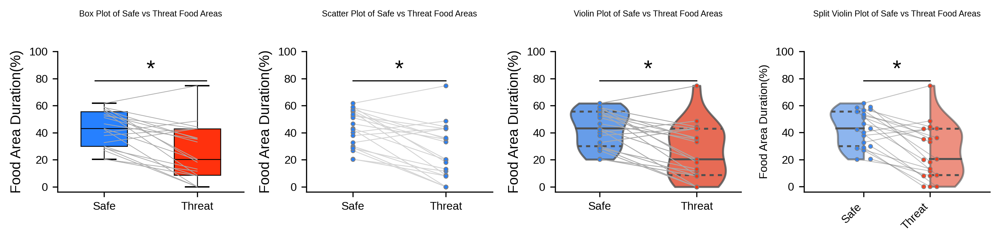

In [10]:
safe_food_area = behavior_results['safe_food_area']
threat_food_area = behavior_results['threat_food_area']
title_box = 'Box Plot of Safe vs Threat Food Areas'
title_scatter = 'Scatter Plot of Safe vs Threat Food Areas'
title_violin = 'Violin Plot of Safe vs Threat Food Areas'
title_splitviolin = 'Split Violin Plot of Safe vs Threat Food Areas'
figsize = (10, 2.5)  # Adjusted for 4 subplots side by side

y_label = 'Food Area Duration(%)'
ylim = (None, 100)

# Create a figure with 4 subplots
fig, axs = plt.subplots(1, 4, figsize=figsize, dpi=300)


# First Plot - Boxplot with Lines
boxplot_with_lines(axs[0], safe_food_area, threat_food_area, 'Safe', 'Threat',title_box, y_label, ylim)

# Second Plot - Scatterplot with Lines
scatterplot_with_lines(axs[1], safe_food_area, threat_food_area, 'Safe', 'Threat',title_scatter, y_label, ylim)

# Third Plot - Violinplot with Dots and Lines
violinplot_with_dots_lines(axs[2], safe_food_area, threat_food_area, 'Safe', 'Threat',title_violin, y_label, ylim)

# Fourth Plot - Split Violin Plot with Dots and Lines
split_violin_with_dots_lines(axs[3], safe_food_area, threat_food_area, 'Safe', 'Threat',title_splitviolin, y_label, ylim)

plt.tight_layout()
plt.show()

Normality test results for value1: Statistics = 0.951744019985199, p-value = 0.3673356771469116
Normality test results for value2: Statistics = 0.9473102688789368, p-value = 0.30271002650260925
Paired t-test results: t-statistic = -5.273170128937356, p-value = 3.679957585036185e-05
Normality test results for value1: Statistics = 0.951744019985199, p-value = 0.3673356771469116
Normality test results for value2: Statistics = 0.9473102688789368, p-value = 0.30271002650260925
Paired t-test results: t-statistic = -5.273170128937356, p-value = 3.679957585036185e-05
Normality test results for value1: Statistics = 0.951744019985199, p-value = 0.3673356771469116
Normality test results for value2: Statistics = 0.9473102688789368, p-value = 0.30271002650260925
Paired t-test results: t-statistic = -5.273170128937356, p-value = 3.679957585036185e-05
Normality test results for value1: Statistics = 0.951744019985199, p-value = 0.3673356771469116
Normality test results for value2: Statistics = 0.94731

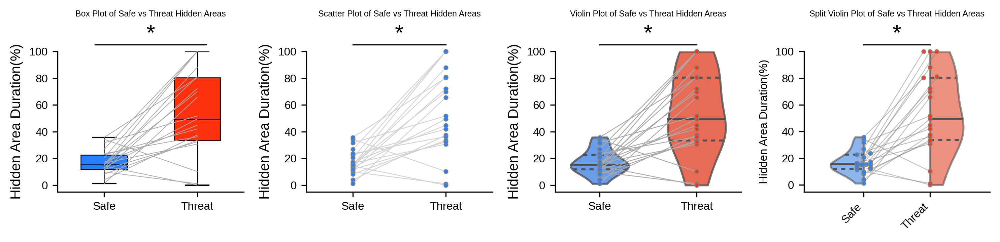

In [11]:
safe_hidden_area = behavior_results['safe_hidden_area']
threat_hidden_area = behavior_results['threat_hidden_area']
title_box = 'Box Plot of Safe vs Threat Hidden Areas'
title_scatter = 'Scatter Plot of Safe vs Threat Hidden Areas'
title_violin = 'Violin Plot of Safe vs Threat Hidden Areas'
title_splitviolin = 'Split Violin Plot of Safe vs Threat Hidden Areas'
figsize = (10, 2.5)  # Adjusted for 4 subplots side by side

y_label = 'Hidden Area Duration(%)'
ylim = (None, 100)

# Create a figure with 4 subplots
fig, axs = plt.subplots(1, 4, figsize=figsize, dpi=300)


# First Plot - Boxplot with Lines
boxplot_with_lines(axs[0], safe_hidden_area, threat_hidden_area, 'Safe', 'Threat',title_box, y_label, ylim)

# Second Plot - Scatterplot with Lines
scatterplot_with_lines(axs[1], safe_hidden_area, threat_hidden_area, 'Safe', 'Threat',title_scatter, y_label, ylim)

# Third Plot - Violinplot with Dots and Lines
violinplot_with_dots_lines(axs[2], safe_hidden_area, threat_hidden_area, 'Safe', 'Threat',title_violin, y_label, ylim)

# Fourth Plot - Split Violin Plot with Dots and Lines
split_violin_with_dots_lines(axs[3], safe_hidden_area, threat_hidden_area, 'Safe', 'Threat',title_splitviolin, y_label, ylim)

plt.tight_layout()
plt.show()

Normality test results for value1: Statistics = 0.6405619382858276, p-value = 5.45092052561813e-06
Normality test results for value2: Statistics = 0.8376583456993103, p-value = 0.0026226663030683994
Wilcoxon signed-rank test results: Statistics = 17.0, p-value = 0.002852521233431342
Normality test results for value1: Statistics = 0.6405619382858276, p-value = 5.45092052561813e-06
Normality test results for value2: Statistics = 0.8376583456993103, p-value = 0.0026226663030683994
Wilcoxon signed-rank test results: Statistics = 17.0, p-value = 0.002852521233431342
Normality test results for value1: Statistics = 0.6405619382858276, p-value = 5.45092052561813e-06
Normality test results for value2: Statistics = 0.8376583456993103, p-value = 0.0026226663030683994
Wilcoxon signed-rank test results: Statistics = 17.0, p-value = 0.002852521233431342
Normality test results for value1: Statistics = 0.6405619382858276, p-value = 5.45092052561813e-06
Normality test results for value2: Statistics = 0

/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


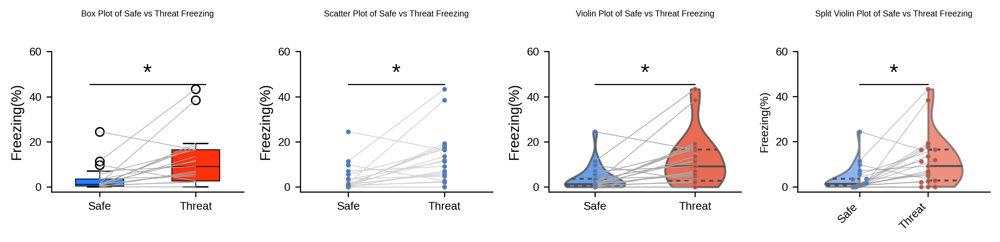

In [12]:
safe_freezing = behavior_results['safe_freezing']
threat_freezing = behavior_results['threat_freezing']
title_box = 'Box Plot of Safe vs Threat Freezing'
title_scatter = 'Scatter Plot of Safe vs Threat Freezing'
title_violin = 'Violin Plot of Safe vs Threat Freezing'
title_splitviolin = 'Split Violin Plot of Safe vs Threat Freezing'
figsize = (10, 2.5)  # Adjusted for 4 subplots side by side

y_label = 'Freezing(%)'
ylim = (None, 60)

# Create a figure with 4 subplots
fig, axs = plt.subplots(1, 4, figsize=figsize, dpi=300)


# First Plot - Boxplot with Lines
boxplot_with_lines(axs[0], safe_freezing, threat_freezing, 'Safe', 'Threat',title_box, y_label, ylim)

# Second Plot - Scatterplot with Lines
scatterplot_with_lines(axs[1], safe_freezing, threat_freezing, 'Safe', 'Threat',title_scatter, y_label, ylim)

# Third Plot - Violinplot with Dots and Lines
violinplot_with_dots_lines(axs[2], safe_freezing, threat_freezing, 'Safe', 'Threat',title_violin, y_label, ylim)

# Fourth Plot - Split Violin Plot with Dots and Lines
split_violin_with_dots_lines(axs[3], safe_freezing, threat_freezing, 'Safe', 'Threat',title_splitviolin, y_label, ylim)

plt.tight_layout()
plt.show()

Normality test results for value1: Statistics = 0.839368462562561, p-value = 0.0028014446143060923
Normality test results for value2: Statistics = 0.8302227258682251, p-value = 0.0019751260988414288
Wilcoxon signed-rank test results: Statistics = 1.5, p-value = 0.00010838137454492703
Normality test results for value1: Statistics = 0.839368462562561, p-value = 0.0028014446143060923
Normality test results for value2: Statistics = 0.8302227258682251, p-value = 0.0019751260988414288
Wilcoxon signed-rank test results: Statistics = 1.5, p-value = 0.00010838137454492703
Normality test results for value1: Statistics = 0.839368462562561, p-value = 0.0028014446143060923
Normality test results for value2: Statistics = 0.8302227258682251, p-value = 0.0019751260988414288
Wilcoxon signed-rank test results: Statistics = 1.5, p-value = 0.00010838137454492703


/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


Normality test results for value1: Statistics = 0.839368462562561, p-value = 0.0028014446143060923
Normality test results for value2: Statistics = 0.8302227258682251, p-value = 0.0019751260988414288
Wilcoxon signed-rank test results: Statistics = 1.5, p-value = 0.00010838137454492703


/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


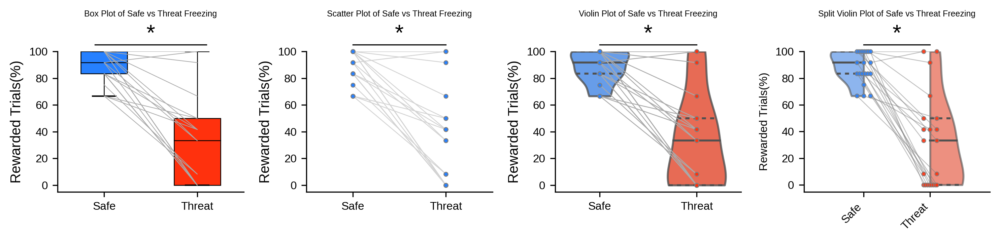

In [13]:
safe_rewarded = behavior_results['safe_rewarded'].copy()
threat_rewarded = behavior_results['threat_rewarded'].copy()
safe_rewarded['Data'] = pd.DataFrame(behavior_results['safe_rewarded'].iloc[:,1:].mean(axis =1)*100)
threat_rewarded['Data'] = pd.DataFrame(behavior_results['threat_rewarded'].iloc[:,1:].mean(axis =1)*100)
title_box = 'Box Plot of Safe vs Threat Freezing'
title_scatter = 'Scatter Plot of Safe vs Threat Freezing'
title_violin = 'Violin Plot of Safe vs Threat Freezing'
title_splitviolin = 'Split Violin Plot of Safe vs Threat Freezing'
figsize = (10, 2.5)  # Adjusted for 4 subplots side by side

y_label = 'Rewarded Trials(%)'
ylim = (None, 100)

# Create a figure with 4 subplots
fig, axs = plt.subplots(1, 4, figsize=figsize, dpi=300)


# First Plot - Boxplot with Lines
boxplot_with_lines(axs[0], safe_rewarded, threat_rewarded, 'Safe', 'Threat',title_box, y_label, ylim)

# Second Plot - Scatterplot with Lines
scatterplot_with_lines(axs[1], safe_rewarded, threat_rewarded, 'Safe', 'Threat',title_scatter, y_label, ylim)

# Third Plot - Violinplot with Dots and Lines
violinplot_with_dots_lines(axs[2], safe_rewarded, threat_rewarded, 'Safe', 'Threat',title_violin, y_label, ylim)

# Fourth Plot - Split Violin Plot with Dots and Lines
split_violin_with_dots_lines(axs[3], safe_rewarded, threat_rewarded, 'Safe', 'Threat',title_splitviolin, y_label, ylim)

plt.tight_layout()
plt.show()

Normality test results for value1: Statistics = 0.9229272603988647, p-value = 0.0993049293756485
Normality test results for value2: Statistics = 0.9279048442840576, p-value = 0.1249588280916214
Paired t-test results: t-statistic = 4.600782482690214, p-value = 0.00017303002679552377
Normality test results for value1: Statistics = 0.951744019985199, p-value = 0.3673356771469116
Normality test results for value2: Statistics = 0.9473102688789368, p-value = 0.30271002650260925
Paired t-test results: t-statistic = -5.273170128937356, p-value = 3.679957585036185e-05
Normality test results for value1: Statistics = 0.6405619382858276, p-value = 5.45092052561813e-06
Normality test results for value2: Statistics = 0.8376583456993103, p-value = 0.0026226663030683994
Wilcoxon signed-rank test results: Statistics = 17.0, p-value = 0.002852521233431342


/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


Normality test results for value1: Statistics = 0.839368462562561, p-value = 0.0028014446143060923
Normality test results for value2: Statistics = 0.8302227258682251, p-value = 0.0019751260988414288
Wilcoxon signed-rank test results: Statistics = 1.5, p-value = 0.00010838137454492703
Normality test results for value1: Statistics = 0.9777817726135254, p-value = 0.8904832005500793
Normality test results for value2: Statistics = 0.7830528020858765, p-value = 0.00036540438304655254
Wilcoxon signed-rank test results: Statistics = 3.0, p-value = 4.76837158203125e-06


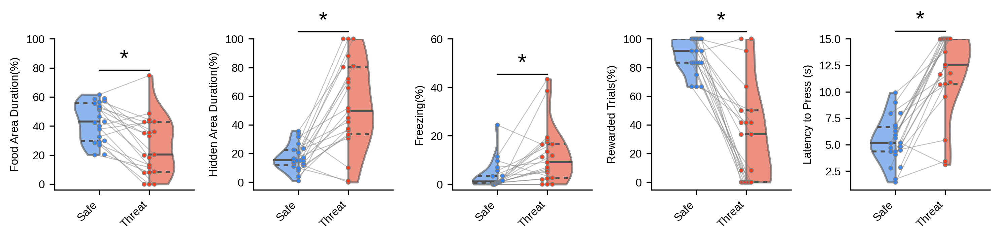

In [14]:
safe_food_area = behavior_results['safe_food_area']
threat_food_area = behavior_results['threat_food_area']
safe_hidden_area = behavior_results['safe_hidden_area']
threat_hidden_area = behavior_results['threat_hidden_area']
safe_freezing = behavior_results['safe_freezing']
threat_freezing = behavior_results['threat_freezing']
safe_rewarded = behavior_results['safe_rewarded'].copy()
threat_rewarded = behavior_results['threat_rewarded'].copy()
safe_rewarded['Data'] = pd.DataFrame(behavior_results['safe_rewarded'].iloc[:,1:].mean(axis =1)*100)
threat_rewarded['Data'] = pd.DataFrame(behavior_results['threat_rewarded'].iloc[:,1:].mean(axis =1)*100)
safe_latency = behavior_results['safe_latency'].copy()
threat_latency  = behavior_results['threat_latency'].copy()
safe_latency['Data'] = pd.DataFrame(behavior_results['safe_latency'].iloc[:,1:].mean(axis =1))
threat_latency['Data'] = pd.DataFrame(behavior_results['threat_latency'].iloc[:,1:].mean(axis =1))
title_splitviolin = None
figsize = (10, 2.5)  # Adjusted for 4 subplots side by side

y_label_food = 'Food Area Duration(%)'
y_label_hidden = 'Hidden Area Duration(%)'
y_label_freezing = 'Freezing(%)'
y_label_rewarded = 'Rewarded Trials(%)'
y_label_latency = 'Latency to Press (s)'
ylim_food = (None, 100)
ylim_hidden = (None, 100)
ylim_freezing = (None, 60)
ylim_rewarded = (None, 100)
ylim_latency = (None, 15)

fig, axs = plt.subplots(1, 5, figsize=figsize, dpi=300)


split_violin_with_dots_lines(axs[0], safe_food_area, threat_food_area, 'Safe', 'Threat',title_splitviolin, y_label_food, ylim_food)
split_violin_with_dots_lines(axs[1], safe_hidden_area, threat_hidden_area, 'Safe', 'Threat',title_splitviolin, y_label_hidden, ylim_hidden)
split_violin_with_dots_lines(axs[2], safe_freezing, threat_freezing, 'Safe', 'Threat',title_splitviolin, y_label_freezing, ylim_freezing)
split_violin_with_dots_lines(axs[3], safe_rewarded, threat_rewarded, 'Safe', 'Threat',title_splitviolin, y_label_rewarded, ylim_rewarded)
split_violin_with_dots_lines(axs[4], safe_latency, threat_latency, 'Safe', 'Threat',title_splitviolin, y_label_latency, ylim_latency)

plt.tight_layout()
plt.show()

## Sex differences

In [15]:
sex_list = pd.read_csv(os.path.join(base_dir,'Miniscope_rat_sex.csv'))
np.unique(sex_list.sex, return_counts= True)

(array(['F', 'M'], dtype=object), array([16, 14]))

In [16]:

def add_sex_column_to_behavior_results(dfs, sex_list):
    """
    Adds a 'Sex' column to each DataFrame in the behavior_results dictionary based on the animal ID.
    :return: Updated behavior_results with the 'Sex' column added.
    """
    
    # Read the sex list
    sex_dict = dict(zip(sex_list['animal_id'], sex_list['sex']))

    # Iterate over each test in behavior_results and add the 'Sex' column
    updated_dfs = {}
    for test_name, df in dfs.items():
        # Make a copy of the DataFrame to avoid modifying the original
        df_copy = df.copy()

        # Check if 'animal_id' column exists in the DataFrame
        if 'animal_id' in df_copy.columns:
            # Map the 'Sex' based on 'animal_id'
            df_copy['Sex'] = df_copy['animal_id'].map(sex_dict).fillna('Unknown')
            updated_dfs[test_name] = df_copy
        else:
            print(f"No 'animal_id' column found in the DataFrame for test '{test_name}'")

    return updated_dfs


In [17]:
behavior_results_sex = add_sex_column_to_behavior_results(behavior_results, sex_list)
behavior_results_sex['safe_food_area']

,animal_id,Data,Sex
0,6H6,61.674586,F
1,6M6,20.479263,F
2,2N6,58.601806,M
3,7H6,52.359002,F
4,4B6,43.094917,F
5,1H6,20.258228,F
6,8H6,32.663078,F
7,2B6,40.153023,F
8,1S5,37.858900,M
9,3N6,46.528974,M


In [18]:
# Create an Excel file with each dataframe in its own sheet
excel_file_path = 'Cat_odor_conflict_miniscope_behavior_results_sex.xlsx'
with pd.ExcelWriter(excel_file_path, engine='xlsxwriter') as writer:
    for sheet_name, df in behavior_results_sex.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

In [19]:
def split_violin_with_dots_lines_sexmarkers(ax, data1, data2, data1_name, data2_name, title, y_label, ylim, label, point_size=14, line_width=0.6):
    
    value1 = data1['Data']
    value2 = data2['Data']
    # Perform paired t-test
    if len(value1) != len(value2):
        print("Datasets are not of equal length, cannot perform paired t-test.")
        return

    # Normality test
    normality1 = stats.shapiro(value1)
    normality2 = stats.shapiro(value2)
    print(f"Normality test results for value1: Statistics = {normality1[0]}, p-value = {normality1[1]}")
    print(f"Normality test results for value2: Statistics = {normality2[0]}, p-value = {normality2[1]}")

    # Check if both datasets are normally distributed
    if normality1[1] > 0.05 and normality2[1] > 0.05:
        # Perform paired t-test
        t_stat, p_value = stats.ttest_rel(value1, value2)
        print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
    else:
        # Perform Wilcoxon signed-rank test
        w_stat, p_value = stats.wilcoxon(value1, value2)
        print(f"Wilcoxon signed-rank test results: Statistics = {w_stat}, p-value = {p_value}")

    # First, create a copy to manipulate for plotting
    dt1 = data1.copy()
    dt2 = data2.copy()
    dt1['Condition'] = data1_name
    dt2['Condition'] = data2_name
    combined_data = pd.concat([dt1, dt2])
    plot_data = combined_data.copy()

    # Assign numeric x positions based on 'Sex' and 'Condition'
    plot_data.loc[(plot_data['Condition'] == data1_name), 'PlotSex'] = 0
    plot_data.loc[(plot_data['Condition'] == data2_name), 'PlotSex'] = 1

    # Plot the violin plot with adjusted positions
    sns.violinplot(x='PlotSex', y='Data', hue='Condition', data=plot_data, fill=False, split=True, dodge=1,
                   linewidth=0.8, palette=["orchid", "olivedrab"], width=1, inner='quart', cut=0, ax=ax, linecolor = 'white')
    ax.legend().remove()
    plt.setp(ax.collections, alpha=.5)
    
    #Adjust linestyle for mean
    for l in ax.lines[1::3]:
        l.set_linestyle('-')

    # Adjust for offset and coordinates
    spread = 0.1
    x_coords_cond = {data1_name: 0, data2_name: 1}

    # Store coordinates for connecting lines
    coords = {}

    # Define marker styles for each sex
    marker_styles = {'M': 'o', 'F': '^'}  # 'o' for male, '^' for female
    
    # Process each sex and condition combination
    for condition, group_data in combined_data.groupby('Condition'):
        grouped_values = group_values_with_indices(group_data['Data'].values, ylim[1]*0.01)

        for group, indices in grouped_values:
            x_coords = generate_symmetric_points(x_coords_cond[condition], spread, len(group))

            for i, idx in enumerate(indices):
                original_idx = group_data.iloc[idx].name  # Correct index from group_data
                x_coord = x_coords[i]
                y_value = group_data.loc[original_idx, 'Data']
                sex = group_data.loc[original_idx, 'Sex']

                # Store the coordinates for lines
                coords[(original_idx, condition)] = (x_coord, y_value)
                
                # Plot the individual scatter points with different markers for male and female
                color = 'orchid' if condition == data1_name else 'olivedrab'
                ax.scatter(x_coord, y_value, color=color, edgecolors='gray', alpha=0.9, clip_on=False, 
                           s=point_size, lw=line_width, zorder=3, marker=marker_styles[sex])

#     # Process each sex and condition combination
#     for condition, group_data in combined_data.groupby('Condition'):
#         grouped_values = group_values_with_indices(group_data['Data'].values, ylim[1]*0.01)

#         for group, indices in grouped_values:
#             x_coords = generate_symmetric_points(x_coords_cond[condition], spread, len(group))
            
#             for i, idx in enumerate(indices):
#                 original_idx = group_data.iloc[idx].name  # Correct index from group_data
#                 x_coord = x_coords[i]
#                 y_value = group_data.loc[original_idx, 'Data']

#                 # Store the coordinates for lines
#                 coords[(original_idx, condition)] = (x_coord, y_value)

#                 # Plot the individual scatter points
#                 color = '#2680ff' if condition == 'Safe' else '#ff310d'
#                 ax.scatter(x_coord, y_value, color=color, edgecolors='gray', alpha=0.9, clip_on=False, s=point_size, lw=line_width, zorder=3)

    # Draw connecting lines using stored coordinates
    for animal_id in combined_data['animal_id'].unique():
        animal_data = combined_data[combined_data['animal_id'] == animal_id]

        data1_key = next((key for key in coords if key[0] in animal_data.index and key[1] == data1_name), None)
        data2_key = next((key for key in coords if key[0] in animal_data.index and key[1] == data2_name), None)
        if data1_key and data2_key:
            data1_coord = coords[data1_key]
            data2_coord = coords[data2_key]
            ax.plot([data1_coord[0], data2_coord[0]], [data1_coord[1], data2_coord[1]], 
                    color='gray', alpha=0.5, linewidth=line_width)
    # Adjust for significance annotation
    if p_value < 0.05:
        y_max = min(combined_data['Data'].max()*1.05, ylim[1]*1.05)
        ax.plot([x_coords_cond[data1_name], x_coords_cond[data1_name], x_coords_cond[data2_name], x_coords_cond[data2_name]], [y_max, y_max, y_max, y_max], lw=0.8, c='k', clip_on=False)
        ax.text(0.5, y_max, "*", ha='center', va='bottom', color='k', fontsize=16)
    
    # Create a custom legend for sexes
    from matplotlib.lines import Line2D
    legend_elements = [Line2D([0], [0], marker='o', color='w', markersize=point_size, label='Male', mec = 'gray', markeredgewidth=line_width),
                       Line2D([0], [0], marker='^', color='w', markersize=point_size, label='Female', mec = 'gray', markeredgewidth=line_width)]

    
    # Remove the legend
    if label:
        ax.legend(handles=legend_elements, loc='upper right', frameon=False, markerscale = 0.5, fontsize = 8, bbox_to_anchor=(1.3, 1))
    ax.set_xticks([x_coords_cond[data1_name], x_coords_cond[data2_name]])
    ax.set_xticklabels([data1_name, data2_name], fontsize=10, rotation=45, ha='right')
    ax.set_xlabel(None)
    ax.set_title(title, fontsize=6, pad = 25)
    ax.set_ylabel(y_label, fontsize=16)
    ax.yaxis.set_label_coords(-0.25, 0.5)  # Adjust label position
    ax.set_ylim(*ylim)
    ax.tick_params(labelsize=16)
    sns.despine() 
    ax.margins(x=0.2)



Normality test results for value1: Statistics = 0.9229272603988647, p-value = 0.0993049293756485
Normality test results for value2: Statistics = 0.9279048442840576, p-value = 0.1249588280916214
Paired t-test results: t-statistic = 4.600782482690214, p-value = 0.00017303002679552377
Normality test results for value1: Statistics = 0.839368462562561, p-value = 0.0028014446143060923
Normality test results for value2: Statistics = 0.8302227258682251, p-value = 0.0019751260988414288
Wilcoxon signed-rank test results: Statistics = 1.5, p-value = 0.00010838137454492703


/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


Normality test results for value1: Statistics = 0.9777817726135254, p-value = 0.8904832005500793
Normality test results for value2: Statistics = 0.7830528020858765, p-value = 0.00036540438304655254
Wilcoxon signed-rank test results: Statistics = 3.0, p-value = 4.76837158203125e-06
Normality test results for value1: Statistics = 0.951744019985199, p-value = 0.3673356771469116
Normality test results for value2: Statistics = 0.9473102688789368, p-value = 0.30271002650260925
Paired t-test results: t-statistic = -5.273170128937356, p-value = 3.679957585036185e-05
Normality test results for value1: Statistics = 0.6405619382858276, p-value = 5.45092052561813e-06
Normality test results for value2: Statistics = 0.8376583456993103, p-value = 0.0026226663030683994
Wilcoxon signed-rank test results: Statistics = 17.0, p-value = 0.002852521233431342
Normality test results for value1: Statistics = 0.941511332988739, p-value = 0.23339518904685974
Normality test results for value2: Statistics = 0.9403

/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


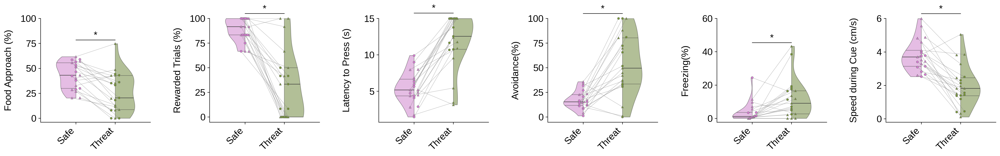

In [16]:
safe_food_area = behavior_results_sex['safe_food_area']
threat_food_area = behavior_results_sex['threat_food_area']
safe_hidden_area = behavior_results_sex['safe_hidden_area']
threat_hidden_area = behavior_results_sex['threat_hidden_area']
safe_freezing = behavior_results_sex['safe_freezing']
threat_freezing = behavior_results_sex['threat_freezing']
safe_rewarded = behavior_results_sex['safe_rewarded'].copy()
threat_rewarded = behavior_results_sex['threat_rewarded'].copy()
safe_rewarded['Data'] = pd.DataFrame(behavior_results_sex['safe_rewarded'].iloc[:,1:-1].mean(axis =1)*100)
threat_rewarded['Data'] = pd.DataFrame(behavior_results_sex['threat_rewarded'].iloc[:,1:-1].mean(axis =1)*100)
safe_latency = behavior_results_sex['safe_latency'].copy()
threat_latency  = behavior_results_sex['threat_latency'].copy()
safe_latency['Data'] = pd.DataFrame(behavior_results_sex['safe_latency'].iloc[:,1:-1].mean(axis =1))
threat_latency['Data'] = pd.DataFrame(behavior_results_sex['threat_latency'].iloc[:,1:-1].mean(axis =1))

safe_speed = behavior_results_sex['safe_speed_cue'].copy()
threat_speed  = behavior_results_sex['threat_speed_cue'].copy()
safe_speed['Data'] = pd.DataFrame(behavior_results_sex['safe_speed_cue'].iloc[:,1:-1].mean(axis =1))*100
threat_speed['Data'] = pd.DataFrame(behavior_results_sex['threat_speed_cue'].iloc[:,1:-1].mean(axis =1))*100

safe_speed_1s = behavior_results_sex['safe_speed_cue_1s'].copy()
threat_speed_1s  = behavior_results_sex['threat_speed_cue_1s'].copy()
safe_speed_1s['Data'] = pd.DataFrame(behavior_results_sex['safe_speed_cue_1s'].iloc[:,1:-1].mean(axis =1))*100
threat_speed_1s['Data'] = pd.DataFrame(behavior_results_sex['threat_speed_cue_1s'].iloc[:,1:-1].mean(axis =1))*100

title_splitviolin = None
figsize = (24, 3.8) 


y_label_food = 'Food Approach (%)'
y_label_hidden = 'Avoidance(%)'
y_label_freezing = 'Freezing(%)'
y_label_speed = 'Speed during Cue (cm/s)'
y_label_speed_1s = 'Speed 1s Post-Cue (cm/s)'
y_label_rewarded = 'Rewarded Trials (%)'
y_label_latency = 'Latency to Press (s)'

ylim_food = (None, 100)
ylim_hidden = (None, 100)
ylim_freezing = (None, 60)
ylim_rewarded = (None, 100)
ylim_latency = (None, 15)
ylim_speed = (None, 6)


fig, axs = plt.subplots(1, 6, figsize=figsize, dpi=300)


split_violin_with_dots_lines_sexmarkers(axs[0], safe_food_area, threat_food_area, 'Safe', 'Threat',title_splitviolin, y_label_food, ylim_food, label = False)
split_violin_with_dots_lines_sexmarkers(axs[1], safe_rewarded, threat_rewarded, 'Safe', 'Threat',title_splitviolin, y_label_rewarded, ylim_rewarded, label = False)
split_violin_with_dots_lines_sexmarkers(axs[2], safe_latency, threat_latency, 'Safe', 'Threat',title_splitviolin, y_label_latency, ylim_latency, label = False)
split_violin_with_dots_lines_sexmarkers(axs[3], safe_hidden_area, threat_hidden_area, 'Safe', 'Threat',title_splitviolin, y_label_hidden, ylim_hidden, label = False)
split_violin_with_dots_lines_sexmarkers(axs[4], safe_freezing, threat_freezing, 'Safe', 'Threat',title_splitviolin, y_label_freezing, ylim_freezing, label = False)
split_violin_with_dots_lines_sexmarkers(axs[5], safe_speed, threat_speed, 'Safe', 'Threat',title_splitviolin, y_label_speed, ylim_speed, label = False)
# split_violin_with_dots_lines_sexmarkers(axs[6], safe_speed_1s, threat_speed_1s, 'Safe', 'Threat',title_splitviolin, y_label_speed_1s, ylim_speed, label = False)
fig.subplots_adjust(wspace=-0.3, hspace=0.1)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_catodor.svg", transparent=True)

plt.show()

Normality test results for value1: Statistics = 0.9229272603988647, p-value = 0.0993049293756485
Normality test results for value2: Statistics = 0.9279048442840576, p-value = 0.1249588280916214
Paired t-test results: t-statistic = 4.600782482690214, p-value = 0.00017303002679552377


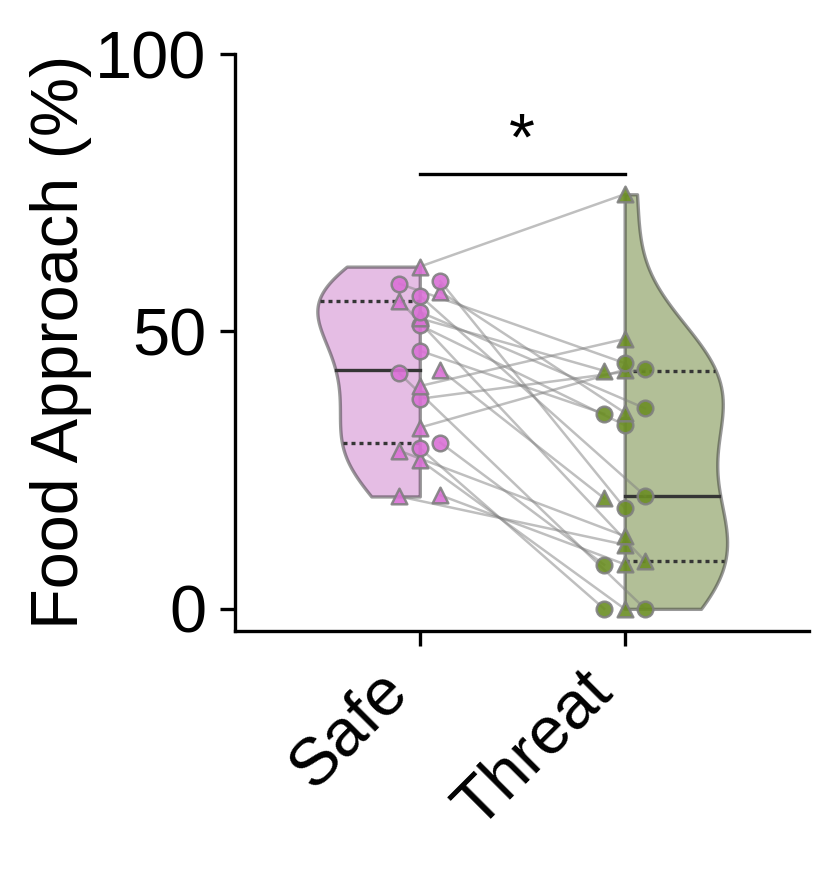

In [110]:
fig, axs = plt.subplots(figsize = (3,3), dpi=300)
split_violin_with_dots_lines_sexmarkers(axs, safe_food_area, threat_food_area, 'Safe', 'Threat',title_splitviolin, y_label_food, ylim_food, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_approach_catodor.svg")


Normality test results for value1: Statistics = 0.839368462562561, p-value = 0.0028014446143060923
Normality test results for value2: Statistics = 0.8302227258682251, p-value = 0.0019751260988414288
Wilcoxon signed-rank test results: Statistics = 1.5, p-value = 0.00010838137454492703


/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


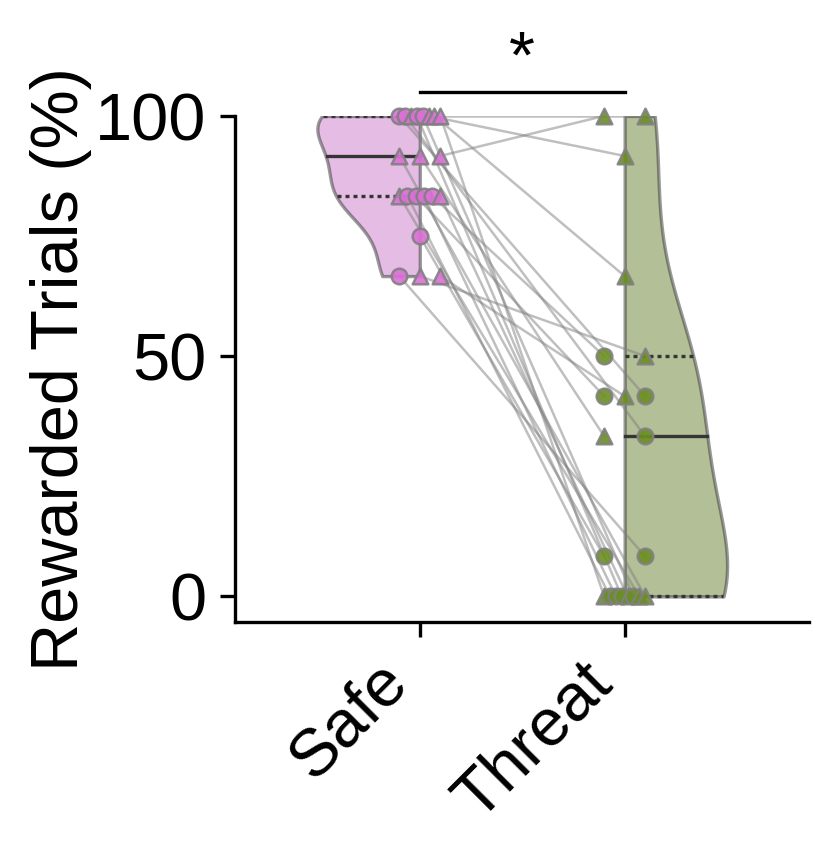

In [109]:
fig, axs = plt.subplots(figsize = (3,3), dpi=300)
split_violin_with_dots_lines_sexmarkers(axs, safe_rewarded, threat_rewarded, 'Safe', 'Threat',title_splitviolin, y_label_rewarded, ylim_rewarded, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_rewarded_catodor.svg")
# plt.close(fig)

Normality test results for value1: Statistics = 0.9777817726135254, p-value = 0.8904832005500793
Normality test results for value2: Statistics = 0.7830528020858765, p-value = 0.00036540438304655254
Wilcoxon signed-rank test results: Statistics = 3.0, p-value = 4.76837158203125e-06


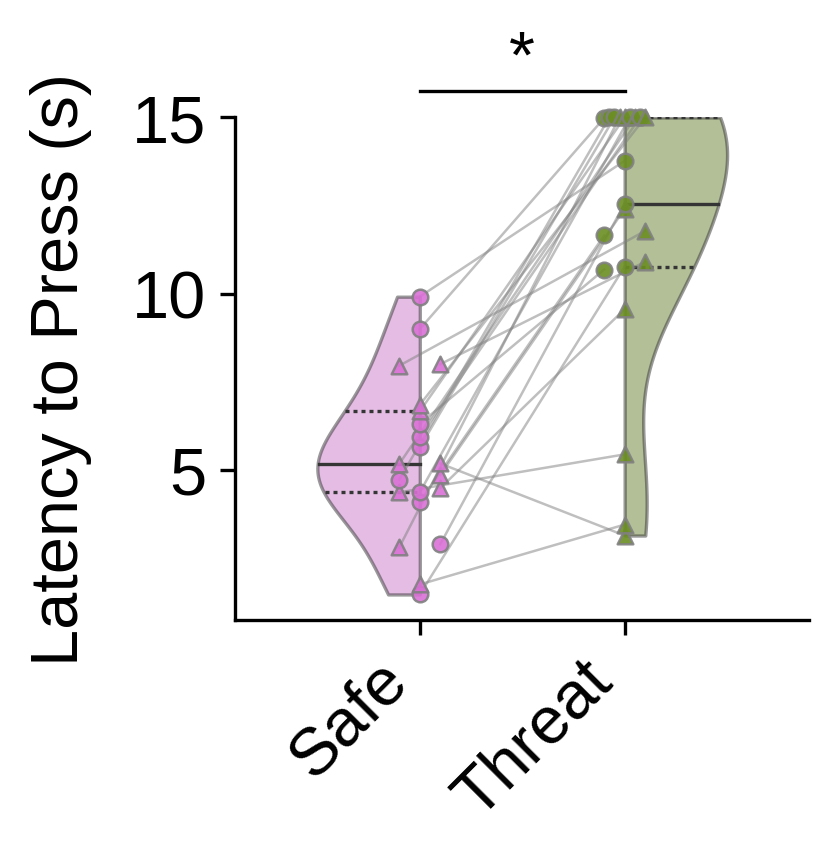

In [158]:
fig, axs = plt.subplots(figsize = (3, 3), dpi=300)
split_violin_with_dots_lines_sexmarkers(axs, safe_latency, threat_latency, 'Safe', 'Threat',title_splitviolin, y_label_latency, ylim_latency, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_latency_catodor.svg")


Normality test results for value1: Statistics = 0.951744019985199, p-value = 0.3673356771469116
Normality test results for value2: Statistics = 0.9473102688789368, p-value = 0.30271002650260925
Paired t-test results: t-statistic = -5.273170128937356, p-value = 3.679957585036185e-05


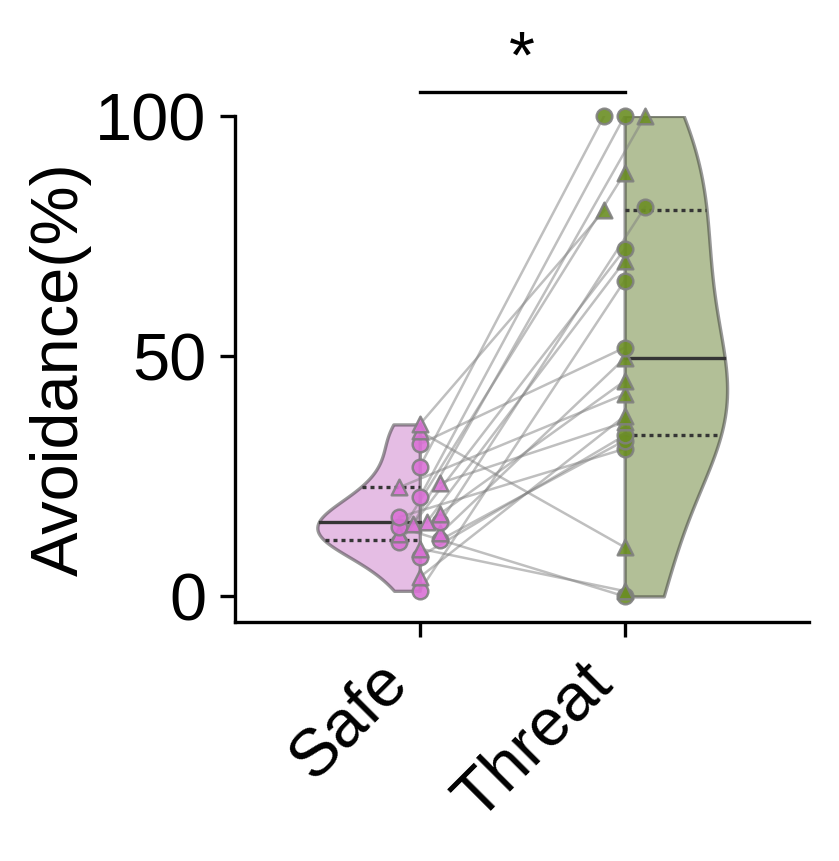

In [157]:
fig, axs = plt.subplots(figsize = (3, 3), dpi=300)
split_violin_with_dots_lines_sexmarkers(axs, safe_hidden_area, threat_hidden_area, 'Safe', 'Threat',title_splitviolin, y_label_hidden, ylim_hidden, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_avoidance_catodor.svg")


Normality test results for value1: Statistics = 0.6405619382858276, p-value = 5.45092052561813e-06
Normality test results for value2: Statistics = 0.8376583456993103, p-value = 0.0026226663030683994
Wilcoxon signed-rank test results: Statistics = 17.0, p-value = 0.002852521233431342


/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


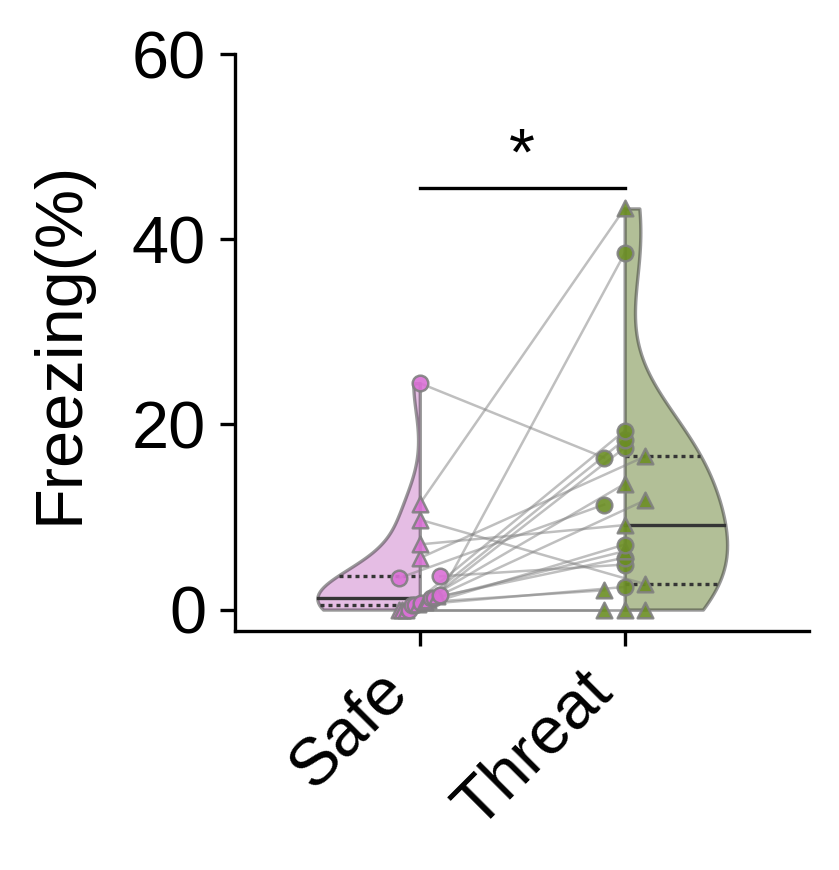

In [156]:
fig, axs = plt.subplots(figsize = (3,3), dpi=300)
split_violin_with_dots_lines_sexmarkers(axs, safe_freezing, threat_freezing, 'Safe', 'Threat',title_splitviolin, y_label_freezing, ylim_freezing, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_freezing_catodor.svg")


Normality test results for value1: Statistics = 0.941511332988739, p-value = 0.23339518904685974
Normality test results for value2: Statistics = 0.9403529167175293, p-value = 0.22143355011940002
Paired t-test results: t-statistic = 6.661512093958052, p-value = 1.7431967402496923e-06


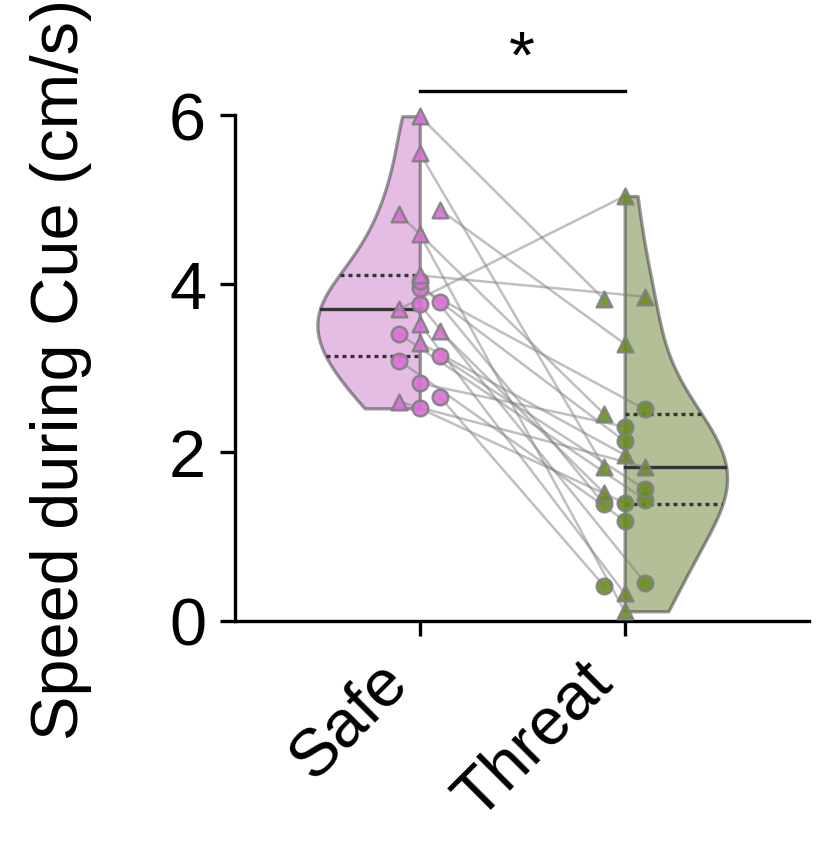

In [155]:
fig, axs = plt.subplots(figsize = (3,3), dpi=300)
split_violin_with_dots_lines_sexmarkers(axs, safe_speed, threat_speed, 'Safe', 'Threat',title_splitviolin, y_label_speed, ylim_speed, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_speed_catodor.svg")


In [20]:
def perform_pairwise_comparisons_and_correct(df, alpha=0.05):
    p_values = []
    comparisons = []

    # Calculate SD for each group
    group_sds = df.groupby(['Sex', 'Condition'])['Data'].std()
    group_sizes = df.groupby(['Sex', 'Condition'])['Data'].count()
    
    # Calculate pooled variance
    pooled_variance = sum((sizes - 1) * sds**2 for sizes, sds in zip(group_sizes, group_sds)) / (sum(group_sizes) - len(group_sizes))
    
    stages = df['Sex'].unique()
    treatments = df['Condition'].unique()
    
    for stage in sorted(stages):
        stage_data = df[df['Sex'] == stage]
        treatment_combinations = list(combinations(treatments, 2))
        
        for treatment1, treatment2 in treatment_combinations:
            data1 = stage_data[stage_data['Condition'] == treatment1]['Data']
            data2 = stage_data[stage_data['Condition'] == treatment2]['Data']
            
            n1, n2 = len(data1), len(data2)
            
            # Calculate SE for this comparison using pooled variance
            se = np.sqrt(pooled_variance * (1/n1 + 1/n2))
            
            # Compute mean difference
            mean_diff = np.mean(data1) - np.mean(data2)
            
            # Compute the t-statistic using the calculated SE
            t_stat = mean_diff / se
            
            # Degrees of freedom, approximated for pooled samples
            df_degrees = sum(group_sizes) - len(group_sizes)
            
            # Calculate p-value using the t-distribution
            p_value = 2 * (1 - t.cdf(np.abs(t_stat), df_degrees))
            p_values.append(p_value)
            comparisons.append(f"{stage}: {treatment1} vs. {treatment2}")
    
    # Apply Bonferroni correction for multiple comparisons
    _, corrected_p_values, _, _ = multipletests(p_values, alpha=alpha, method='sidak')
    
    # Combine comparisons and their corrected p-values
    comparison_results = list(zip(comparisons, corrected_p_values))
    
    return comparison_results

def perform_pairwise_comparisons_by_treatment(df, mse, alpha=0.05):
    p_values = []
    comparisons = []

    # Calculate SD for each group
    group_sds = df.groupby(['Condition', 'Sex'])['Data'].std()
    group_sizes = df.groupby(['Condition', 'Sex'])['Data'].count()

    # Calculate pooled variance
    pooled_variance = mse

    treatments = df['Condition'].unique()
    stages = df['Sex'].unique()

    for treatment in treatments:
        treatment_data = df[df['Condition'] == treatment]
        stage_combinations = list(combinations(stages, 2))

        for stage1, stage2 in stage_combinations:
            data1 = treatment_data[treatment_data['Sex'] == stage1]['Data']
            data2 = treatment_data[treatment_data['Sex'] == stage2]['Data']

            n1, n2 = len(data1), len(data2)

            # Calculate SE for this comparison using pooled variance
            se = np.sqrt(pooled_variance * (1/n1 + 1/n2))

            # Compute mean difference
            mean_diff = np.mean(data1) - np.mean(data2)

            # Compute the t-statistic using the calculated SE
            t_stat = mean_diff / se

            # Degrees of freedom, approximated for pooled samples
            df_degrees = (sum(group_sizes) - len(group_sizes))/2

            # Calculate p-value using the t-distribution
            p_value = 2 * (1 - t.cdf(np.abs(t_stat), df_degrees))
            p_values.append(p_value)
            comparisons.append(f"{treatment}: {stage1} vs. {stage2}")

    # Apply Bonferroni correction for multiple comparisons
    _, corrected_p_values, _, _ = multipletests(p_values, alpha=alpha, method='sidak')

    # Combine comparisons and their corrected p-values
    comparison_results = list(zip(comparisons, corrected_p_values))

    return comparison_results

def split_violin_with_dots_lines_sex(ax, data1, data2, data1_name, data2_name, title, y_label, ylim, label, point_size=14, line_width=0.6):
    # Combine data1 and data2 into a single DataFrame
    data1['Condition'] = data1_name
    data2['Condition'] = data2_name
    combined_data = pd.concat([data1, data2])
    conditions = combined_data['Condition'].unique()
    sexes = combined_data['Sex'].unique()
    
    # Encode categorical variables
    combined_data['Sex'] = pd.Categorical(combined_data['Sex'])
    combined_data['Condition'] = pd.Categorical(combined_data['Condition'])

    # Perform 2-way RM ANOVA using MixedLM
    model = MixedLM.from_formula("Data ~ Sex * Condition", combined_data, groups=combined_data["animal_id"], re_formula="~Condition")
    results = model.fit()
    mse = results.scale
    print(results.summary())

    # The fixed effects are typically in the second table (index 1)
    fixed_effects_df = results.summary().tables[1]
    
    interaction_term = results.model.exog_names[-1]

    # Construct the hypothesis
    hypothesis = f'{interaction_term} = 0'

    # Perform the F-test
    f_test_result = results.f_test(hypothesis)
    print(f'F-test result for {interaction_term}: {f_test_result}')
    
    # Assuming the interaction term is in the third row (index 2) and the p-value is in the fourth column (index 3)
    interaction_p_value = float(fixed_effects_df.iloc[2, 3])
    print("Interaction: p-value =", interaction_p_value)

    # Number of clusters
    unique_clusters = sorted(combined_data['Sex'].unique())
    
    results = perform_pairwise_comparisons_and_correct(combined_data)
    for result in results:
        print(result)
        
    # Perform pairwise comparisons
    results_by_treatment = perform_pairwise_comparisons_by_treatment(combined_data, mse)
    for result in results_by_treatment:
        print(result)
        

    # Prepare plot_data with positions for the violin plot
    plot_data = combined_data.copy()
    num_conditions = 2  # Number of conditions
    plot_positions = {}
    gap_index = 0  # To create a gap between clusters
    for i, cluster in enumerate(sorted(unique_clusters)):
        plot_positions[cluster] = [gap_index * num_conditions+gap_index, gap_index * num_conditions + 1+gap_index]
        gap_index += 1  # Increase index for the next cluster

        # Add dummy category for the gap
        for gap in range(gap_index - 1):
            dummy_data = pd.DataFrame({'PlotPos': [gap * (num_conditions+1)+2], 'Data': [None], 'Condition': [None], 'Sex': [None]})
            plot_data = pd.concat([plot_data, dummy_data], ignore_index=True)

    plot_data['PlotPos'] = plot_data.apply(lambda row: plot_positions[row['Sex']][0 if row['Condition'] == data1_name else 1] if pd.notna(row['Sex']) else row['PlotPos'], axis=1)


    # Prepare colors for each cluster and condition
    base_colors = sns.color_palette('gist_stern', len(unique_clusters))
    condition_colors = {cluster: {data1_name: to_rgb(base_colors[i]), data2_name: 0.7 + 0.3 * np.array(to_rgb(base_colors[i]))} for i, cluster in enumerate(sorted(unique_clusters))}

    for cluster in sorted(unique_clusters):
        cls_data = plot_data[plot_data.Sex == cluster]

        for i in set(plot_data.PlotPos) - set(cls_data.PlotPos):
            dummy_data = pd.DataFrame({'PlotPos': [i], 'Data': [None], 'Condition': [None], 'Sex': [None]})
            cls_data = pd.concat([cls_data, dummy_data], ignore_index=True)
        sns.violinplot(x = 'PlotPos', y='Data', hue='Condition', 
               data=cls_data, 
               fill=False, split=True, width=1, palette=condition_colors[cluster],
               linewidth=1, inner='quart', cut=0, ax=ax, dodge = 'auto')

    ax.legend().remove()
    plt.setp(ax.collections, alpha=0.7)
    #Adjust linestyle for mean
    for l in ax.lines[1::3]:
        l.set_linestyle('-') 

    # Initialize a dictionary to store coordinates for connecting lines
    point_coords = {}
    
    # Calculate the diameter in points
    diameter_points = 2 * sqrt(point_size / pi)
    actual_ylim = ax.get_ylim()
    
    # Convert diameter to inches
    diameter_inches = diameter_points / 72

    # Get the height of the axes in inches
    bbox = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    axes_height_inches = bbox.height

    # Get the conversion factor from inches to data units
    y_range = ylim[1] - actual_ylim[0]
    conversion_factor = y_range / axes_height_inches

    # Convert diameter from points to data units
    diameter_data_units = diameter_inches * conversion_factor
    
    
    # Spread scatter points for each cluster and store their coordinates
    offset = 0.14  # Adjust this value to change the spread of points
    for cluster in unique_clusters:
        for condition in [data1_name, data2_name]:
            condition_data = plot_data[(plot_data['Sex'] == cluster) & (plot_data['Condition'] == condition)]
            grouped_values = group_values_with_indices(condition_data['Data'].values, diameter_data_units)
            condition_color = condition_colors[cluster][condition]

            for group, indices in grouped_values:
                x_positions = generate_symmetric_points(plot_positions[cluster][0 if condition == data1_name else 1], offset, len(group))

                for i, idx in enumerate(indices):
                    animal_id = condition_data.iloc[idx].animal_id  # Correct index from group_data
                    x_coord = x_positions[i]+0.1
                    y_value = condition_data[condition_data.animal_id == animal_id].Data.values
                    if animal_id not in point_coords:
                        point_coords[animal_id] = {}
                        
                    # Store the coordinates for lines
                    point_coords[animal_id][condition] = (x_coord, y_value)

                    ax.scatter(x_coord, y_value, color=condition_color, edgecolors='gray', alpha=1, clip_on=False, s=point_size, lw=line_width, zorder=3)

 
    # Draw connecting lines based on stored coordinates
    for animal_id, coords in point_coords.items():
        if data1_name in coords and data2_name in coords:
            x_coords = [coords[data1_name][0], coords[data2_name][0]]
            y_coords = [coords[data1_name][1], coords[data2_name][1]]
            ax.plot(x_coords, y_coords, color='gray', alpha=0.5, linewidth=line_width)

    # Check for significance and annotate for data1 and data2
    for cluster, p_value in zip(unique_clusters, results):
        
        if p_value[1] < 0.05:
            y_max = min(combined_data[combined_data['Sex'] == cluster]['Data'].max()*1.05, ylim[1]*1.05)
            x_coords = plot_positions[cluster]
            # Draw lines for significance
            ax.plot([x_coords[0], x_coords[0], x_coords[1], x_coords[1]], [y_max, y_max, y_max, y_max], lw=0.8, c='k', clip_on=False)
            # Add asterisk for significance
            ax.text((x_coords[0] + x_coords[1]) / 2, y_max, "*", ha='center', va='bottom', color='k', fontsize=16)

    # Ensure conditions is a list
    conditions = list(combined_data['Condition'].unique())

    # Define an offset for the y-coordinate of the horizontal line
    y_offset = ylim[1]*0.1 # Adjust the offset value as needed

    # Iterate over results_by_treatment for significance annotations
    for result in results_by_treatment:
        comparison, p_value = result
        treatment, cluster_comparison = comparison.split(":")
        cluster1, cluster2 = cluster_comparison.strip().split(" vs. ")

        if p_value < 0.05:
            # Calculate the global maximum y-value for adjusting the horizontal line
            global_max_y = combined_data['Data'].max() * 1.2
            # Set the baseline y-coordinate for the horizontal line
            y_baseline = min(ylim[1] * 1.2, global_max_y)

            # Adjust the y-coordinate for the horizontal line based on the condition
            if treatment == conditions[0]:  # Assuming conditions[0] is the first condition
                y_horizontal_line = y_baseline + y_offset  # Lower the line for the first condition
            else:
                y_horizontal_line = y_baseline   # Raise the line for the second condition
            
            
            # Determine the maximum y-values for vertical lines
            max_y_cluster1 = combined_data[(combined_data['Sex'] == cluster1) & (combined_data['Condition'] == treatment)]['Data'].max() * 1.05
            max_y_cluster2 = combined_data[(combined_data['Sex'] == cluster2) & (combined_data['Condition'] == treatment)]['Data'].max() * 1.05

            treatment_index = conditions.index(treatment)
            x_coords_cluster1 = plot_positions[cluster1][treatment_index]
            x_coords_cluster2 = plot_positions[cluster2][treatment_index]

            # Draw horizontal line
            ax.plot([x_coords_cluster1, x_coords_cluster2], [y_horizontal_line, y_horizontal_line], 'k-', lw=0.8, clip_on=False)

            # Add asterisk for significance
            x_midpoint = (x_coords_cluster1 + x_coords_cluster2) / 2
            ax.text(x_midpoint, y_horizontal_line, "*", ha='center', va='bottom', color='k', fontsize=16)
    



    if label:
        custom_legend = [mlines.Line2D([], [], color=condition_colors[cluster][data1_name], marker='o', linestyle='None', markersize=point_size, label='Cluster 0', mec = 'gray', markeredgewidth=line_width) for i, cluster in enumerate(sorted(unique_clusters))]
        ax.legend(custom_legend, ['Male' if cluster == 'M' else 'Female' for cluster in sorted(unique_clusters)], loc='upper right', frameon=False, markerscale = 1, fontsize = 12, bbox_to_anchor=(0.6, 1.4))

    # Customization and Annotations
    ax.set_xticks([pos for cluster in plot_positions for pos in plot_positions[cluster]])
    ax.set_xticklabels([f'{condition}' for cluster in combined_data['Sex'].unique() for condition in [data1_name, data2_name]], rotation=45, ha='right', fontsize = 16)
    ax.set_title(title)
    ax.set_xlabel(None)
    ax.set_title(title, fontsize=6, pad = 25)
    ax.set_ylabel(y_label, fontsize=16)
    ax.yaxis.set_label_coords(-0.25, 0.5)  # Adjust label position

    ax.set_ylim(*ylim)
    ax.tick_params(axis = 'x', labelsize=12)
    ax.tick_params(axis = 'y', labelsize=16)
    sns.despine() 
    ax.margins(x=0.1)
    
    return ax



                   Mixed Linear Model Regression Results
Model:                   MixedLM        Dependent Variable:        Data     
No. Observations:        42             Method:                    REML     
No. Groups:              21             Scale:                     100.1307 
Min. group size:         2              Log-Likelihood:            -169.3765
Max. group size:         2              Converged:                 Yes      
Mean group size:         2.0                                                
----------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
----------------------------------------------------------------------------
Intercept                        54.980    4.335 12.683 0.000  46.484 63.476
Sex[T.M]                          7.056    6.282  1.123 0.261  -5.256 19.368
Condition[T.Threat]             -15.769    7.133 -2.211 0.027 -29.749 -1.789
Sex[T.M]:Condition[

<Axes: title={'center': 'Violin Plot of Safe vs Threat Food Areas'}, ylabel='Food Area Duration(%)'>

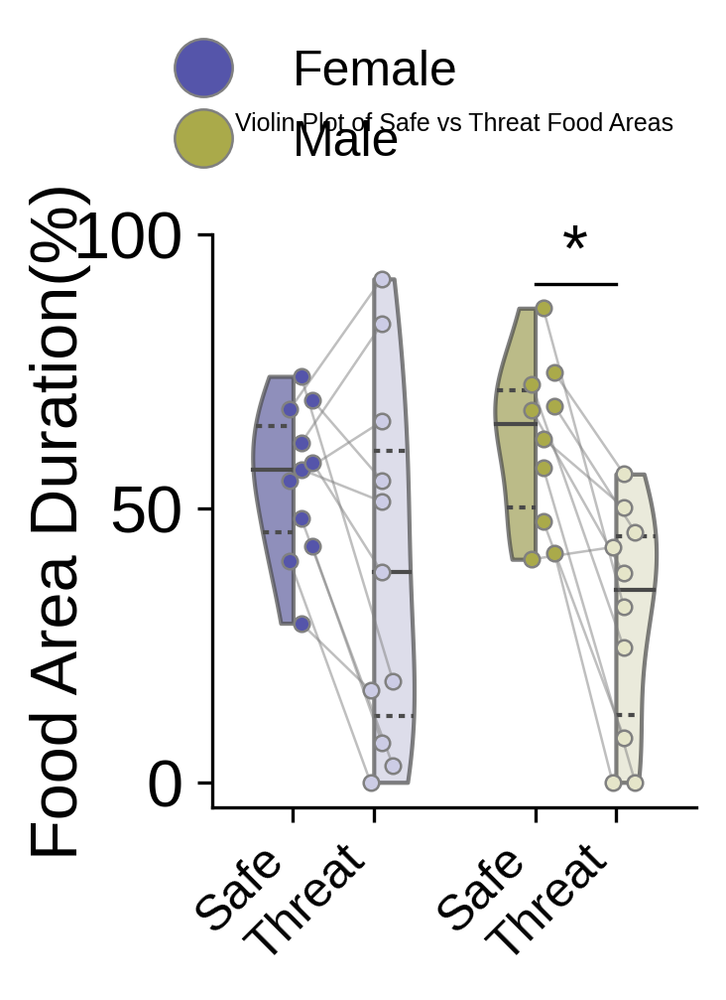

In [21]:
safe_food_area_cue = behavior_results_sex['safe_food_area_cue'].copy()
threat_food_area_cue = behavior_results_sex['threat_food_area_cue'].copy()
safe_food_area_cue['Data'] = pd.DataFrame(behavior_results_sex['safe_food_area_cue'].iloc[:,1:-1].mean(axis =1))
threat_food_area_cue['Data'] = pd.DataFrame(behavior_results_sex['threat_food_area_cue'].iloc[:,1:-1].mean(axis =1))


title = 'Violin Plot of Safe vs Threat Food Areas'
y_label = 'Food Area Duration(%)'
ylim = (None, 100)
figsize = (2.1, 2.5)

fig, ax = plt.subplots(figsize=figsize, dpi=300)

split_violin_with_dots_lines_sex(ax, safe_food_area_cue, threat_food_area_cue, 'Safe', 'Threat', title, y_label, ylim, label = True)

                   Mixed Linear Model Regression Results
Model:                   MixedLM        Dependent Variable:        Data     
No. Observations:        42             Method:                    REML     
No. Groups:              21             Scale:                     72.9112  
Min. group size:         2              Log-Likelihood:            -161.2701
Max. group size:         2              Converged:                 Yes      
Mean group size:         2.0                                                
----------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
----------------------------------------------------------------------------
Intercept                        39.888    4.060  9.825 0.000  31.931 47.845
Sex[T.M]                          6.564    5.883  1.116 0.265  -4.967 18.095
Condition[T.Threat]             -12.074    4.996 -2.417 0.016 -21.866 -2.283
Sex[T.M]:Condition[

/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels

                   Mixed Linear Model Regression Results
Model:                   MixedLM        Dependent Variable:        Data     
No. Observations:        42             Method:                    REML     
No. Groups:              21             Scale:                     79.7451  
Min. group size:         2              Log-Likelihood:            -167.4689
Max. group size:         2              Converged:                 No       
Mean group size:         2.0                                                
----------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
----------------------------------------------------------------------------
Intercept                        18.557    3.249  5.712 0.000  12.189 24.925
Sex[T.M]                         -2.748    4.708 -0.584 0.559 -11.975  6.480
Condition[T.Threat]              32.331    9.084  3.559 0.000  14.527 50.135
Sex[T.M]:Condition[

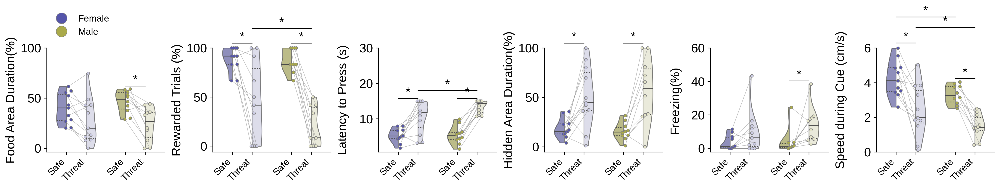

In [22]:
safe_food_area = behavior_results_sex['safe_food_area']
threat_food_area = behavior_results_sex['threat_food_area']
safe_hidden_area = behavior_results_sex['safe_hidden_area']
threat_hidden_area = behavior_results_sex['threat_hidden_area']
safe_freezing = behavior_results_sex['safe_freezing']
threat_freezing = behavior_results_sex['threat_freezing']
safe_rewarded = behavior_results_sex['safe_rewarded'].copy()
threat_rewarded = behavior_results_sex['threat_rewarded'].copy()
safe_rewarded['Data'] = pd.DataFrame(behavior_results_sex['safe_rewarded'].iloc[:,1:-1].mean(axis =1)*100)
threat_rewarded['Data'] = pd.DataFrame(behavior_results_sex['threat_rewarded'].iloc[:,1:-1].mean(axis =1)*100)
safe_latency = behavior_results_sex['safe_latency'].copy()
threat_latency  = behavior_results_sex['threat_latency'].copy()
safe_latency['Data'] = pd.DataFrame(behavior_results_sex['safe_latency'].iloc[:,1:-1].mean(axis =1))
threat_latency['Data'] = pd.DataFrame(behavior_results_sex['threat_latency'].iloc[:,1:-1].mean(axis =1))
safe_speed = behavior_results_sex['safe_speed_cue'].copy()
threat_speed  = behavior_results_sex['threat_speed_cue'].copy()
safe_speed['Data'] = pd.DataFrame(behavior_results_sex['safe_speed_cue'].iloc[:,1:-1].mean(axis =1))*100
threat_speed['Data'] = pd.DataFrame(behavior_results_sex['threat_speed_cue'].iloc[:,1:-1].mean(axis =1))*100
title_splitviolin = None
figsize = (18, 3.8) 

y_label_food = 'Food Area Duration(%)'
y_label_speed = 'Speed during Cue (cm/s)'
y_label_speed_1s = 'Speed 1s Post-Cue (m/s)'
y_label_rewarded = 'Rewarded Trials (%)'
y_label_latency = 'Latency to Press (s)'
ylim_food = (None, 100)
ylim_hidden = (None, 100)
ylim_speed = (0, 6)
ylim_rewarded = (None, 100)
ylim_latency = (None, 30)

fig, axs = plt.subplots(1, 6, figsize=figsize, dpi=300)


split_violin_with_dots_lines_sex(axs[0], safe_food_area, threat_food_area, 'Safe', 'Threat',title_splitviolin, y_label_food, ylim_food, label = True)
split_violin_with_dots_lines_sex(axs[1], safe_rewarded, threat_rewarded, 'Safe', 'Threat',title_splitviolin, y_label_rewarded, ylim_rewarded, label = False)
split_violin_with_dots_lines_sex(axs[2], safe_latency, threat_latency, 'Safe', 'Threat',title_splitviolin, y_label_latency, ylim_latency, label = False)
split_violin_with_dots_lines_sex(axs[3], safe_hidden_area, threat_hidden_area, 'Safe', 'Threat',title_splitviolin, y_label_hidden, ylim_hidden, label = False)
split_violin_with_dots_lines_sex(axs[4], safe_freezing, threat_freezing, 'Safe', 'Threat',title_splitviolin, y_label_freezing, ylim_freezing, label = False)
split_violin_with_dots_lines_sex(axs[5], safe_speed, threat_speed, 'Safe', 'Threat',title_splitviolin, y_label_speed, ylim_speed, label = False)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_sex_catodor.svg", transparent = True, bbox_inches = 'tight')

plt.show()

## Clustering

In [35]:
safe_food_area = behavior_results_sex['safe_food_area'].Data
cat_food_area = behavior_results_sex['cat_food_area'].Data
threat_food_area = behavior_results_sex['threat_food_area'].Data
safe_freezing = behavior_results_sex['safe_freezing'].Data
cat_freezing = behavior_results_sex['cat_freezing'].Data
threat_freezing = behavior_results_sex['threat_freezing'].Data
safe_hidden_area = behavior_results_sex['safe_hidden_area'].Data
cat_hidden_area = behavior_results_sex['cat_hidden_area'].Data
threat_hidden_area = behavior_results_sex['threat_hidden_area'].Data
safe_rewarded = behavior_results_sex['safe_rewarded'].iloc[:,1:-1].mean(axis =1)*100
threat_rewarded = behavior_results_sex['threat_rewarded'].iloc[:,1:-1].mean(axis =1)*100
safe_latency = behavior_results_sex['safe_latency'].iloc[:,1:-1].mean(axis =1)
threat_latency = behavior_results_sex['threat_latency'].iloc[:,1:-1].mean(axis =1)


In [36]:
cluster_data = pd.concat([safe_food_area,cat_food_area,threat_food_area,safe_freezing,cat_freezing,threat_freezing,
                        safe_hidden_area,cat_hidden_area,threat_hidden_area,safe_rewarded,threat_rewarded,safe_latency,threat_latency], axis =1)
cluster_data.columns = ['safe_food_area','cat_food_area','threat_food_area','safe_freezing','cat_freezing','threat_freezing',
                        'safe_hidden_area','cat_hidden_area','threat_hidden_area','safe_rewarded','threat_rewarded','safe_latency','threat_latency']

In [37]:
cluster_data

,safe_food_area,cat_food_area,threat_food_area,safe_freezing,cat_freezing,threat_freezing,safe_hidden_area,cat_hidden_area,threat_hidden_area,safe_rewarded,threat_rewarded,safe_latency,threat_latency
0,61.674586,30.411159,74.716134,1.429793,2.838395,11.801004,9.931719,61.322495,1.108126,100.000000,100.000000,1.738333,3.438417
1,20.479263,9.661591,8.036191,11.412125,26.828049,43.320121,12.996837,75.143837,88.091230,91.666667,0.000000,5.162417,15.000000
2,58.601806,37.936989,44.290155,0.489641,2.932397,2.438850,14.391756,25.090544,0.000000,66.666667,8.333333,8.989917,14.982583
3,52.359002,19.620592,42.899859,1.018929,1.842540,6.304347,3.996220,44.917973,37.529064,91.666667,33.333333,4.845917,12.400167
4,43.094917,25.701904,19.922937,0.000000,0.196675,0.000000,22.697403,47.646652,42.068407,66.666667,50.000000,7.993417,10.902583
5,20.258228,37.146848,11.565975,9.710456,0.673679,2.747407,13.107216,32.295092,49.542654,66.666667,41.666667,7.950000,11.776750
6,32.663078,38.128120,43.092465,7.034599,1.178363,9.121486,34.344689,34.421527,10.231546,91.666667,100.000000,5.173167,3.127500
7,40.153023,62.668964,48.639591,5.558468,12.786704,16.540335,23.602328,22.936974,36.240508,100.000000,91.666667,4.353083,5.432250
8,37.858900,44.117127,43.178780,0.000000,5.073534,7.019413,31.696021,45.043800,51.770230,75.000000,8.333333,9.910000,13.768750
9,46.528974,31.602045,35.147804,3.409034,1.152581,11.332248,16.504911,36.041856,30.714592,83.333333,41.666667,4.082417,11.648417


In [38]:
# Check for missing values in the relevant columns
missing_values = cluster_data.isnull().sum()

# Standardizing the data (if there are no missing values)
if missing_values.sum() == 0:
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(cluster_data)
else:
    data_scaled = None

Number of PCs = 13
Number of PCs to keep = 3


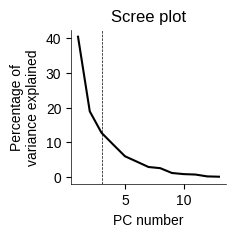

In [40]:
pca = PCA(n_components=data_scaled.shape[1])
df_pca = pca.fit_transform(data_scaled)
pca_vectors = pca.components_
print ('Number of PCs = %d'%(pca_vectors.shape[0]))

x = 100*pca.explained_variance_ratio_
xprime = x - (x[0] + (x[-1]-x[0])/(x.size-1)*np.arange(x.size))
num_retained_pcs = np.argmin(xprime)
numcols = 3.0

print ('Number of PCs to keep = %d'%(num_retained_pcs))


fig, ax = plt.subplots(figsize=(2,2))
ax.plot(np.arange(pca.explained_variance_ratio_.shape[0]).astype(int)+1, x, 'k')
ax.set_ylabel('Percentage of\nvariance explained')
ax.set_xlabel('PC number')
ax.axvline(num_retained_pcs, linestyle='--', color='k', linewidth=0.5)
ax.set_title('Scree plot')
#ax.set_xlim([0,5])
[i.set_linewidth(0.5) for i in ax.spines.values()]
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)


In [41]:
# PCA for dimensionality reduction
pca = PCA(n_components=3)
df_pca = pca.fit_transform(data_scaled)

# Various clustering algorithms
algorithms = {
    'KMeans': KMeans(n_clusters=2),
    'AgglomerativeClustering': AgglomerativeClustering(n_clusters=2),
    'DBSCAN': DBSCAN(eps=0.5, min_samples=5),
    'MeanShift': MeanShift(),
    'GaussianMixture': GaussianMixture(n_components=2),
    'SpectralClustering': SpectralClustering(n_clusters=2, affinity='nearest_neighbors'),
    'AffinityPropagation': AffinityPropagation()
}

# Dictionary to store the silhouette scores for each algorithm
silhouette_scores = {}

# Apply each clustering algorithm and calculate silhouette scores
for name, algorithm in algorithms.items():
    # Special case for GaussianMixture, which uses 'predict' instead of 'fit_predict'
    if name == 'GaussianMixture':
        algorithm.fit(df_pca)
        labels = algorithm.predict(df_pca)
    elif name == 'SpectralClustering':
        # Spectral Clustering may require the affinity matrix to be precomputed
        try:
            labels = algorithm.fit_predict(df_pca)
        except:
            algorithm = SpectralClustering(n_clusters=2, affinity='rbf')
            labels = algorithm.fit_predict(df_pca)
    else:
        labels = algorithm.fit_predict(df_pca)

    # Calculate the silhouette score and store it
    score = silhouette_score(df_pca, labels) if len(set(labels)) > 1 else float('-inf')  # avoid error if only one cluster is found
    silhouette_scores[name] = score

# Return the silhouette scores for comparison
silhouette_scores


/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


{'KMeans': 0.38784683557714816,
 'AgglomerativeClustering': 0.38784683557714816,
 'DBSCAN': -inf,
 'MeanShift': 0.38604421356947394,
 'GaussianMixture': 0.331600719186325,
 'SpectralClustering': 0.38784683557714816,
 'AffinityPropagation': 0.4654776359482399}

/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the va

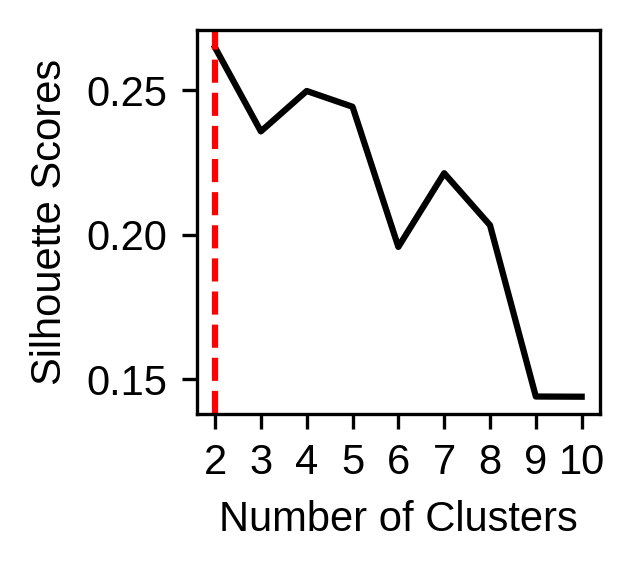

In [42]:
# Assuming 'data_scaled_combined' is your scaled dataset
silhouette_list = []
range_of_clusters = range(2, 11)  # Evaluating the inertia for 1 to 10 clusters

for num_clusters in range_of_clusters:
    kmeans = KMeans(n_clusters=num_clusters, random_state=0)
    kmeans.fit(data_scaled)
    silhouette_list.append(silhouette_score(data_scaled, kmeans.labels_))
    
max_point = np.argmax(silhouette_list)+2
# Now let's plot the elbow plot with the elbow point marked
plt.figure(figsize=(2.2, 2), dpi = 300)
plt.plot(range_of_clusters, silhouette_list, c = 'black')
# plt.title('Silhouette Scores for K-means Clustering')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Scores')
plt.xticks(range_of_clusters)
plt.axvline(x=max_point, color='red', linestyle='--')
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_cluster_silhouette_catodor.svg")

plt.show()



/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 2, the average silhouette_score is : 0.26488507618207546


/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the va

For n_clusters = 3, the average silhouette_score is : 0.23580153084175853
For n_clusters = 4, the average silhouette_score is : 0.24980565331342955
For n_clusters = 5, the average silhouette_score is : 0.24434133292720486
For n_clusters = 6, the average silhouette_score is : 0.19577820994605322
For n_clusters = 7, the average silhouette_score is : 0.22130826875418666
For n_clusters = 8, the average silhouette_score is : 0.20329139246201486
For n_clusters = 9, the average silhouette_score is : 0.1439293462897345
For n_clusters = 10, the average silhouette_score is : 0.14386507586928496


/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


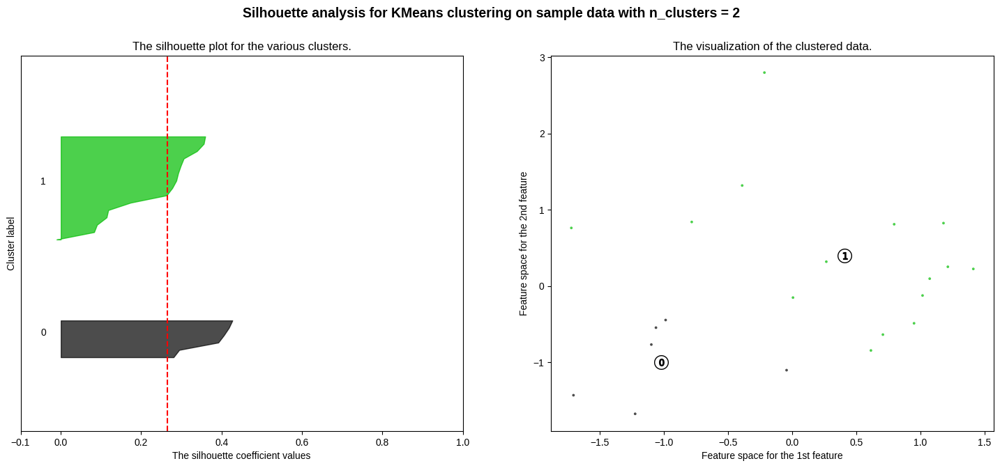

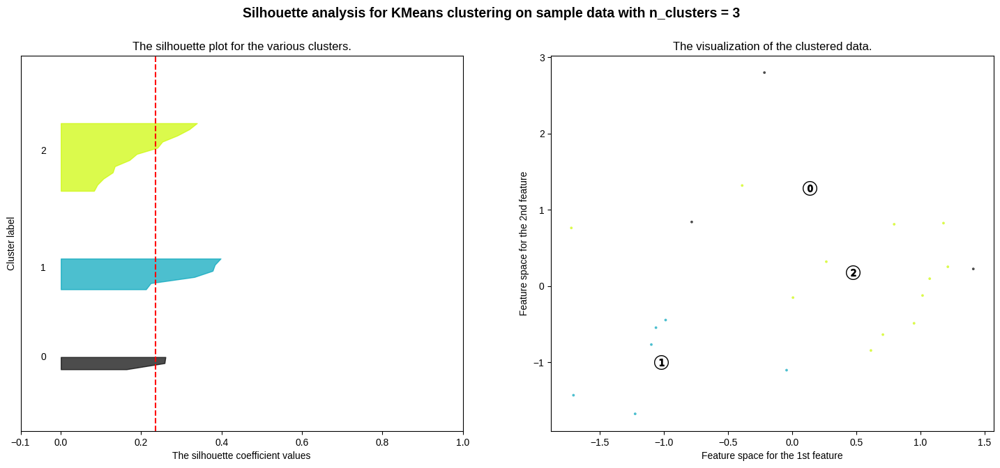

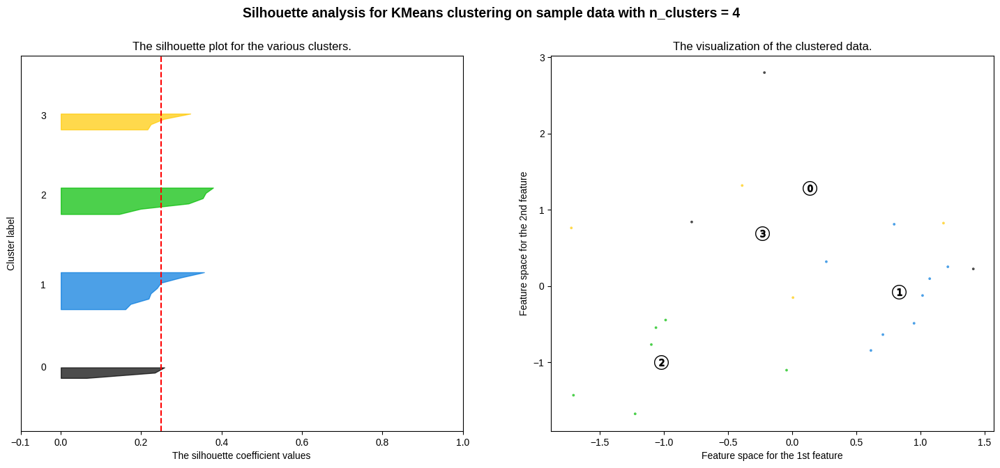

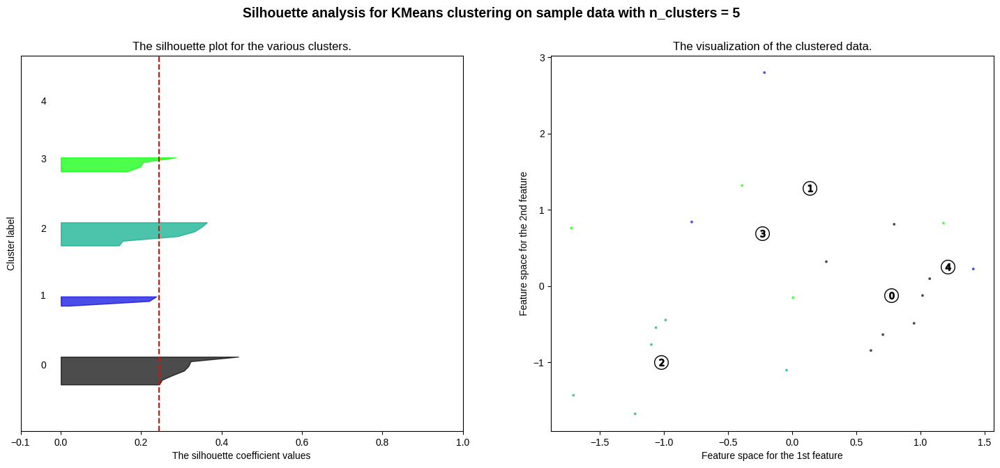

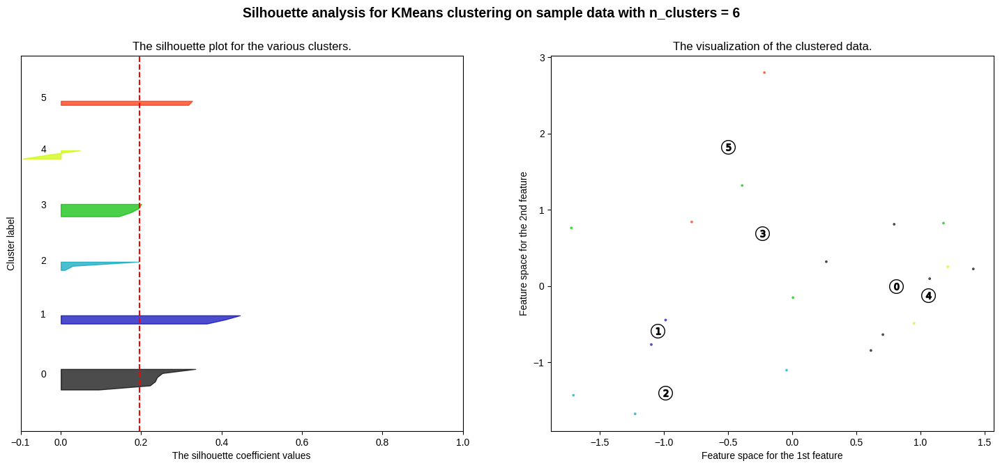

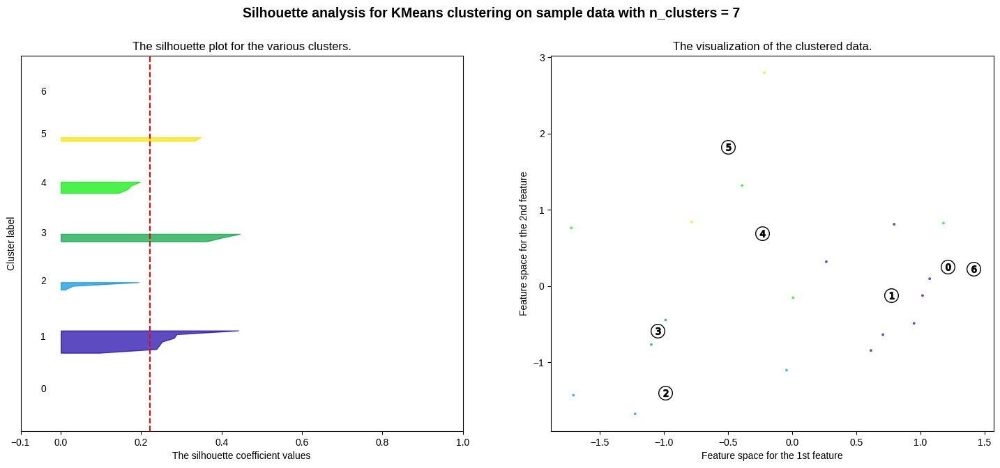

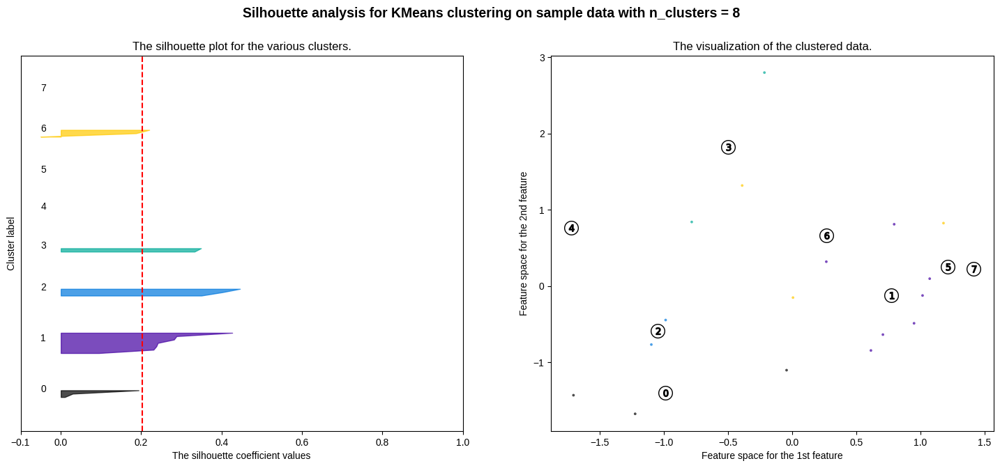

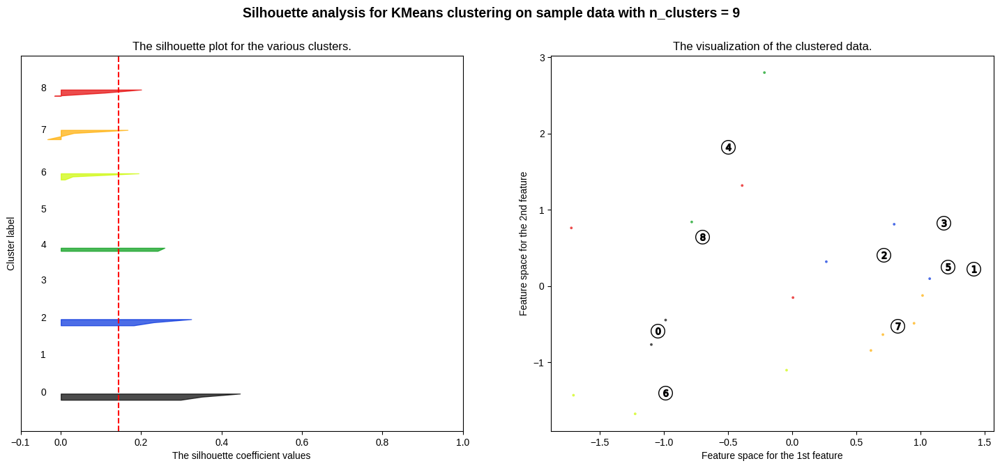

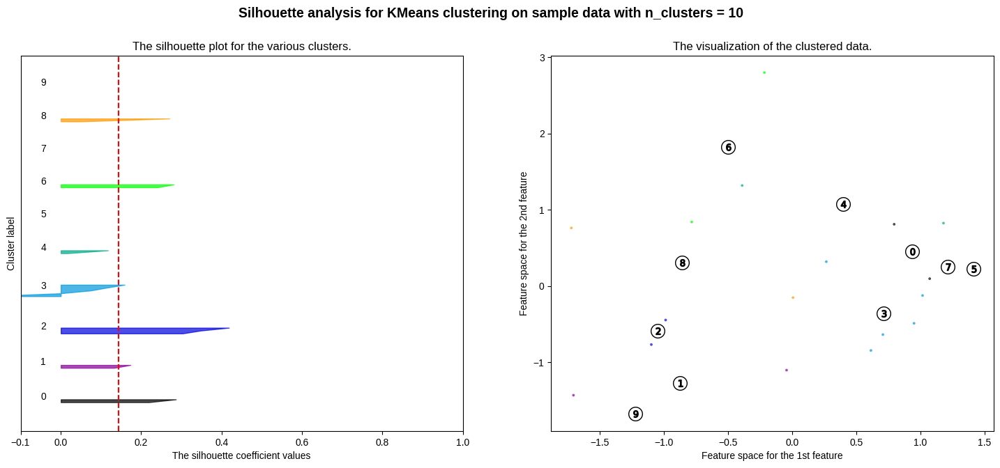

In [43]:
# Assuming 'data_scaled' is your scaled dataset
range_of_clusters = range(2, 11)

for num_clusters in range_of_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1 to 1
    ax1.set_xlim([-0.1, 1])
    # The (num_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_scaled) + (num_clusters + 1) * 10])

    # Initialize the clusterer with num_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=num_clusters, random_state=0)
    cluster_labels = clusterer.fit_predict(data_scaled)

    # The silhouette_score gives the average value for all the samples.
    silhouette_avg = silhouette_score(data_scaled, cluster_labels)
    print(f"For n_clusters = {num_clusters}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_scaled, cluster_labels)

    y_lower = 10
    for i in range(num_clusters):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / num_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    # This assumes data_scaled is a 2D array for visualization purposes
    if data_scaled.shape[1] >= 2:
        colors = cm.nipy_spectral(cluster_labels.astype(float) / num_clusters)
        ax2.scatter(data_scaled[:, 0], data_scaled[:, 1], marker=".", s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor="k")

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker="o", c="white", alpha=1,
                    s=200, edgecolor="k")

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker=f"${i}$", alpha=1, s=50, edgecolor="k")

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(f"Silhouette analysis for KMeans clustering on sample data with n_clusters = {num_clusters}",
                 fontsize=14, fontweight="bold")



In [44]:
# Perform K-means clustering
kmeans = KMeans(n_clusters=2, random_state=0)
clusters = kmeans.fit_predict(data_scaled)
inertia = kmeans.inertia_
silhouette = silhouette_score(data_scaled, kmeans.labels_)

# Add the cluster labels to the original data
cluster_data_kmeans = cluster_data.copy()
cluster_data_kmeans['Cluster'] = clusters.astype('str')



/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [45]:
cluster_data_kmeans

,safe_food_area,cat_food_area,threat_food_area,safe_freezing,cat_freezing,threat_freezing,safe_hidden_area,cat_hidden_area,threat_hidden_area,safe_rewarded,threat_rewarded,safe_latency,threat_latency,Cluster
0,61.674586,30.411159,74.716134,1.429793,2.838395,11.801004,9.931719,61.322495,1.108126,100.000000,100.000000,1.738333,3.438417,1
1,20.479263,9.661591,8.036191,11.412125,26.828049,43.320121,12.996837,75.143837,88.091230,91.666667,0.000000,5.162417,15.000000,0
2,58.601806,37.936989,44.290155,0.489641,2.932397,2.438850,14.391756,25.090544,0.000000,66.666667,8.333333,8.989917,14.982583,1
3,52.359002,19.620592,42.899859,1.018929,1.842540,6.304347,3.996220,44.917973,37.529064,91.666667,33.333333,4.845917,12.400167,1
4,43.094917,25.701904,19.922937,0.000000,0.196675,0.000000,22.697403,47.646652,42.068407,66.666667,50.000000,7.993417,10.902583,1
5,20.258228,37.146848,11.565975,9.710456,0.673679,2.747407,13.107216,32.295092,49.542654,66.666667,41.666667,7.950000,11.776750,1
6,32.663078,38.128120,43.092465,7.034599,1.178363,9.121486,34.344689,34.421527,10.231546,91.666667,100.000000,5.173167,3.127500,1
7,40.153023,62.668964,48.639591,5.558468,12.786704,16.540335,23.602328,22.936974,36.240508,100.000000,91.666667,4.353083,5.432250,1
8,37.858900,44.117127,43.178780,0.000000,5.073534,7.019413,31.696021,45.043800,51.770230,75.000000,8.333333,9.910000,13.768750,1
9,46.528974,31.602045,35.147804,3.409034,1.152581,11.332248,16.504911,36.041856,30.714592,83.333333,41.666667,4.082417,11.648417,1


In [49]:


# Create a contingency table
contingency_table = pd.crosstab(behavior_results_sex['safe_food_area'].Sex, cluster_data_kmeans.Cluster)

print("Contingency Table:")
print(contingency_table)

# Performing Fisher's Exact Test
odds_ratio, p_value = fisher_exact(contingency_table)

print(f"Fisher's Exact Test results:")
print(f"Odds Ratio: {odds_ratio:.4f}, P-value: {p_value:.4f}")


Contingency Table:
Cluster  0  1
Sex          
F        3  8
M        3  7
Fisher's Exact Test results:
Odds Ratio: 0.8750, P-value: 1.0000


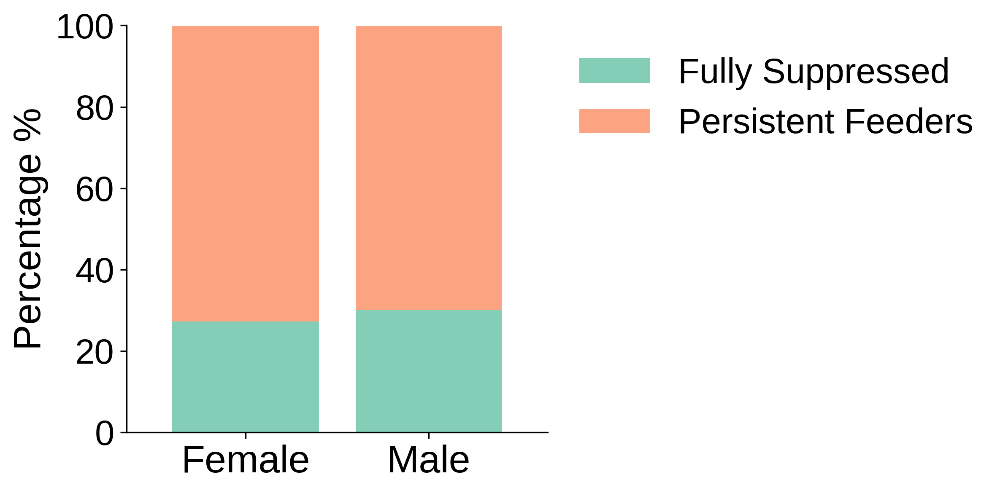

In [50]:

# Assuming you have a prepared contingency table from your provided variables
contingency_table = pd.crosstab(behavior_results_sex['safe_food_area'].Sex, cluster_data_kmeans.Cluster)

# Calculate percentages for the stacked bar plot
contingency_percentages = contingency_table.div(contingency_table.sum(axis=1), axis=0) * 100

# Plotting
fig, ax = plt.subplots(figsize=(8, 4), dpi=300)
colors = [sns.color_palette('Set2')[0], sns.color_palette('Set2')[1]]  # Custom color palette from seaborn
contingency_percentages.plot(kind='bar', stacked=True, color=colors, ax=ax, alpha=0.8, width = 0.8)

# Customize the plot aesthetics
ax.set_ylabel('Percentage %', fontsize=22)  # Setting font size for y-axis label
plt.xticks(rotation=0, fontsize=20)  # Adjusting the x-axis labels for better readability with increased font size
plt.yticks(fontsize=20)  # Adjusting the y-axis labels font size
ax.yaxis.set_major_locator(MaxNLocator(5, integer=True))
ax.set_ylim(0, 100)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xticklabels(['Female', 'Male'], fontsize=22)
ax.set_xlabel("")

# Adjusting the legend
cluster_labels = {0: 'Fully Suppressed', 1: 'Persistent Feeders'}
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, [cluster_labels[int(label)] for label in labels], loc=0, fontsize=20, 
          bbox_to_anchor=(1, 1), framealpha=0)

ax.margins(0.2)
plt.subplots_adjust(right=0.75)  # Adjust right margin to give space for the legend


# Adjusting margins and layout
plt.tight_layout()

# Uncomment the next line to save the figure
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_percentage_cluster_sex_catodor.svg", transparent=True)

# Show the plot
plt.show()






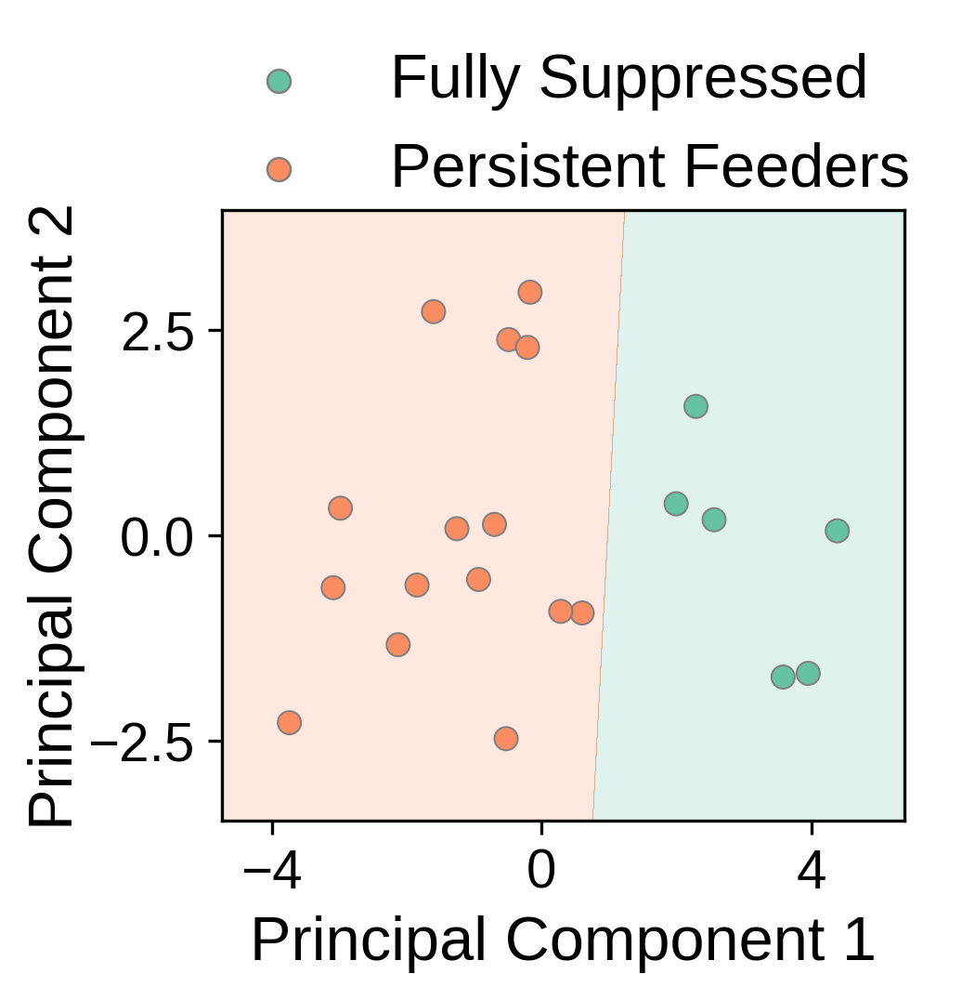

In [51]:
labels = kmeans.labels_
labels = ['Fully Suppressed' if i == 0 else 'Persistent Feeders' for i in kmeans.labels_]

# PCA to reduce to 2 dimensions for visualization
pca = PCA(n_components=2)
principal_components = pca.fit_transform(data_scaled)

# Get unique clusters for color palette
unique_clusters = np.unique(labels)

# Set color palette for scatter plot
scatter_palette = sns.color_palette('Set2', len(unique_clusters))
# Create a color map that maps each label to a color in the scatter_palette
label_color_map = {
    'Fully Suppressed': scatter_palette[0],
    'Persistent Feeders': scatter_palette[1]
}

# Plot
fig, ax = plt.subplots(figsize=(3.5, 4), dpi=300)
centroids_pca = pca.transform(kmeans.cluster_centers_)

# Create a meshgrid for the Voronoi diagram
x_min, x_max = principal_components[:, 0].min() - 1, principal_components[:, 0].max() + 1
y_min, y_max = principal_components[:, 1].min() - 1, principal_components[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 6000), np.linspace(y_min, y_max, 6000))
Z = kmeans.predict(pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()]))
Z = Z.reshape(xx.shape)
# Set color palette for contour
contour_palette = sns.color_palette('Set2', len(np.unique(Z)))
contour_color_map = ListedColormap([label_color_map[label] for label in np.unique(labels)])


# Plot
ax.contourf(xx, yy, Z, alpha=0.2, cmap=contour_color_map)
sns.scatterplot(ax = ax, x=principal_components[:, 0], y=principal_components[:, 1], hue=labels, palette=label_color_map, edgecolor = 'grey', lw = 0.6)
ax.set_xlabel('Principal Component 1', fontsize = 16)
ax.set_ylabel('Principal Component 2', fontsize = 16)
ax.tick_params(axis = 'x', labelsize=14)
ax.tick_params(axis = 'y', labelsize=14)
# legend = plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), fontsize=6, frameon=False)
# legend.get_frame().set_facecolor('none')

# Get the legend handles
handles, labels = ax.get_legend_handles_labels()

# Iterate through the handles and call `set_edgecolor` on each
for ha in handles:
    ha.set_edgecolor("grey")
    ha.set_linewidth(0.6)

ordered_labels = ['Fully Suppressed', 'Persistent Feeders']
ordered_handles = [handles[labels.index(l)] for l in ordered_labels]

# # Use `ax.legend` to set the modified handles and labels
lgd = ax.legend(
    ordered_handles,
    ordered_labels,
    loc="upper center", 
    bbox_to_anchor=(0.5, 1.35),
    ncol=1,
    fontsize=16, 
    frameon=False
)
lgd.get_frame().set_facecolor('none')

ax.xaxis.set_major_locator(matplotlib.ticker.MaxNLocator(3))
ax.yaxis.set_major_locator(matplotlib.ticker.MaxNLocator(3))
ax.yaxis.set_label_coords(-0.2, 0.5)  # Adjust label position
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_cluster_pca_catodor.svg")
plt.show()

In [54]:
def generate_symmetric_points(center, spread, n_points):
    if n_points == 1:
        return np.array([center])
    else:
        offsets = np.linspace(-spread, spread, n_points)
        return center + offsets

def group_values_with_indices(values, threshold):
    sorted_indices = np.argsort(values)
    sorted_values = values[sorted_indices]
    groups = [([sorted_values[0]], [sorted_indices[0]])]
    for i in range(1, len(values)):
        if abs(sorted_values[i] - groups[-1][0][-1]) <= threshold:
            groups[-1][0].append(sorted_values[i])
            groups[-1][1].append(sorted_indices[i])
        else:
            groups.append(([sorted_values[i]], [sorted_indices[i]]))
    return groups

def perform_pairwise_comparisons_and_correct(df, alpha=0.05):
    p_values = []
    comparisons = []

    # Calculate SD for each group
    group_sds = df.groupby(['Cluster', 'Condition'])['Data'].std()
    group_sizes = df.groupby(['Cluster', 'Condition'])['Data'].count()
    
    # Calculate pooled variance
    pooled_variance = sum((sizes - 1) * sds**2 for sizes, sds in zip(group_sizes, group_sds)) / (sum(group_sizes) - len(group_sizes))
    
    stages = df['Cluster'].unique()
    treatments = df['Condition'].unique()
    
    for stage in sorted(stages):
        stage_data = df[df['Cluster'] == stage]
        treatment_combinations = list(combinations(treatments, 2))
        
        for treatment1, treatment2 in treatment_combinations:
            data1 = stage_data[stage_data['Condition'] == treatment1]['Data']
            data2 = stage_data[stage_data['Condition'] == treatment2]['Data']
            
            n1, n2 = len(data1), len(data2)
            
            # Calculate SE for this comparison using pooled variance
            se = np.sqrt(pooled_variance * (1/n1 + 1/n2))
            
            # Compute mean difference
            mean_diff = np.mean(data1) - np.mean(data2)
            
            # Compute the t-statistic using the calculated SE
            t_stat = mean_diff / se
            
            # Degrees of freedom, approximated for pooled samples
            df_degrees = sum(group_sizes) - len(group_sizes)
            
            # Calculate p-value using the t-distribution
            p_value = 2 * (1 - t.cdf(np.abs(t_stat), df_degrees))
            p_values.append(p_value)
            comparisons.append(f"{stage}: {treatment1} vs. {treatment2}")
    
    # Apply Bonferroni correction for multiple comparisons
    _, corrected_p_values, _, _ = multipletests(p_values, alpha=alpha, method='sidak')
    
    # Combine comparisons and their corrected p-values
    comparison_results = list(zip(comparisons, corrected_p_values))
    
    return comparison_results

def perform_pairwise_comparisons_by_treatment(df, mse, alpha=0.05):
    p_values = []
    comparisons = []

    # Calculate SD for each group
    group_sds = df.groupby(['Condition', 'Cluster'])['Data'].std()
    group_sizes = df.groupby(['Condition', 'Cluster'])['Data'].count()

    # Calculate pooled variance
    pooled_variance = mse

    treatments = df['Condition'].unique()
    stages = df['Cluster'].unique()

    for treatment in treatments:
        treatment_data = df[df['Condition'] == treatment]
        stage_combinations = list(combinations(stages, 2))

        for stage1, stage2 in stage_combinations:
            data1 = treatment_data[treatment_data['Cluster'] == stage1]['Data']
            data2 = treatment_data[treatment_data['Cluster'] == stage2]['Data']

            n1, n2 = len(data1), len(data2)

            # Calculate SE for this comparison using pooled variance
            se = np.sqrt(pooled_variance * (1/n1 + 1/n2))

            # Compute mean difference
            mean_diff = np.mean(data1) - np.mean(data2)

            # Compute the t-statistic using the calculated SE
            t_stat = mean_diff / se

            # Degrees of freedom, approximated for pooled samples
            df_degrees = (sum(group_sizes) - len(group_sizes))/2

            # Calculate p-value using the t-distribution
            p_value = 2 * (1 - t.cdf(np.abs(t_stat), df_degrees))
            p_values.append(p_value)
            comparisons.append(f"{treatment}: {stage1} vs. {stage2}")

    # Apply Bonferroni correction for multiple comparisons
    _, corrected_p_values, _, _ = multipletests(p_values, alpha=alpha, method='sidak')

    # Combine comparisons and their corrected p-values
    comparison_results = list(zip(comparisons, corrected_p_values))

    return comparison_results

def split_violin_with_dots_lines_multicluster(ax, data1, data2, data1_name, data2_name, title, y_label, ylim, label, point_size=8, line_width=0.6):
    # Combine data1 and data2 into a single DataFrame
    data1['Condition'] = data1_name
    data2['Condition'] = data2_name
    combined_data = pd.concat([data1[['animal_id','Data', 'Condition','Cluster']], data2[['animal_id','Data', 'Condition','Cluster']]])
    conditions = combined_data['Condition'].unique()
    
    # Encode categorical variables
    combined_data['Cluster'] = pd.Categorical(combined_data['Cluster'])
    combined_data['Condition'] = pd.Categorical(combined_data['Condition'])

    # Perform 2-way RM ANOVA using MixedLM
    model = MixedLM.from_formula("Data ~ Cluster * Condition", combined_data, groups=combined_data["animal_id"], re_formula="~Condition")
    results = model.fit()
    mse = results.scale
    print(results.summary())

    # The fixed effects are typically in the second table (index 1)
    fixed_effects_df = results.summary().tables[1]
    
    interaction_term = results.model.exog_names[-1]

    # Construct the hypothesis
    hypothesis = f'{interaction_term} = 0'

    # Perform the F-test
    f_test_result = results.f_test(hypothesis)
    print(f'F-test result for {interaction_term}: {f_test_result}')
    
    # Assuming the interaction term is in the third row (index 2) and the p-value is in the fourth column (index 3)
    interaction_p_value = float(fixed_effects_df.iloc[2, 3])
    print("Interaction: p-value =", interaction_p_value)

    # Number of clusters
    unique_clusters = sorted(combined_data['Cluster'].unique())
    
    results = perform_pairwise_comparisons_and_correct(combined_data)
    for result in results:
        print(result)
        
    # Perform pairwise comparisons
    results_by_treatment = perform_pairwise_comparisons_by_treatment(combined_data, mse)
    for result in results_by_treatment:
        print(result)

    # Prepare plot_data with positions for the violin plot
    plot_data = combined_data.copy()
    num_conditions = 2  # Number of conditions
    plot_positions = {}
    gap_index = 0  # To create a gap between clusters
    for i, cluster in enumerate(sorted(unique_clusters)):
        plot_positions[cluster] = [gap_index * num_conditions+gap_index, gap_index * num_conditions + 1+gap_index]
        gap_index += 1  # Increase index for the next cluster

        # Add dummy category for the gap
        for gap in range(gap_index - 1):
            dummy_data = pd.DataFrame({'PlotPos': [gap * (num_conditions+1)+2], 'Data': [None], 'Condition': [None], 'Cluster': [None]})
            plot_data = pd.concat([plot_data, dummy_data], ignore_index=True)

    plot_data['PlotPos'] = plot_data.apply(lambda row: plot_positions[row['Cluster']][0 if row['Condition'] == data1_name else 1] if pd.notna(row['Cluster']) else row['PlotPos'], axis=1)


    # Prepare colors for each cluster and condition
    base_colors = sns.color_palette('Set2', len(unique_clusters))
    condition_colors = {cluster: {data1_name: to_rgb(base_colors[i]), data2_name: 0.7 + 0.3 * np.array(to_rgb(base_colors[i]))} for i, cluster in enumerate(sorted(unique_clusters))}

    for cluster in sorted(unique_clusters):
        cls_data = plot_data[plot_data.Cluster == cluster]

        for i in set(plot_data.PlotPos) - set(cls_data.PlotPos):
            dummy_data = pd.DataFrame({'PlotPos': [i], 'Data': [None], 'Condition': [None], 'Cluster': [None]})
            cls_data = pd.concat([cls_data, dummy_data], ignore_index=True)
        sns.violinplot(x = 'PlotPos', y='Data', hue='Condition', 
               data=cls_data, 
               fill=False, split=True, width=1, palette=condition_colors[cluster], scale_hue=False,
               linewidth=1, inner='quart', cut=0, ax=ax, dodge = 'auto')


    ax.legend().remove()
    plt.setp(ax.collections, alpha=0.7)

    # Initialize a dictionary to store coordinates for connecting lines
    point_coords = {}
    
    # Calculate the diameter in points
    diameter_points = 2 * sqrt(point_size / pi)
    actual_ylim = ax.get_ylim()
    
    # Convert diameter to inches
    diameter_inches = diameter_points / 72

    # Get the height of the axes in inches
    bbox = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    axes_height_inches = bbox.height

    # Get the conversion factor from inches to data units
    y_range = ylim[1] - actual_ylim[0]
    conversion_factor = y_range / axes_height_inches

    # Convert diameter from points to data units
    diameter_data_units = diameter_inches * conversion_factor
    
    # Spread scatter points for each cluster and store their coordinates
    offset = 0.1  # Adjust this value to change the spread of points
    for cluster in unique_clusters:
        for condition in [data1_name, data2_name]:
            condition_data = plot_data[(plot_data['Cluster'] == cluster) & (plot_data['Condition'] == condition)]
            grouped_values = group_values_with_indices(condition_data['Data'].values, diameter_data_units)
            condition_color = condition_colors[cluster][condition]

            for group, indices in grouped_values:
                x_positions = generate_symmetric_points(plot_positions[cluster][0 if condition == data1_name else 1], offset, len(condition_data))

                for i, idx in enumerate(indices):
                    animal_id = condition_data.iloc[idx].animal_id  # Correct index from group_data
                    x_coord = x_positions[i]+0.1
                    y_value = condition_data[condition_data.animal_id == animal_id].Data.values
                    if animal_id not in point_coords:
                        point_coords[animal_id] = {}
                        
                    # Store the coordinates for lines
                    point_coords[animal_id][condition] = (x_coord, y_value)

                    ax.scatter(x_coord, y_value, color=condition_color, edgecolors='gray', alpha=1, clip_on=False, s=point_size, lw=line_width, zorder=3)

 
    # Draw connecting lines based on stored coordinates
    for animal_id, coords in point_coords.items():
        if data1_name in coords and data2_name in coords:
            x_coords = [coords[data1_name][0], coords[data2_name][0]]
            y_coords = [coords[data1_name][1], coords[data2_name][1]]
            ax.plot(x_coords, y_coords, color='gray', alpha=0.5, linewidth=line_width)

#     y_max = min(combined_data['Data'].max()*1.05, ylim[1]*1.05)
#     for i, (cluster, p_value) in enumerate(zip(unique_clusters, sidak_corrected[1])):
#         if p_value < 0.05:
#             x_coords = plot_positions[cluster]
#             ax.plot([x_coords[0], x_coords[0], x_coords[1], x_coords[1]], [y_max, y_max, y_max, y_max], lw=0.8, c='k', clip_on=False)
#             # Add asterisk for significance
#             ax.text((x_coords[0] + x_coords[1]) / 2, y_max, "*", ha='center', va='bottom', color='k', fontsize=16)

    # Check for significance and annotate for data1 and data2
    for cluster, p_value in zip(unique_clusters, results):
        
        if p_value[1] < 0.05:
            y_max = min(combined_data[combined_data['Cluster'] == cluster]['Data'].max()*1.05, ylim[1]*1.05)
            x_coords = plot_positions[cluster]
            # Draw lines for significance
            ax.plot([x_coords[0], x_coords[0], x_coords[1], x_coords[1]], [y_max, y_max, y_max, y_max], lw=0.8, c='k', clip_on=False)
            # Add asterisk for significance
            ax.text((x_coords[0] + x_coords[1]) / 2, y_max, "*", ha='center', va='bottom', color='k', fontsize=16)

    # Ensure conditions is a list
    conditions = list(combined_data['Condition'].unique())

    # Define an offset for the y-coordinate of the horizontal line
    y_offset = 15 # Adjust the offset value as needed

    # Iterate over results_by_treatment for significance annotations
    for result in results_by_treatment:
        comparison, p_value = result
        treatment, cluster_comparison = comparison.split(":")
        cluster1, cluster2 = cluster_comparison.strip().split(" vs. ")

        if p_value < 0.05:
            # Calculate the global maximum y-value for adjusting the horizontal line
            global_max_y = combined_data['Data'].max() * 1.3
            # Set the baseline y-coordinate for the horizontal line
            y_baseline = min(ylim[1] * 1.2, global_max_y)

            # Adjust the y-coordinate for the horizontal line based on the condition
            if treatment == conditions[0]:  # Assuming conditions[0] is the first condition
                y_horizontal_line = y_baseline - y_offset  # Lower the line for the first condition
            else:
                y_horizontal_line = y_baseline   # Raise the line for the second condition

            # Determine the maximum y-values for vertical lines
            max_y_cluster1 = combined_data[(combined_data['Cluster'] == cluster1) & (combined_data['Condition'] == treatment)]['Data'].max() * 1.05
            max_y_cluster2 = combined_data[(combined_data['Cluster'] == cluster2) & (combined_data['Condition'] == treatment)]['Data'].max() * 1.05

            treatment_index = conditions.index(treatment)
            x_coords_cluster1 = plot_positions[cluster1][treatment_index]
            x_coords_cluster2 = plot_positions[cluster2][treatment_index]

            # Draw horizontal line
            ax.plot([x_coords_cluster1, x_coords_cluster2], [y_horizontal_line, y_horizontal_line], 'k-', lw=0.8, clip_on=False)

            # Add asterisk for significance
            x_midpoint = (x_coords_cluster1 + x_coords_cluster2) / 2
            ax.text(x_midpoint, y_horizontal_line, "*", ha='center', va='bottom', color='k', fontsize=16)
    



    if label:
        custom_legend = [mlines.Line2D([], [], color=condition_colors[cluster][data1_name], marker='o', linestyle='None', markersize=point_size, label='Cluster 0', mec = 'gray', markeredgewidth=line_width) for i, cluster in enumerate(sorted(unique_clusters))]
        ax.legend(custom_legend, ['Fully Supressed' if cluster == '0' else 'Persistent Feeder' for cluster in sorted(unique_clusters)], loc='upper right', frameon=False, markerscale = 1, fontsize = 12, bbox_to_anchor=(1.45, 1.3))

    # Customization and Annotations
    ax.set_xticks([pos for cluster in plot_positions for pos in plot_positions[cluster]])
    ax.set_xticklabels([f'{condition}' for cluster in combined_data['Cluster'].unique() for condition in [data1_name, data2_name]], rotation=45, ha='right', fontsize = 16)
    ax.set_title(title)
    ax.set_xlabel(None)
    ax.set_title(title, fontsize=6, pad = 25)
    ax.set_ylabel(y_label, fontsize=16)
    ax.yaxis.set_label_coords(-0.25, 0.5)  # Adjust label position

    ax.set_ylim(*ylim)
    ax.tick_params(axis = 'x', labelsize=12)
    ax.tick_params(axis = 'y', labelsize=16)
    sns.despine() 
    ax.margins(x=0.2)
    
    return ax

                    Mixed Linear Model Regression Results
Model:                     MixedLM        Dependent Variable:        Data     
No. Observations:          42             Method:                    REML     
No. Groups:                21             Scale:                     81.6752  
Min. group size:           2              Log-Likelihood:            -154.2683
Max. group size:           2              Converged:                 Yes      
Mean group size:           2.0                                                
------------------------------------------------------------------------------
                                  Coef.  Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------------------
Intercept                         29.533    4.337  6.810 0.000  21.033  38.033
Cluster[T.1]                      18.872    5.131  3.678 0.000   8.815  28.929
Condition[T.Threat]              -24.683    6.828 -3.615 0.000 -38.065 -1

/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


                    Mixed Linear Model Regression Results
Model:                     MixedLM        Dependent Variable:        Data     
No. Observations:          42             Method:                    REML     
No. Groups:                21             Scale:                     83.1585  
Min. group size:           2              Log-Likelihood:            -157.2277
Max. group size:           2              Converged:                 Yes      
Mean group size:           2.0                                                
------------------------------------------------------------------------------
                                  Coef.  Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------------------
Intercept                         21.142    3.738  5.656 0.000  13.816  28.469
Cluster[T.1]                      -5.451    4.423 -1.232 0.218 -14.121   3.218
Condition[T.Threat]               70.436    8.886  7.926 0.000  53.019  8

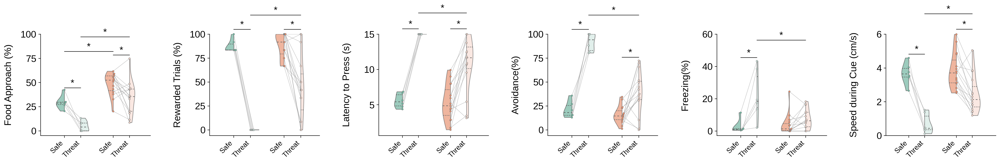

In [55]:

safe_food_area = behavior_results_sex['safe_food_area'].assign(Cluster=cluster_data_kmeans.Cluster.values)
threat_food_area = behavior_results_sex['threat_food_area'].assign(Cluster=cluster_data_kmeans.Cluster.values)
safe_hidden_area = behavior_results_sex['safe_hidden_area'].assign(Cluster=cluster_data_kmeans.Cluster.values)
threat_hidden_area = behavior_results_sex['threat_hidden_area'].assign(Cluster=cluster_data_kmeans.Cluster.values)
safe_freezing = behavior_results_sex['safe_freezing'].assign(Cluster=cluster_data_kmeans.Cluster.values)
threat_freezing = behavior_results_sex['threat_freezing'].assign(Cluster=cluster_data_kmeans.Cluster.values)
safe_rewarded = behavior_results_sex['safe_rewarded'].assign(Cluster=cluster_data_kmeans.Cluster.values).copy()
threat_rewarded = behavior_results_sex['threat_rewarded'].assign(Cluster=cluster_data_kmeans.Cluster.values).copy()
safe_rewarded['Data'] = pd.DataFrame(behavior_results_sex['safe_rewarded'].iloc[:,1:-1].mean(axis =1)*100)
threat_rewarded['Data'] = pd.DataFrame(behavior_results_sex['threat_rewarded'].iloc[:,1:-1].mean(axis =1)*100)
safe_latency = behavior_results_sex['safe_latency'].assign(Cluster=cluster_data_kmeans.Cluster.values).copy()
threat_latency  = behavior_results_sex['threat_latency'].assign(Cluster=cluster_data_kmeans.Cluster.values).copy()
safe_latency['Data'] = pd.DataFrame(behavior_results_sex['safe_latency'].iloc[:,1:-1].mean(axis =1))
threat_latency['Data'] = pd.DataFrame(behavior_results_sex['threat_latency'].iloc[:,1:-1].mean(axis =1))
safe_speed = behavior_results_sex['safe_speed_cue'].assign(Cluster=cluster_data_kmeans.Cluster.values).copy()
threat_speed  = behavior_results_sex['threat_speed_cue'].assign(Cluster=cluster_data_kmeans.Cluster.values).copy()
safe_speed['Data'] = pd.DataFrame(behavior_results_sex['safe_speed_cue'].iloc[:,1:-1].mean(axis =1))*100
threat_speed['Data'] = pd.DataFrame(behavior_results_sex['threat_speed_cue'].iloc[:,1:-1].mean(axis =1))*100
title_splitviolin = None
figsize = (24, 4.1) 

y_label_food = 'Food Approach (%)'
y_label_hidden = 'Avoidance(%)'
y_label_freezing = 'Freezing(%)'
y_label_speed = 'Speed during Cue (cm/s)'
y_label_speed_1s = 'Speed 1s Post-Cue (cm/s)'
y_label_rewarded = 'Rewarded Trials (%)'
y_label_latency = 'Latency to Press (s)'
ylim_food = (None, 100)
ylim_hidden = (None, 100)
ylim_freezing = (None, 60)
ylim_rewarded = (None, 100)
ylim_latency = (None, 15)

fig, axs = plt.subplots(1, 6, figsize=figsize, dpi=300)


split_violin_with_dots_lines_multicluster(axs[0], safe_food_area, threat_food_area, 'Safe', 'Threat',title_splitviolin, y_label_food, ylim_food, label = False)
split_violin_with_dots_lines_multicluster(axs[1], safe_rewarded, threat_rewarded, 'Safe', 'Threat',title_splitviolin, y_label_rewarded, ylim_rewarded, label = False)
split_violin_with_dots_lines_multicluster(axs[2], safe_latency, threat_latency, 'Safe', 'Threat',title_splitviolin, y_label_latency, ylim_latency, label = False)
split_violin_with_dots_lines_multicluster(axs[3], safe_hidden_area, threat_hidden_area, 'Safe', 'Threat',title_splitviolin, y_label_hidden, ylim_hidden, label = False)
split_violin_with_dots_lines_multicluster(axs[4], safe_freezing, threat_freezing, 'Safe', 'Threat',title_splitviolin, y_label_freezing, ylim_freezing, label = False)
split_violin_with_dots_lines_multicluster(axs[5], safe_speed, threat_speed, 'Safe', 'Threat',title_splitviolin, y_label_speed, ylim_speed, label = False)
fig.subplots_adjust(wspace=-0.3, hspace=0.1)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_cluster_catodor.svg", transparent=True)

plt.show()

                    Mixed Linear Model Regression Results
Model:                     MixedLM        Dependent Variable:        Data     
No. Observations:          42             Method:                    REML     
No. Groups:                21             Scale:                     81.6752  
Min. group size:           2              Log-Likelihood:            -154.2683
Max. group size:           2              Converged:                 Yes      
Mean group size:           2.0                                                
------------------------------------------------------------------------------
                                  Coef.  Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------------------
Intercept                         29.533    4.337  6.810 0.000  21.033  38.033
Cluster[T.1]                      18.872    5.131  3.678 0.000   8.815  28.929
Condition[T.Threat]              -24.683    6.828 -3.615 0.000 -38.065 -1

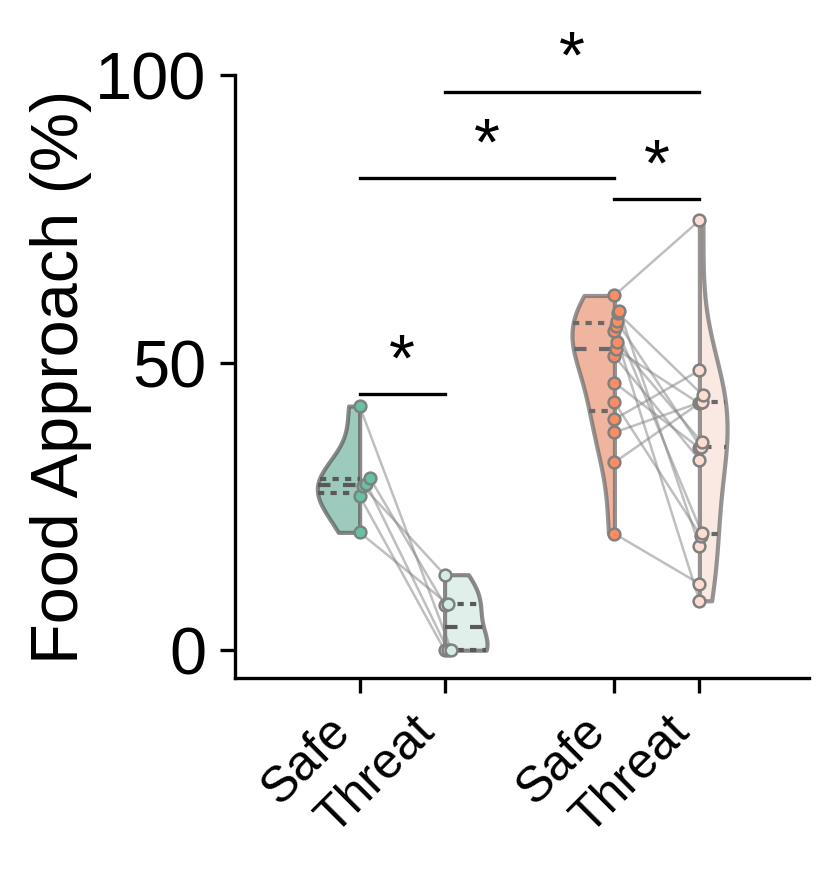

In [56]:
fig, axs = plt.subplots(figsize = (3, 3), dpi=300)
split_violin_with_dots_lines_multicluster(axs, safe_food_area, threat_food_area, 'Safe', 'Threat',title_splitviolin, y_label_food, ylim_food, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_cluster_approach_catodor.svg")

                     Mixed Linear Model Regression Results
Model:                    MixedLM         Dependent Variable:         Data     
No. Observations:         42              Method:                     REML     
No. Groups:               21              Scale:                      113.7266 
Min. group size:          2               Log-Likelihood:             -169.3445
Max. group size:          2               Converged:                  Yes      
Mean group size:          2.0                                                  
-------------------------------------------------------------------------------
                                  Coef.  Std.Err.   z    P>|z|  [0.025   0.975]
-------------------------------------------------------------------------------
Intercept                         87.500    5.004 17.487 0.000   77.693  97.307
Cluster[T.1]                       0.833    5.920  0.141 0.888  -10.770  12.437
Condition[T.Threat]              -87.500   11.640 -7.517 0.00

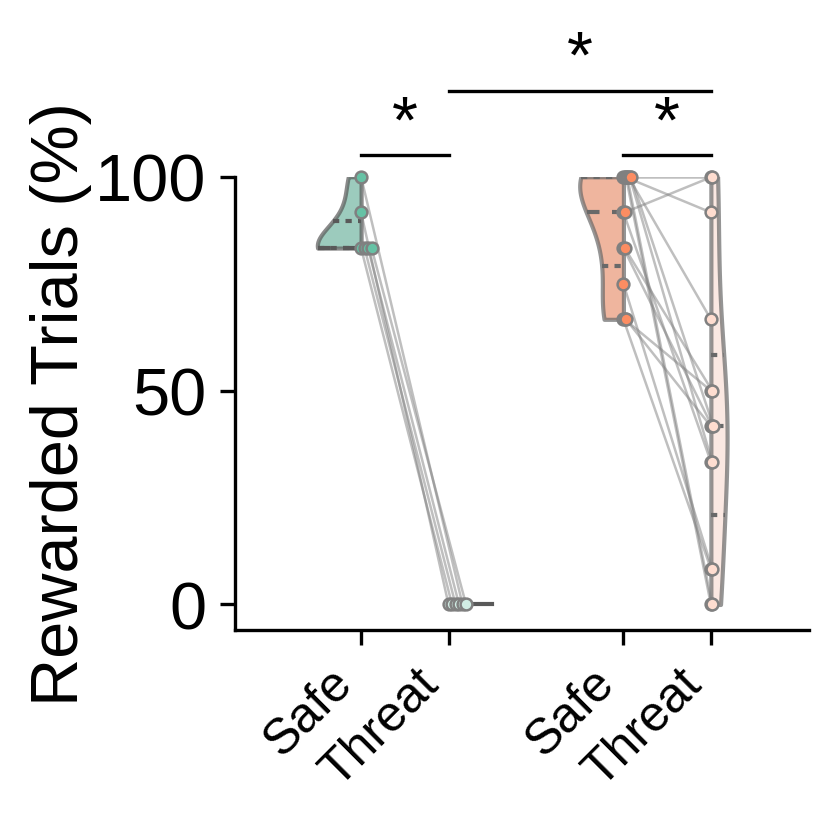

In [57]:
fig, axs = plt.subplots(figsize = (3, 3), dpi=300)
split_violin_with_dots_lines_multicluster(axs, safe_rewarded, threat_rewarded, 'Safe', 'Threat',title_splitviolin, y_label_rewarded, ylim_rewarded, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_cluster_reward_catodor.svg")

                   Mixed Linear Model Regression Results
Model:                   MixedLM        Dependent Variable:        Data    
No. Observations:        42             Method:                    REML    
No. Groups:              21             Scale:                     3.0247  
Min. group size:         2              Log-Likelihood:            -95.7072
Max. group size:         2              Converged:                 Yes     
Mean group size:         2.0                                               
---------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------------------
Intercept                         5.560    0.930  5.979 0.000  3.737  7.382
Cluster[T.1]                     -0.302    1.100 -0.275 0.783 -2.459  1.854
Condition[T.Threat]               9.440    1.351  6.986 0.000  6.792 12.089
Cluster[T.1]:Condition[T.Threat

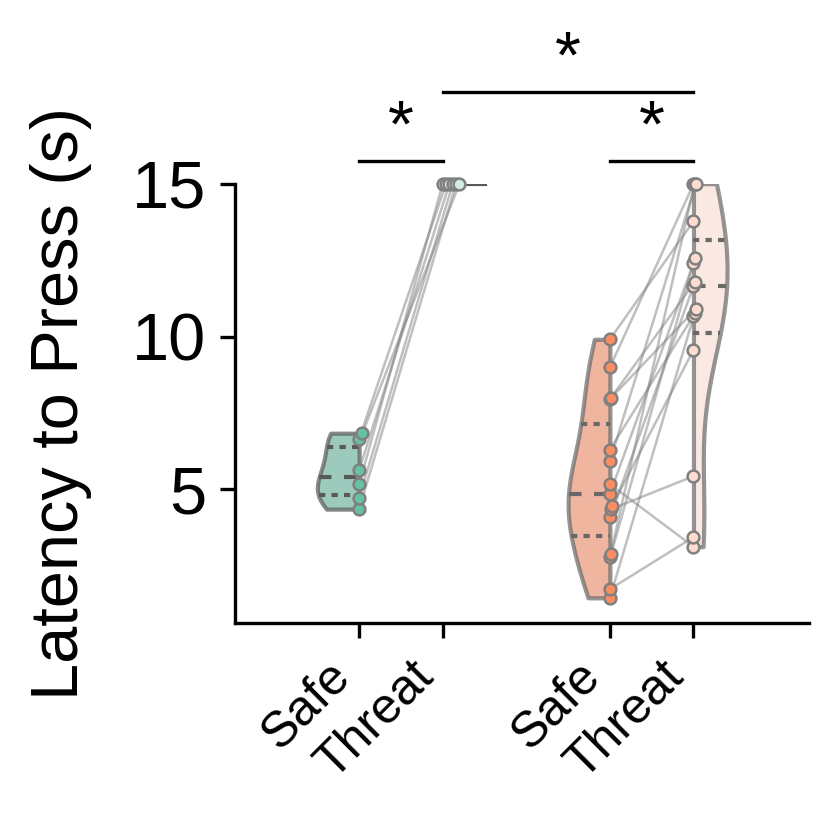

In [58]:
fig, axs = plt.subplots(figsize = (3,3), dpi=300)
split_violin_with_dots_lines_multicluster(axs, safe_latency, threat_latency, 'Safe', 'Threat',title_splitviolin, y_label_latency, ylim_latency, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_cluster_latency_satiation.svg")

/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


                    Mixed Linear Model Regression Results
Model:                     MixedLM        Dependent Variable:        Data     
No. Observations:          42             Method:                    REML     
No. Groups:                21             Scale:                     83.1585  
Min. group size:           2              Log-Likelihood:            -157.2277
Max. group size:           2              Converged:                 Yes      
Mean group size:           2.0                                                
------------------------------------------------------------------------------
                                  Coef.  Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------------------
Intercept                         21.142    3.738  5.656 0.000  13.816  28.469
Cluster[T.1]                      -5.451    4.423 -1.232 0.218 -14.121   3.218
Condition[T.Threat]               70.436    8.886  7.926 0.000  53.019  8

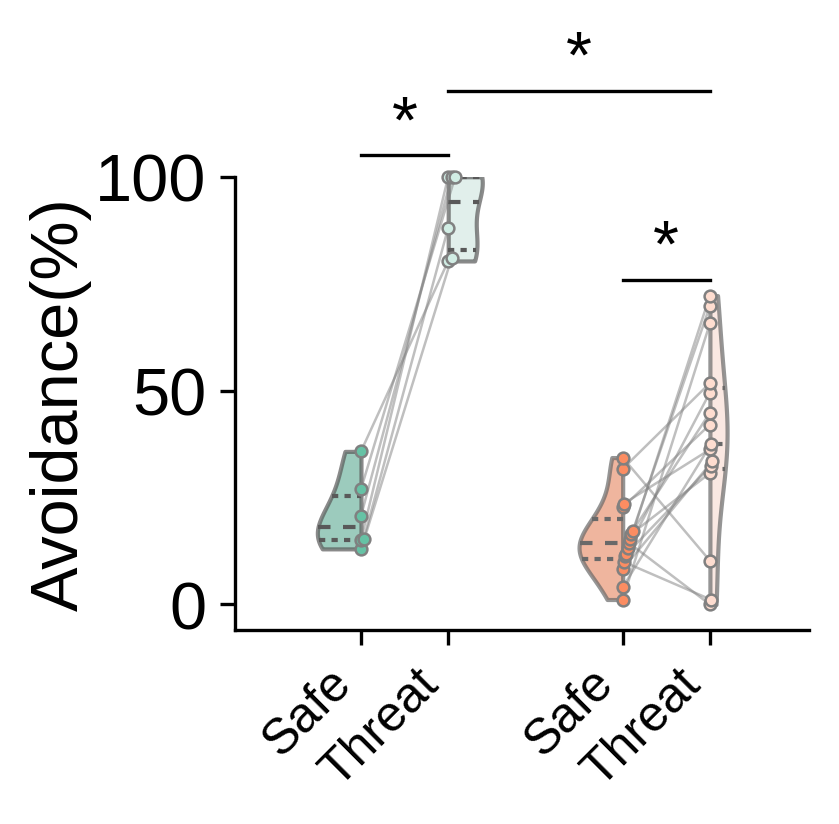

In [59]:
fig, axs = plt.subplots(figsize = (3, 3), dpi=300)
split_violin_with_dots_lines_multicluster(axs, safe_hidden_area, threat_hidden_area, 'Safe', 'Threat',title_splitviolin, y_label_hidden, ylim_hidden, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_cluster_avoidance_catodor.svg")

                    Mixed Linear Model Regression Results
Model:                    MixedLM        Dependent Variable:        Data     
No. Observations:         42             Method:                    REML     
No. Groups:               21             Scale:                     18.5301  
Min. group size:          2              Log-Likelihood:            -133.1568
Max. group size:          2              Converged:                 Yes      
Mean group size:          2.0                                                
-----------------------------------------------------------------------------
                                  Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
-----------------------------------------------------------------------------
Intercept                          2.678    2.415  1.109 0.268  -2.056  7.412
Cluster[T.1]                       1.237    2.858  0.433 0.665  -4.364  6.839
Condition[T.Threat]               19.694    3.588  5.489 0.000  12.661 26.726
Cluste

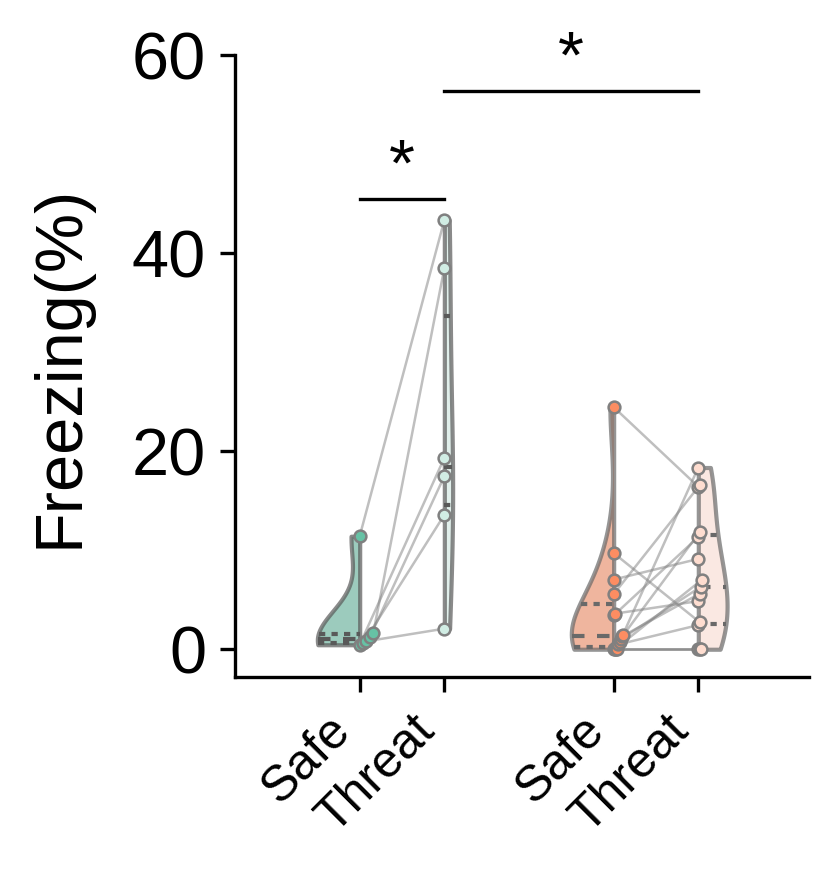

In [60]:
fig, axs = plt.subplots(figsize = (3,3 ), dpi=300)
split_violin_with_dots_lines_multicluster(axs, safe_freezing, threat_freezing, 'Safe', 'Threat',title_splitviolin, y_label_freezing, ylim_freezing, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_cluster_freezing_catodor.svg")

                   Mixed Linear Model Regression Results
Model:                   MixedLM        Dependent Variable:        Data    
No. Observations:        42             Method:                    REML    
No. Groups:              21             Scale:                     0.4325  
Min. group size:         2              Log-Likelihood:            -55.9488
Max. group size:         2              Converged:                 Yes     
Mean group size:         2.0                                               
---------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------------------
Intercept                         3.667    0.394  9.311 0.000  2.895  4.439
Cluster[T.1]                      0.176    0.466  0.378 0.706 -0.737  1.089
Condition[T.Threat]              -2.969    0.439 -6.766 0.000 -3.829 -2.109
Cluster[T.1]:Condition[T.Threat

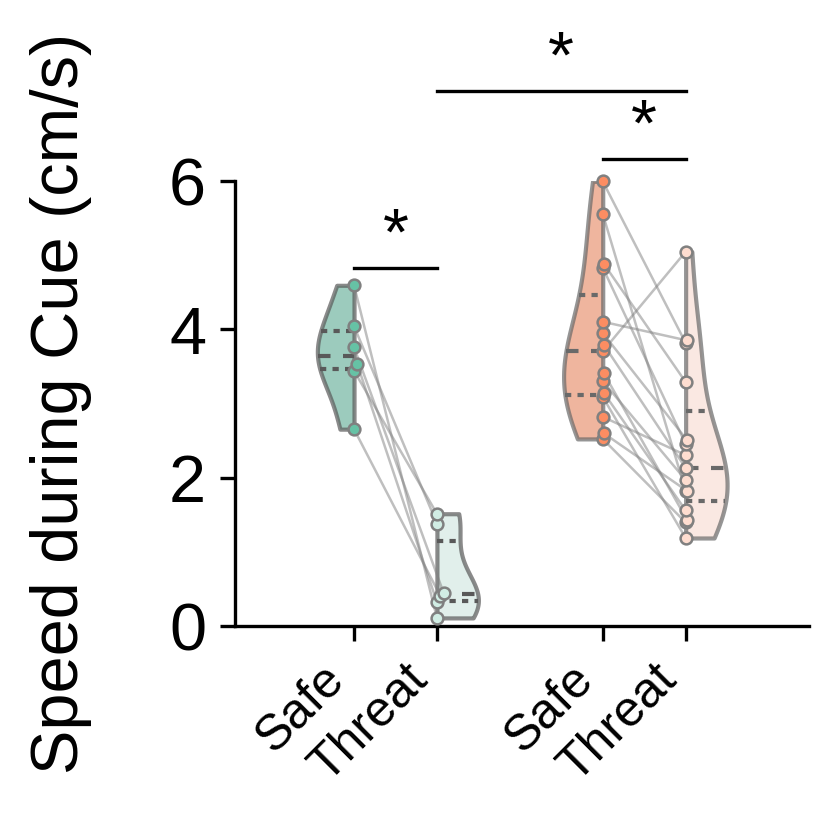

In [61]:
fig, axs = plt.subplots(figsize = (3, 3), dpi=300)
split_violin_with_dots_lines_multicluster(axs, safe_speed, threat_speed, 'Safe', 'Threat',title_splitviolin, y_label_speed, ylim_speed, label = False)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_cluster_speed_catodor.svg")

In [62]:
safe_latency['Data_scaled'] = safe_latency['Data']*100/15
threat_latency['Data_scaled'] = threat_latency['Data']*100/15
safe_speed['Data_scaled'] = safe_speed['Data']*100/6
threat_speed['Data_scaled'] = threat_speed['Data']*100/6

In [63]:
import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.io as pio
from numpy import pi, sin, cos

pio.renderers.default = 'notebook'
image_dir = './image'

hex_color = sns.color_palette('Set2', 2)[0]
rgb_color = np.array(to_rgb(hex_color))

# Convert to (0-255) RGB format and round the values
rgb_255_format = np.round(rgb_color * 255).astype(int)

modified_rgb = (0.7+ 0.3*rgb_color)
rgb_255_format_modified = np.round(modified_rgb * 255).astype(int)

categories = ['Food Approach','Rewarded Trials','Latency to Press','Avoidance', 'Freezing',
              'Speed during Cue']

num_categories = len(categories)

full_safe = [safe_food_area[safe_food_area.Cluster =='0'].Data.mean(),
               safe_rewarded[safe_rewarded.Cluster =='0'].Data.mean(),
               safe_latency[safe_latency.Cluster == '0'].Data_scaled.mean(),
             safe_hidden_area[safe_hidden_area.Cluster == '0'].Data.mean(),
             safe_freezing[safe_freezing.Cluster == '0'].Data.mean(),
               safe_speed[safe_speed.Cluster == '0'].Data_scaled.mean()]
full_threat = [threat_food_area[threat_food_area.Cluster =='0'].Data.mean(),
               threat_rewarded[threat_rewarded.Cluster =='0'].Data.mean(),
               threat_latency[threat_latency.Cluster == '0'].Data_scaled.mean(),
               threat_hidden_area[threat_hidden_area.Cluster == '0'].Data.mean(),
             threat_freezing[threat_freezing.Cluster == '0'].Data.mean(),
               threat_speed[threat_speed.Cluster == '0'].Data_scaled.mean()]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=full_safe, theta=categories, fill='toself', name='Safe', 
            line=dict(color=f'rgb({rgb_255_format[0]}, {rgb_255_format[1]}, {rgb_255_format[2]})'),  
            fillcolor= f'rgba({rgb_255_format[0]}, {rgb_255_format[1]}, {rgb_255_format[2]}, 0.7)'),
        go.Scatterpolar(r=full_threat, theta=categories, fill='toself', name='Threat',
            line=dict(color=f'rgb({rgb_255_format_modified[0]}, {rgb_255_format_modified[1]}, {rgb_255_format_modified[2]})'),  
            fillcolor= f'rgba({rgb_255_format_modified[0]}, {rgb_255_format_modified[1]}, {rgb_255_format_modified[2]}, 0.8)'),
    ],
    layout=go.Layout(
        font_family='Arial',
        font_color="black",
        title=go.layout.Title(text='Fully Suppressed', x=0.5, y=1, font= dict(size=36), pad = dict(b=50, t = 10)),
        polar={'radialaxis': {'visible': True, 'showticklabels': False, 'showline': False, 'dtick': 20},
              'angularaxis': dict(tickfont=dict(size=24), showticklabels=False),
              'bgcolor': 'lightgrey'},
        showlegend=True,
        legend=dict(x=0.9, y=1.2, font=dict(size=26))
    )
)

fig.update_layout(
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
)


num_categories = len(categories)
angles_deg = np.linspace(0, 360, num_categories, endpoint=False)  # Evenly spaced angles in degrees
angles_rad = np.deg2rad(angles_deg)  # Convert angles to radians

# Assuming the plot is centered at (0.5, 0.5) in 'paper' coordinates
label_positions = [(0.5 + 0.45 * np.cos(angle), 0.5 + 0.6 * np.sin(angle)) for angle in angles_rad]

def calculate_label_angles(label_positions):
    angles = []
    for pos in label_positions:
        # Calculate the angle from the center (0.5, 0.5) to the label position
        angle = np.arctan2((pos[1] - 0.5), (pos[0] - 0.5))
        
        # Convert to degrees and offset by 90 degrees to make the text tangential
        angle_degrees = -np.degrees(angle) + 90
        
        # Ensure the angle is within the range [-180, 180]
        if angle_degrees < -180:
            angle_degrees += 360
        elif angle_degrees > 180:
            angle_degrees -= 360
            
        # Adjust the angle for labels on the bottom half of the circle
        if angle_degrees > 90 or angle_degrees < -90:
            # If label is on the bottom half, rotate additional 180 degrees to flip
            angle_degrees += 180
        
            
        angles.append(angle_degrees)
    
    return angles

adjusted_angles = calculate_label_angles(label_positions)

for i, label in enumerate(label_positions):
    # This part is a bit tricky; you need to adjust the position to match where your labels should be
    x,y = label_positions[i]

    
    fig.add_annotation(
        go.layout.Annotation(
            text=categories[i],
            x=x,
            y=y,
            xref="paper",
            yref="paper",
            showarrow=False,
            font=dict(size=30),
            textangle=adjusted_angles[i],
            xanchor="center",
            yanchor="middle"
        )
    )
    
pyo.plot(fig)
fig.show()

pio.write_image(fig, os.path.join(image_dir,'fully_supressed_cat_odor.svg'), scale=2, engine="kaleido")  # Adjust width, height, and scale as needed


In [64]:
hex_color = sns.color_palette('Set2', 2)[1]
rgb_color = np.array(to_rgb(hex_color))

# Convert to (0-255) RGB format and round the values
rgb_255_format = np.round(rgb_color * 255).astype(int)

modified_rgb = (0.7+ 0.3*rgb_color)
rgb_255_format_modified = np.round(modified_rgb * 255).astype(int)

categories = ['Food Approach','Rewarded Trials','Latency to Press','Avoidance', 'Freezing',
              'Speed during Cue']

num_categories = len(categories)

full_safe = [safe_food_area[safe_food_area.Cluster =='1'].Data.mean(),
               safe_rewarded[safe_rewarded.Cluster =='1'].Data.mean(),
               safe_latency[safe_latency.Cluster == '1'].Data_scaled.mean(),
             safe_hidden_area[safe_hidden_area.Cluster == '1'].Data.mean(),
             safe_freezing[safe_freezing.Cluster == '1'].Data.mean(),
               safe_speed[safe_speed.Cluster == '1'].Data_scaled.mean()]
full_threat = [threat_food_area[threat_food_area.Cluster =='1'].Data.mean(),
               threat_rewarded[threat_rewarded.Cluster =='1'].Data.mean(),
               threat_latency[threat_latency.Cluster == '1'].Data_scaled.mean(),
               threat_hidden_area[threat_hidden_area.Cluster == '1'].Data.mean(),
             threat_freezing[threat_freezing.Cluster == '1'].Data.mean(),
               threat_speed[threat_speed.Cluster == '1'].Data_scaled.mean()]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=full_safe, theta=categories, fill='toself', name='Safe', 
            line=dict(color=f'rgb({rgb_255_format[0]}, {rgb_255_format[1]}, {rgb_255_format[2]})'),  
            fillcolor= f'rgba({rgb_255_format[0]}, {rgb_255_format[1]}, {rgb_255_format[2]}, 0.7)'),
        go.Scatterpolar(r=full_threat, theta=categories, fill='toself', name='Threat',
            line=dict(color=f'rgb({rgb_255_format_modified[0]}, {rgb_255_format_modified[1]}, {rgb_255_format_modified[2]})'),  
            fillcolor= f'rgba({rgb_255_format_modified[0]}, {rgb_255_format_modified[1]}, {rgb_255_format_modified[2]}, 0.8)'),
    ],
    layout=go.Layout(
        font_family='Arial',
        font_color="black",
        title=go.layout.Title(text='Persistent Feeders', x=0.5, y = 1, font= dict(size=36), pad = dict(b=50, t = 10)),
        polar={'radialaxis': {'visible': True, 'showticklabels': False, 'showline': False, 'dtick': 20},
              'angularaxis': dict(tickfont=dict(size=26), showticklabels=False),
              'bgcolor': 'lightgrey'},
        showlegend=True,
        legend=dict(x=0.9, y=1.2, font=dict(size=26))
    )
)

fig.update_layout(
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
)


num_categories = len(categories)
angles_deg = np.linspace(0, 360, num_categories, endpoint=False)  # Evenly spaced angles in degrees
angles_rad = np.deg2rad(angles_deg)  # Convert angles to radians

# Assuming the plot is centered at (0.5, 0.5) in 'paper' coordinates
label_positions = [(0.5 + 0.45 * np.cos(angle), 0.5 + 0.6 * np.sin(angle)) for angle in angles_rad]

def calculate_label_angles(label_positions):
    angles = []
    for pos in label_positions:
        # Calculate the angle from the center (0.5, 0.5) to the label position
        angle = np.arctan2((pos[1] - 0.5), (pos[0] - 0.5))
        
        # Convert to degrees and offset by 90 degrees to make the text tangential
        angle_degrees = -np.degrees(angle) + 90

        # Ensure the angle is within the range [-180, 180]
        if angle_degrees < -180:
            angle_degrees += 360
        elif angle_degrees > 180:
            angle_degrees -= 360
            
        # Adjust the angle for labels on the bottom half of the circle
        if angle_degrees > 90 or angle_degrees < -90:
            # If label is on the bottom half, rotate additional 180 degrees to flip
            angle_degrees += 180
        

            
        angles.append(angle_degrees)
    
    return angles

adjusted_angles = calculate_label_angles(label_positions)

for i, label in enumerate(label_positions):
    # This part is a bit tricky; you need to adjust the position to match where your labels should be
    x,y = label_positions[i]

    
    fig.add_annotation(
        go.layout.Annotation(
            text=categories[i],
            x=x,
            y=y,
            xref="paper",
            yref="paper",
            showarrow=False,
            font=dict(size=30),
            textangle=adjusted_angles[i],
            xanchor="center",
            yanchor="middle"
        )
    )
    
pyo.plot(fig)
fig.show()

pio.write_image(fig, os.path.join(image_dir,'persistent_feeder_cat_odor.svg'), scale=2, engine="kaleido")  # Adjust width, height, and scale as needed


In [66]:

pio.renderers.default = 'notebook'
image_dir = './image'

hex_color = sns.color_palette('gist_stern', 2)
# rgb_color = np.array(to_rgb(hex_color))

# # Convert to (0-255) RGB format and round the values
rgb_255_format = np.round(np.array(to_rgb(hex_color[0])) * 255).astype(int)

# modified_rgb = (0.7+ 0.3*rgb_color)
rgb_255_format_modified = np.round(np.array(to_rgb(hex_color[1])) * 255).astype(int)


categories = ['Food Approach','Rewarded Trials','Latency to Press','Avoidance', 'Freezing',
              'Speed during Cue']


num_categories = len(categories)

full_safe = [safe_food_area[safe_food_area.Sex =='F'].Data.mean(),
               safe_rewarded[safe_rewarded.Sex =='F'].Data.mean(),
               safe_latency[safe_latency.Sex =='F'].Data_scaled.mean(),
                safe_hidden_area[safe_hidden_area.Sex =='F'].Data.mean(),
             safe_freezing[safe_freezing.Sex =='F'].Data.mean(),
               safe_speed[safe_speed.Sex =='F'].Data_scaled.mean()]
full_threat = [safe_food_area[threat_food_area.Sex =='M'].Data.mean(),
               safe_rewarded[threat_rewarded.Sex =='M'].Data.mean(),
               safe_latency[threat_latency.Sex =='M'].Data_scaled.mean(),
            safe_hidden_area[safe_hidden_area.Sex =='M'].Data.mean(),
             safe_freezing[safe_freezing.Sex =='F'].Data.mean(),
               safe_speed[threat_speed.Sex =='M'].Data_scaled.mean()]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=full_safe, theta=categories, fill='toself', name='Female', 
            line=dict(color=f'rgb({rgb_255_format[0]}, {rgb_255_format[1]}, {rgb_255_format[2]})'),  
            fillcolor= f'rgba({rgb_255_format[0]}, {rgb_255_format[1]}, {rgb_255_format[2]}, 0.7)'),
        go.Scatterpolar(r=full_threat, theta=categories, fill='toself', name='Male',
            line=dict(color=f'rgb({rgb_255_format_modified[0]}, {rgb_255_format_modified[1]}, {rgb_255_format_modified[2]})'),  
            fillcolor= f'rgba({rgb_255_format_modified[0]}, {rgb_255_format_modified[1]}, {rgb_255_format_modified[2]}, 0.5)'),
    ],
    layout=go.Layout(
        font_family='Arial',
        font_color="black",
        title=go.layout.Title(text='Safe', x=0.5, y=1, font= dict(size=36), pad = dict(b=50, t = 10)),
        polar={'radialaxis': {'visible': True, 'showticklabels': False, 'showline': False, 'dtick': 20},
              'angularaxis': dict(tickfont=dict(size=24), showticklabels=False),
              'bgcolor': 'lightgrey'},
        showlegend=True,
        legend=dict(x=0.9, y=1.2, font=dict(size=26))
    )
)

fig.update_layout(
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
)


num_categories = len(categories)
angles_deg = np.linspace(0, 360, num_categories, endpoint=False)  # Evenly spaced angles in degrees
angles_rad = np.deg2rad(angles_deg)  # Convert angles to radians

# Assuming the plot is centered at (0.5, 0.5) in 'paper' coordinates
label_positions = [(0.5 + 0.45 * np.cos(angle), 0.5 + 0.6 * np.sin(angle)) for angle in angles_rad]

def calculate_label_angles(label_positions):
    angles = []
    for pos in label_positions:
        # Calculate the angle from the center (0.5, 0.5) to the label position
        angle = np.arctan2((pos[1] - 0.5), (pos[0] - 0.5))
        
        # Convert to degrees and offset by 90 degrees to make the text tangential
        angle_degrees = -np.degrees(angle) + 90
        
        # Ensure the angle is within the range [-180, 180]
        if angle_degrees < -180:
            angle_degrees += 360
        elif angle_degrees > 180:
            angle_degrees -= 360
            
        # Adjust the angle for labels on the bottom half of the circle
        if angle_degrees > 90 or angle_degrees < -90:
            # If label is on the bottom half, rotate additional 180 degrees to flip
            angle_degrees += 180
        
            
        angles.append(angle_degrees)
    
    return angles

adjusted_angles = calculate_label_angles(label_positions)

for i, label in enumerate(label_positions):
    # This part is a bit tricky; you need to adjust the position to match where your labels should be
    x,y = label_positions[i]

    
    fig.add_annotation(
        go.layout.Annotation(
            text=categories[i],
            x=x,
            y=y,
            xref="paper",
            yref="paper",
            showarrow=False,
            font=dict(size=30),
            textangle=adjusted_angles[i],
            xanchor="center",
            yanchor="middle"
        )
    )
    
pyo.plot(fig)
fig.show()

pio.write_image(fig, os.path.join(image_dir,'safe_sex_catodor.svg'), scale=2, engine="kaleido")  # Adjust width, height, and scale as needed


In [67]:


pio.renderers.default = 'notebook'
image_dir = './image'

hex_color = sns.color_palette('gist_stern', 2)
# rgb_color = np.array(to_rgb(hex_color))

# # Convert to (0-255) RGB format and round the values
rgb_255_format = np.round(np.array(to_rgb(hex_color[0])) * 255).astype(int)

# modified_rgb = (0.7+ 0.3*rgb_color)
rgb_255_format_modified = np.round(np.array(to_rgb(hex_color[1])) * 255).astype(int)


categories = ['Food Approach','Rewarded Trials','Latency to Press','Avoidance', 'Freezing',
              'Speed during Cue']


num_categories = len(categories)

full_safe = [threat_food_area[threat_food_area.Sex =='F'].Data.mean(),
               threat_rewarded[threat_rewarded.Sex =='F'].Data.mean(),
               threat_latency[threat_latency.Sex =='F'].Data_scaled.mean(),
                threat_hidden_area[threat_hidden_area.Sex =='F'].Data.mean(),
             threat_freezing[threat_freezing.Sex =='F'].Data.mean(),
               threat_speed[threat_speed.Sex =='F'].Data_scaled.mean()]
full_threat = [threat_food_area[threat_food_area.Sex =='M'].Data.mean(),
               threat_rewarded[threat_rewarded.Sex =='M'].Data.mean(),
               threat_latency[threat_latency.Sex =='M'].Data_scaled.mean(),
            threat_hidden_area[threat_hidden_area.Sex =='M'].Data.mean(),
             threat_freezing[threat_freezing.Sex =='F'].Data.mean(),
               threat_speed[threat_speed.Sex =='M'].Data_scaled.mean()]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=full_safe, theta=categories, fill='toself', name='Female', 
            line=dict(color=f'rgb({rgb_255_format[0]}, {rgb_255_format[1]}, {rgb_255_format[2]})'),  
            fillcolor= f'rgba({rgb_255_format[0]}, {rgb_255_format[1]}, {rgb_255_format[2]}, 0.7)'),
        go.Scatterpolar(r=full_threat, theta=categories, fill='toself', name='Male',
            line=dict(color=f'rgb({rgb_255_format_modified[0]}, {rgb_255_format_modified[1]}, {rgb_255_format_modified[2]})'),  
            fillcolor= f'rgba({rgb_255_format_modified[0]}, {rgb_255_format_modified[1]}, {rgb_255_format_modified[2]}, 0.5)'),
    ],
    layout=go.Layout(
        font_family='Arial',
        font_color="black",
        title=go.layout.Title(text='Threat', x=0.5, y=1, font= dict(size=36), pad = dict(b=50, t = 10)),
        polar={'radialaxis': {'visible': True, 'showticklabels': False, 'showline': False, 'dtick': 20},
              'angularaxis': dict(tickfont=dict(size=24), showticklabels=False),
              'bgcolor': 'lightgrey'},
        showlegend=True,
        legend=dict(x=0.9, y=1.2, font=dict(size=26))
    )
)

fig.update_layout(
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
)


num_categories = len(categories)
angles_deg = np.linspace(0, 360, num_categories, endpoint=False)  # Evenly spaced angles in degrees
angles_rad = np.deg2rad(angles_deg)  # Convert angles to radians

# Assuming the plot is centered at (0.5, 0.5) in 'paper' coordinates
label_positions = [(0.5 + 0.45 * np.cos(angle), 0.5 + 0.6 * np.sin(angle)) for angle in angles_rad]

def calculate_label_angles(label_positions):
    angles = []
    for pos in label_positions:
        # Calculate the angle from the center (0.5, 0.5) to the label position
        angle = np.arctan2((pos[1] - 0.5), (pos[0] - 0.5))
        
        # Convert to degrees and offset by 90 degrees to make the text tangential
        angle_degrees = -np.degrees(angle) + 90
        
        # Ensure the angle is within the range [-180, 180]
        if angle_degrees < -180:
            angle_degrees += 360
        elif angle_degrees > 180:
            angle_degrees -= 360
            
        # Adjust the angle for labels on the bottom half of the circle
        if angle_degrees > 90 or angle_degrees < -90:
            # If label is on the bottom half, rotate additional 180 degrees to flip
            angle_degrees += 180
        
            
        angles.append(angle_degrees)
    
    return angles

adjusted_angles = calculate_label_angles(label_positions)

for i, label in enumerate(label_positions):
    # This part is a bit tricky; you need to adjust the position to match where your labels should be
    x,y = label_positions[i]

    
    fig.add_annotation(
        go.layout.Annotation(
            text=categories[i],
            x=x,
            y=y,
            xref="paper",
            yref="paper",
            showarrow=False,
            font=dict(size=30),
            textangle=adjusted_angles[i],
            xanchor="center",
            yanchor="middle"
        )
    )
    
pyo.plot(fig)
fig.show()

pio.write_image(fig, os.path.join(image_dir,'threat_sex_catodor.svg'), scale=2, engine="kaleido")  # Adjust width, height, and scale as needed


In [137]:
def calculate_label_angles(label_positions):
    angles = []
    for pos in label_positions:
        # Calculate the angle from the center (0.5, 0.5) to the label position
        angle = np.arctan2((pos[1] - 0.5), (pos[0] - 0.5))
        
        # Convert to degrees and offset by 90 degrees to make the text tangential
        angle_degrees = -np.degrees(angle) + 90
        
        # Ensure the angle is within the range [-180, 180]
        if angle_degrees < -180:
            angle_degrees += 360
        elif angle_degrees > 180:
            angle_degrees -= 360
            
        angles.append(angle_degrees)
    
    return angles
adjusted_angles = calculate_label_angles(label_positions)
adjusted_angles

[90.0,
 20.173570184167716,
 -20.173570184167716,
 -90.0,
 -159.82642981583226,
 159.82642981583228]

In [82]:
num_categories = len(categories)
angles_deg = np.linspace(0, 360, num_categories, endpoint=False)  # Evenly spaced angles in degrees
angles_rad = np.deg2rad(angles_deg)  # Convert angles to radians

# Assuming the plot is centered at (0.5, 0.5) in 'paper' coordinates
label_positions = [(0.5 + 0.35 * np.cos(angle), 0.5 + 0.55 * np.sin(angle)) for angle in angles_rad]

# text_angle = [-180*np.arctan((yt[k]-0.5)/(xt[k]-0.5))/pi for k in range(len(t))]

In [109]:
label_positions

[(0.85, 0.5),
 (0.675, 0.9763139720814413),
 (0.32500000000000007, 0.9763139720814413),
 (0.15000000000000002, 0.5000000000000001),
 (0.32499999999999984, 0.02368602791855884),
 (0.675, 0.023686027918558727)]

                    Mixed Linear Model Regression Results
Model:                     MixedLM        Dependent Variable:        Data     
No. Observations:          42             Method:                    REML     
No. Groups:                21             Scale:                     59.9995  
Min. group size:           2              Log-Likelihood:            -142.5419
Max. group size:           2              Converged:                 Yes      
Mean group size:           2.0                                                
------------------------------------------------------------------------------
                                  Coef.  Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------------------
Intercept                         49.299    3.115 15.826 0.000  43.194  55.405
Cluster[T.1]                     -19.766    5.396 -3.663 0.000 -30.341  -9.191
Cluster[T.2]                      -4.469    6.966 -0.642 0.521 -18.121   

/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


                    Mixed Linear Model Regression Results
Model:                     MixedLM        Dependent Variable:        Data     
No. Observations:          42             Method:                    REML     
No. Groups:                21             Scale:                     77.9571  
Min. group size:           2              Log-Likelihood:            -147.2509
Max. group size:           2              Converged:                 Yes      
Mean group size:           2.0                                                
------------------------------------------------------------------------------
                                  Coef.  Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------------------
Intercept                         13.957    2.549  5.476 0.000   8.961  18.953
Cluster[T.1]                       7.185    4.415  1.627 0.104  -1.468  15.838
Cluster[T.2]                       8.669    5.700  1.521 0.128  -2.502  1

/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/statsmodels/stats/multitest.py:164: RuntimeWarning: divide by zero encountered in log1p
  pvals_corrected = -np.expm1(ntests * np.log1p(-pvals))


                   Mixed Linear Model Regression Results
Model:                   MixedLM        Dependent Variable:        Data    
No. Observations:        42             Method:                    REML    
No. Groups:              21             Scale:                     2.0465  
Min. group size:         2              Log-Likelihood:            -78.1683
Max. group size:         2              Converged:                 Yes     
Mean group size:         2.0                                               
---------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------------------
Intercept                         5.633    0.646  8.722 0.000  4.367  6.899
Cluster[T.1]                     -0.073    1.119 -0.065 0.948 -2.266  2.119
Cluster[T.2]                     -1.878    1.444 -1.300 0.193 -4.708  0.952
Condition[T.Threat]            

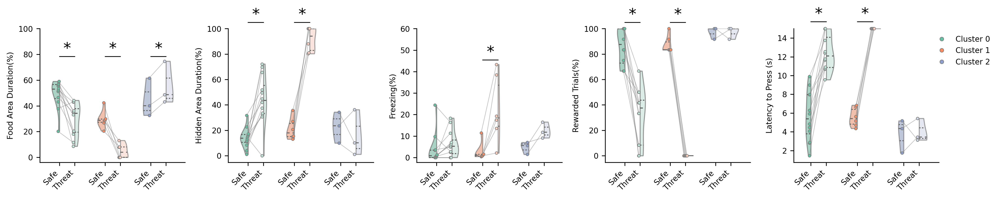

In [115]:
safe_food_area = behavior_results_sex['safe_food_area'].assign(Cluster=cluster_data_meanshift.Cluster.values)
threat_food_area = behavior_results_sex['threat_food_area'].assign(Cluster=cluster_data_meanshift.Cluster.values)
safe_hidden_area = behavior_results_sex['safe_hidden_area'].assign(Cluster=cluster_data_meanshift.Cluster.values)
threat_hidden_area = behavior_results_sex['threat_hidden_area'].assign(Cluster=cluster_data_meanshift.Cluster.values)
safe_freezing = behavior_results_sex['safe_freezing'].assign(Cluster=cluster_data_meanshift.Cluster.values)
threat_freezing = behavior_results_sex['threat_freezing'].assign(Cluster=cluster_data_meanshift.Cluster.values)
safe_rewarded = behavior_results_sex['safe_rewarded'].assign(Cluster=cluster_data_meanshift.Cluster.values).copy()
threat_rewarded = behavior_results_sex['threat_rewarded'].assign(Cluster=cluster_data_meanshift.Cluster.values).copy()
safe_rewarded['Data'] = pd.DataFrame(behavior_results_sex['safe_rewarded'].iloc[:,1:-1].mean(axis =1)*100)
threat_rewarded['Data'] = pd.DataFrame(behavior_results_sex['threat_rewarded'].iloc[:,1:-1].mean(axis =1)*100)
safe_latency = behavior_results_sex['safe_latency'].assign(Cluster=cluster_data_meanshift.Cluster.values).copy()
threat_latency  = behavior_results_sex['threat_latency'].assign(Cluster=cluster_data_meanshift.Cluster.values).copy()
safe_latency['Data'] = pd.DataFrame(behavior_results_sex['safe_latency'].iloc[:,1:-1].mean(axis =1))
threat_latency['Data'] = pd.DataFrame(behavior_results_sex['threat_latency'].iloc[:,1:-1].mean(axis =1))
title_splitviolin = None
figsize = (14.5, 3) 

y_label_food = 'Food Area Duration(%)'
y_label_hidden = 'Hidden Area Duration(%)'
y_label_freezing = 'Freezing(%)'
y_label_rewarded = 'Rewarded Trials(%)'
y_label_latency = 'Latency to Press (s)'
ylim_food = (None, 100)
ylim_hidden = (None, 100)
ylim_freezing = (None, 60)
ylim_rewarded = (None, 100)
ylim_latency = (None, 15)

fig, axs = plt.subplots(1, 5, figsize=figsize, dpi=300)


split_violin_with_dots_lines_multicluster(axs[0], safe_food_area, threat_food_area, 'Safe', 'Threat',title_splitviolin, y_label_food, ylim_food, label = False)
split_violin_with_dots_lines_multicluster(axs[1], safe_hidden_area, threat_hidden_area, 'Safe', 'Threat',title_splitviolin, y_label_hidden, ylim_hidden, label = False)
split_violin_with_dots_lines_multicluster(axs[2], safe_freezing, threat_freezing, 'Safe', 'Threat',title_splitviolin, y_label_freezing, ylim_freezing, label = False)
split_violin_with_dots_lines_multicluster(axs[3], safe_rewarded, threat_rewarded, 'Safe', 'Threat',title_splitviolin, y_label_rewarded, ylim_rewarded, label = False)
split_violin_with_dots_lines_multicluster(axs[4], safe_latency, threat_latency, 'Safe', 'Threat',title_splitviolin, y_label_latency, ylim_latency, label = True)

plt.tight_layout()
plt.show()

In [125]:
cat_odor_conflict_behavior_cluster  = safe_food_area[['animal_id', 'Sex', ]].assign(Cluster_Kmeans=cluster_data_kmeans.Cluster.values)
cat_odor_conflict_behavior_cluster.to_csv("cat_odor_conflict_behavior_cluster.csv")

In [5]:
satiation_clusters = pd.read_csv("/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Behavior/satiated_behavior_cluster.csv", index_col= 0)
columns = ['Animal_ID', 'Sex', 'Cluster_Kmeans']
satiation_clusters.columns = columns
satiation_clusters

,Animal_ID,Sex,Cluster_Kmeans
0,9M6,F,0
1,7H6,F,1
2,2N6,M,1
3,6H6,F,0
4,2I5,M,0
5,8H6,F,1
6,1H6,F,0
7,6S5,M,1
8,8S5,M,0
9,7M6,F,1


In [103]:
import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.io as pio

# Load the datasets
catodor = pd.read_csv("/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Behavior/cat_odor_conflict_behavior_cluster.csv")
satiation = pd.read_csv("/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Behavior/satiated_behavior_cluster.csv")

# Merge the datasets on 'animal_id'
merged_data = pd.merge(catodor[['animal_id', 'Cluster_Kmeans']], satiation[['animal_id', 'Cluster_Kmeans']], on='animal_id', suffixes=('_catodor', '_satiation'))

# Prepare for Sankey diagram
# Create a list of labels for nodes
label_list = [
    'Satiation Cluster 0', 'Satiation Cluster 1',
    'Catodor Cluster 0', 'Catodor Cluster 1'
]

# Create source and target indices
# Assuming Cluster_Kmeans are 0 or 1, reverse the order by making satiation the source
source_indices = merged_data['Cluster_Kmeans_satiation'].apply(lambda x: x).tolist()
target_indices = merged_data['Cluster_Kmeans_catodor'].apply(lambda x: x + 2).tolist()  # +2 to move to catodor indices

# Calculate the flow values (here we just count transitions)
transition_counts = merged_data.groupby(['Cluster_Kmeans_satiation', 'Cluster_Kmeans_catodor']).size().reset_index(name='count')

# Create source, target, and value lists for the Sankey diagram
sources = []
targets = []
values = []

for _, row in transition_counts.iterrows():
    sources.append(row['Cluster_Kmeans_satiation'])
    targets.append(row['Cluster_Kmeans_catodor'] + 2)  # +2 to adjust to catodor indices
    values.append(row['count'])


label_list = [f'{sum(transition_counts[transition_counts["Cluster_Kmeans_satiation"]==0]["count"].values)}',
              f'{sum(transition_counts[transition_counts["Cluster_Kmeans_satiation"]==1]["count"].values)}',
              f'{sum(transition_counts[transition_counts["Cluster_Kmeans_catodor"]==0]["count"].values)}',
              f'{sum(transition_counts[transition_counts["Cluster_Kmeans_catodor"]==1]["count"].values)}'
             ]

transition_counts

,Cluster_Kmeans_satiation,Cluster_Kmeans_catodor,count
0,0,0,4
1,0,1,5
2,1,0,2
3,1,1,6


In [150]:

# Generate a Seaborn color palette
palette = sns.color_palette('Set2', 2)  # 'Set2' palette with 2 distinct colors
hex_colors = [color for color in palette.as_hex()]  # Convert colors to hex format
gray_color = "#d3d3d3"  # Gray color for changing links

# Function to convert HEX to RGBA
def hex_to_rgba(hex, alpha=0.8):
    hex = hex.lstrip('#')
    hlen = len(hex)
    return f'rgba({int(hex[0:hlen//3], 16)}, {int(hex[hlen//3:2*hlen//3], 16)}, {int(hex[2*hlen//3:3*hlen//3], 16)}, {alpha})'

# Convert colors to RGBA with alpha = 0.6
rgba_colors = [hex_to_rgba(color) for color in hex_colors]
rgba_gray = hex_to_rgba(gray_color)

# Node and link colors (now using RGBA)
node_colors = [rgba_colors[x % 2] for x in range(4)]
link_colors = [node_colors[source] if source % 2 == target % 2 else rgba_gray for source, target in zip(sources, targets)]


# Plot the Sankey diagram with customized node and link colors
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=3,
        thickness=20,
        line=dict(color='black', width=0.5),
        label=label_list,  # Empty labels for each node
        color=node_colors,  # Seaborn colors for nodes    
        x=[0, 0, 1, 1],
    ),
    link=dict(
        source=sources,
        target=targets,
        value=values,
        color=link_colors  # Custom logic for link colors
    ))])

# Add annotations for clarity, if still desired
annotations = [
    dict(x=-0.05, y=-0.1, xref='paper', yref='paper', text='Satiation', showarrow=False, font=dict(size=16, color='black')),
    dict(x=1.03, y=-0.1, xref='paper', yref='paper', text='Threat', showarrow=False, font=dict(size=16, color='black')),
    dict(text='Suppressed Pressers', x=0.85, y=1.1, xref='paper', yref='paper', showarrow=False, font=dict(size=16, color=hex_colors[0])),
    dict(text='Persistent Pressers', x=0.85, y=1.05, xref='paper', yref='paper', showarrow=False, font=dict(size=16, color=hex_colors[1])),
    dict(text='0', x=-0.1, y=0, xref='paper', yref='paper', showarrow=False, font=dict(size=16, color='black')),
    dict(text='17', x=-0.1, y=1, xref='paper', yref='paper', showarrow=False, font=dict(size=16, color='black')),
    dict(text='Number of Animals', x=-0.15, y=0.5, xref='paper', yref='paper', textangle=-90, showarrow=False, font=dict(size=16, color='black')),
]

# Calculate y-coordinates for links and add annotations
total_value = sum(values)
cumulative_heights = 0
for source, target, value in zip(sources, targets, values):
    y_pos = cumulative_heights + value / 2 / total_value
    cumulative_heights += value / total_value
    annotations.append(
        dict(
            x=0.2,  # Fixed x position
            y=y_pos,  # Adjusted y position
            xref='paper',
            yref='paper',
            text=str(value),
            showarrow=False,
            font=dict(size=16, color='black')
        )
    )



fig.update_layout(
    annotations=annotations,
    plot_bgcolor='rgba(0,0,0,0)',  # Transparent background
    font=dict(size=16, color="black", family="Arial"),
    shapes=[
        # Color swatches for the legend
        dict(type='rect', xref='paper', yref='paper', x0=0.88, y0=1.06, x1=0.92, y1=1.09, fillcolor=hex_colors[0], line=dict(color='rgba(0,0,0,0)')),
        dict(type='rect', xref='paper', yref='paper', x0=0.88, y0=1.01, x1=0.92, y1=1.04, fillcolor=hex_colors[1], line=dict(color='rgba(0,0,0,0)')),
    ],
    width=600,  # Adjust width here (in pixels)
    height=600   # Adjust height if needed
)

pio.write_image(fig, "/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_changeofcluster.svg", scale=2, engine="kaleido")  # Adjust width, height, and scale as needed

fig.show()


In [87]:


# Load the datasets
catodor = pd.read_csv("/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Behavior/cat_odor_conflict_behavior_cluster.csv")
satiation = pd.read_csv("/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Behavior/satiated_behavior_cluster.csv")

# Merge the datasets on 'animal_id'
merged_data = pd.merge(catodor[['animal_id', 'Cluster_Kmeans']], satiation[['animal_id', 'Cluster_Kmeans']], on='animal_id', suffixes=('_catodor', '_satiation'))

# Create a list of labels for nodes
label_list = ['Satiation Cluster 0', 'Satiation Cluster 1', 'Catodor Cluster 0', 'Catodor Cluster 1']

# Prepare for Sankey diagram
source_indices = merged_data['Cluster_Kmeans_satiation'].tolist()
target_indices = [x + 2 for x in merged_data['Cluster_Kmeans_catodor'].tolist()]  # +2 to move to catodor indices

# Calculate the flow values (count transitions)
transition_counts = merged_data.groupby(['Cluster_Kmeans_satiation', 'Cluster_Kmeans_catodor']).size().reset_index(name='count')
sources = transition_counts['Cluster_Kmeans_satiation'].tolist()
targets = [x + 2 for x in transition_counts['Cluster_Kmeans_catodor'].tolist()]  # +2 to adjust to cat odor indices
values = transition_counts['count'].tolist()

# Generate a Seaborn color palette
palette = sns.color_palette('Set2', 2)  # 'Set2' palette with 2 distinct colors
hex_colors = [color for color in palette.as_hex()]  # Convert colors to hex format

# Function to convert HEX to RGBA
def hex_to_rgba(hex, alpha=0.8):
    hex = hex.lstrip('#')
    hlen = len(hex)
    return f'rgba({int(hex[0:hlen//3], 16)}, {int(hex[hlen//3:2*hlen//3], 16)}, {int(hex[2*hlen//3:3*hlen//3], 16)}, {alpha})'

# Convert colors to RGBA with alpha = 0.6
rgba_colors = [hex_to_rgba(color) for color in hex_colors]
rgba_gray = hex_to_rgba("#d3d3d3", 0.6)

# Node and link colors (now using RGBA)
node_colors = [rgba_colors[0], rgba_colors[1], rgba_colors[0], rgba_colors[1]]

# Plot the Sankey diagram with customized node and link colors
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color='black', width=0.5),
        label=label_list,  # Labels for nodes
        color=node_colors,  # Seaborn colors for nodes
    ),
    link=dict(
        source=sources,
        target=targets,
        value=values,
        color=[rgba_colors[0] if x % 2 == 0 else rgba_colors[1] for x in sources]  # Custom logic for link colors
    ))])

# Add annotations for clarity
annotations = [
    dict(x=-0.05, y=-0.1, xref='paper', yref='paper', text='Satiation', showarrow=False, font=dict(size=16, color='black')),
    dict(x=1.03, y=-0.1, xref='paper', yref='paper', text='Threat', showarrow=False, font=dict(size=16, color='black')),
    # Node and Link Count Annotations
    *[dict(text=f'Count: {value}', x=0.5, y=(0.1 * i + 0.1), xref='paper', yref='paper', showarrow=False, font=dict(size=12, color='black')) for i, value in enumerate(values)]
]

fig.update_layout(
    annotations=annotations,
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16, color="black", family="Arial"),
    width=600,  # Adjust width here (in pixels)
    height=600   # Adjust height if needed
)

# Save the figure
pio.write_image(fig, "/scratch/09117/xz6783/Xu/Plots/Fig1/fig1_changeofcluster.svg", scale=2, engine="kaleido")
fig.show()

